<a href="https://colab.research.google.com/github/ace26597/Acea-Smart-Water-Analytics/blob/main/acea_all.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as pl
from pylab import rcParams
import statsmodels.api as sm
import plotly.express as px
from datetime import date
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import TimeSeriesSplit
plt.style.use('seaborn-whitegrid')

# Import Data

#**Neccesity of saving water in italy**

In this notebook we suggest an approach to compute..........

# Problem definition

# Summary


#Dataset Overview

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
Aquifer_Auser = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Auser.csv')
Aquifer_Doganella = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Doganella.csv')
Aquifer_Luco = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Luco.csv')
Aquifer_Petrignano = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Aquifer_Petrignano.csv')
Lake_Bilancino = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Lake_Bilancino.csv')
River_Arno  = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/River_Arno.csv')
Water_Spring_Amiata = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Amiata.csv')
Water_Spring_Lupa = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Lupa.csv')
Water_Spring_Madonna_di_Canneto = pd.read_csv('/content/drive/MyDrive/Colab Data/acea/Water_Spring_Madonna_di_Canneto.csv')


Aquifer_Auser['Date'] = pd.to_datetime(Aquifer_Auser['Date'], dayfirst=True)
Aquifer_Doganella['Date'] = pd.to_datetime(Aquifer_Doganella['Date'], dayfirst=True)
Aquifer_Luco['Date'] = pd.to_datetime(Aquifer_Luco['Date'], dayfirst=True)
Aquifer_Petrignano['Date'] = pd.to_datetime(Aquifer_Petrignano['Date'], dayfirst=True)
Lake_Bilancino['Date'] = pd.to_datetime(Lake_Bilancino['Date'], dayfirst=True)
River_Arno['Date'] = pd.to_datetime(River_Arno['Date'], dayfirst=True)
Water_Spring_Amiata['Date'] = pd.to_datetime(Water_Spring_Amiata['Date'], dayfirst=True)
Water_Spring_Lupa['Date'] = pd.to_datetime(Water_Spring_Lupa['Date'], dayfirst=True)
Water_Spring_Madonna_di_Canneto['Date'] = pd.to_datetime(Water_Spring_Madonna_di_Canneto['Date'], dayfirst=True)



Aquifer_Auser_target = ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
Aquifer_Doganella_target = ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2','Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4','Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6','Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8','Depth_to_Groundwater_Pozzo_9']
Aquifer_Luco_target = ['Depth_to_Groundwater_Podere_Casetta']
Aquifer_Petrignano_target = ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Lake_Bilancino_target = ['Lake_Level', 'Flow_Rate']
River_Arno_target = ['Hydrometry_Nave_di_Rosano']
Water_Spring_Amiata_target = ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
Water_Spring_Lupa_target = ['Flow_Rate_Lupa']
Water_Spring_Madonna_di_Canneto_target = ['Flow_Rate_Madonna_di_Canneto']
#Aquifer_Doganella = Aquifer_Doganella.set_index('Date')

all_data = [Aquifer_Auser,Aquifer_Doganella,Aquifer_Luco,Aquifer_Petrignano,Lake_Bilancino,River_Arno,Water_Spring_Amiata,Water_Spring_Lupa,Water_Spring_Madonna_di_Canneto]
all_data_target = [Aquifer_Auser_target,Aquifer_Doganella_target,Aquifer_Luco_target,Aquifer_Petrignano_target,Lake_Bilancino_target,River_Arno_target,Water_Spring_Amiata_target,Water_Spring_Lupa_target,Water_Spring_Madonna_di_Canneto_target]

## Exploratory Data Analysis

In [ ]:
Aquifer_Doganella.describe()

,Rainfall_Monteporzio,Rainfall_Velletri,Depth_to_Groundwater_Pozzo_1,Depth_to_Groundwater_Pozzo_2,Depth_to_Groundwater_Pozzo_3,Depth_to_Groundwater_Pozzo_4,Depth_to_Groundwater_Pozzo_5,Depth_to_Groundwater_Pozzo_6,Depth_to_Groundwater_Pozzo_7,Depth_to_Groundwater_Pozzo_8,Depth_to_Groundwater_Pozzo_9,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri
count,5399.000000,5374.000000,2537.000000,2736.000000,2774.000000,2374.000000,2508.000000,2428.000000,2311.000000,2551.000000,2339.000000,1356.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,1360.000000,4564.000000,4383.000000
mean,2.893758,3.159732,-36.929137,-94.746188,-111.638928,-98.223934,-102.552596,-91.672955,-95.819225,-95.845370,-94.709701,1529.376211,3433.485746,3208.114931,3527.627374,7178.560713,2491.400685,3660.482101,3239.807765,13.458457,15.574038
std,8.624455,8.913341,10.179111,3.891286,3.809581,2.391763,3.711563,2.216446,1.686417,2.523905,3.778746,1154.952073,772.564645,1084.939228,700.013152,1607.944298,671.378069,813.007457,730.314145,6.763101,6.352674
min,0.000000,0.000000,-59.500000,-112.500000,-117.800000,-108.660000,-109.890000,-99.480000,-97.430000,-107.500000,-105.940000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.620000,-0.270000
25%,0.000000,0.000000,-45.250000,-98.460000,-115.077500,-100.500000,-104.450000,-92.947500,-97.350000,-97.840000,-95.565000,484.695000,3521.215000,2730.862500,3596.372500,7272.557500,2282.235000,3795.562500,3110.930000,8.085000,10.365000
50%,0.000000,0.000000,-34.900000,-93.280000,-111.805000,-97.970000,-101.815000,-91.500000,-96.570000,-95.320000,-94.270000,1408.860000,3591.810000,3215.880000,3667.210000,7854.750000,2677.160000,3894.375000,3378.455000,13.050000,15.150000
75%,0.600000,0.600000,-28.510000,-91.290000,-108.030000,-96.050000,-99.867500,-90.027500,-94.020000,-93.595000,-92.360000,2546.995000,3845.600000,3734.505000,3864.400000,7999.130000,2917.105000,3988.800000,3466.797500,18.992500,20.725000
max,112.600000,106.600000,-20.310000,-89.670000,-100.590000,-94.000000,-96.220000,-88.600000,-91.640000,-92.470000,-87.960000,4171.280000,4030.270000,5378.800000,4076.100000,8360.210000,3427.420000,4341.710000,4336.780000,30.400000,31.900000


In [ ]:
Aquifer_Doganella.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6026 entries, 0 to 6025
Data columns (total 22 columns):
 #   Column                        Non-Null Count  Dtype         
---  ------                        --------------  -----         
 0   Date                          6026 non-null   datetime64[ns]
 1   Rainfall_Monteporzio          5399 non-null   float64       
 2   Rainfall_Velletri             5374 non-null   float64       
 3   Depth_to_Groundwater_Pozzo_1  2537 non-null   float64       
 4   Depth_to_Groundwater_Pozzo_2  2736 non-null   float64       
 5   Depth_to_Groundwater_Pozzo_3  2774 non-null   float64       
 6   Depth_to_Groundwater_Pozzo_4  2374 non-null   float64       
 7   Depth_to_Groundwater_Pozzo_5  2508 non-null   float64       
 8   Depth_to_Groundwater_Pozzo_6  2428 non-null   float64       
 9   Depth_to_Groundwater_Pozzo_7  2311 non-null   float64       
 10  Depth_to_Groundwater_Pozzo_8  2551 non-null   float64       
 11  Depth_to_Groundwater_Pozzo_9  

Describe corerlation matrix using other notebook.

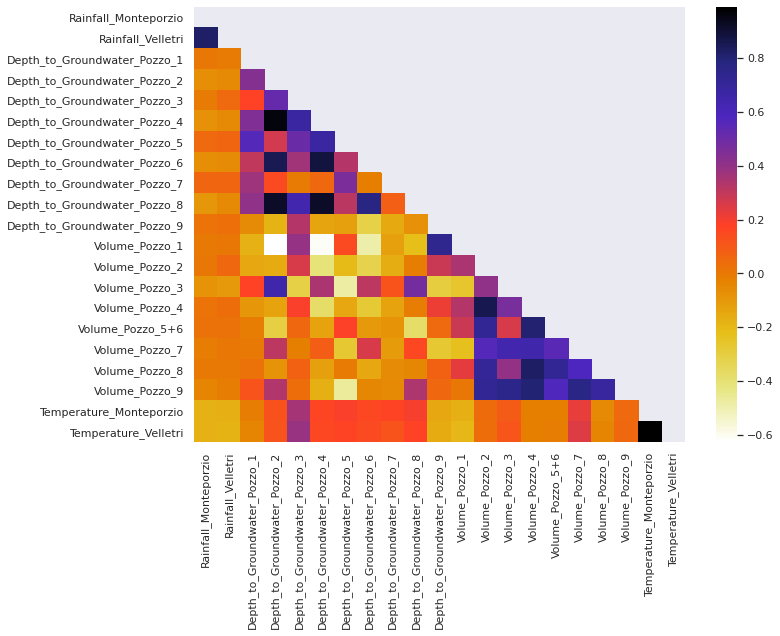

In [ ]:
mask = np.triu(np.ones_like(Aquifer_Doganella.corr(), dtype = bool))
sns.set(rc={'figure.figsize':(11,8)})
sns.heatmap(Aquifer_Doganella.corr(),mask=mask, fmt='', cmap='CMRmap_r')

Graphs depicting relational analysis for target values and features.

In [ ]:
Aquifer_Doganella.columns[1:]

Index(['Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri'],
      dtype='object')

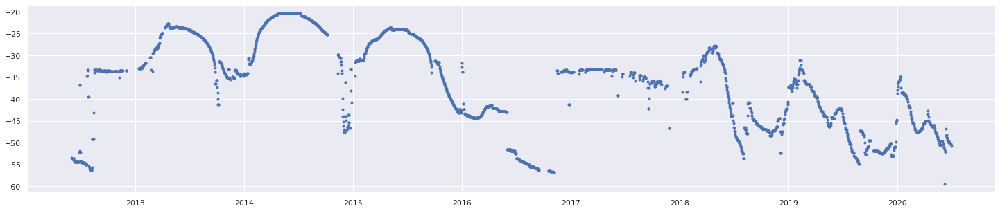

Date


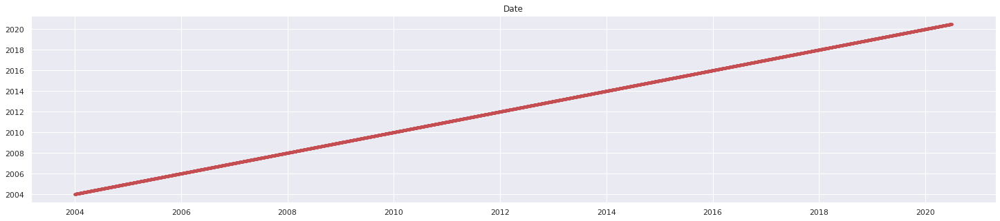

Rainfall_Monteporzio


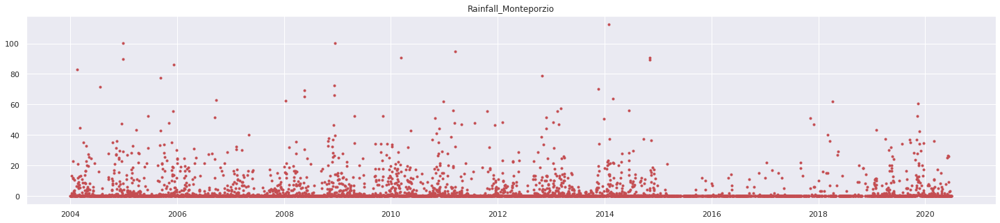

Rainfall_Velletri


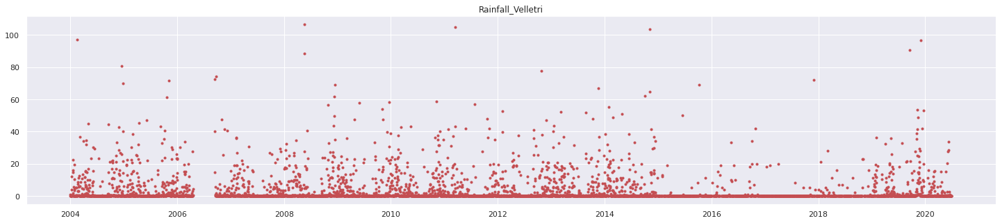

Depth_to_Groundwater_Pozzo_1


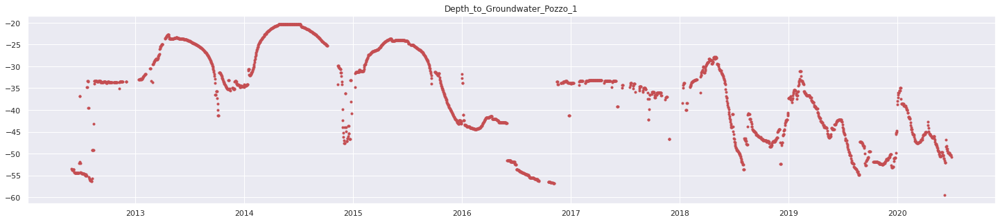

Depth_to_Groundwater_Pozzo_2


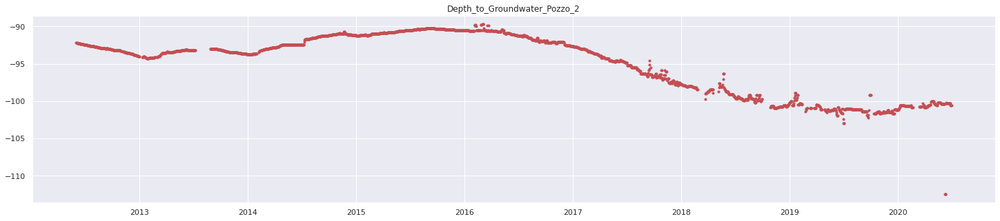

Depth_to_Groundwater_Pozzo_3


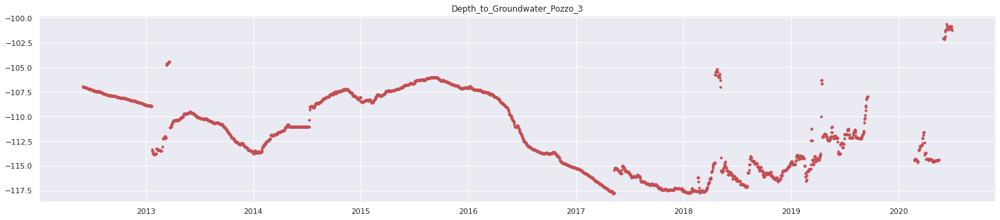

Depth_to_Groundwater_Pozzo_4


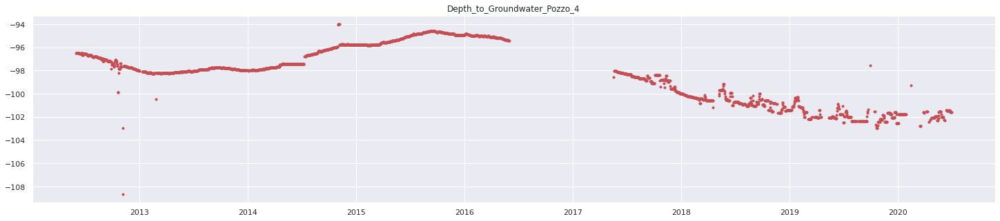

Depth_to_Groundwater_Pozzo_5


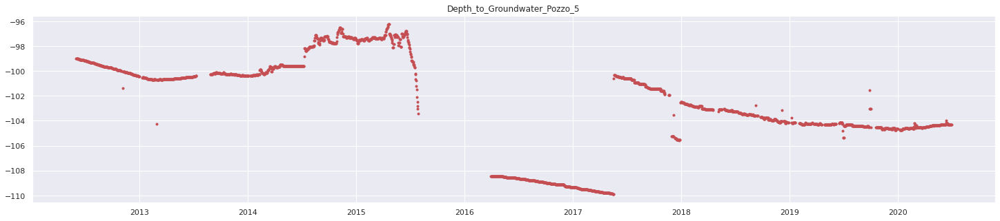

Depth_to_Groundwater_Pozzo_6


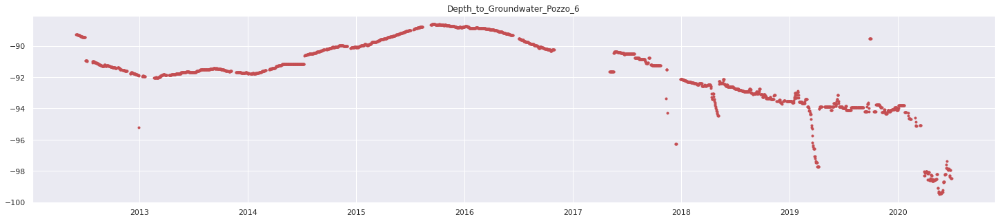

Depth_to_Groundwater_Pozzo_7


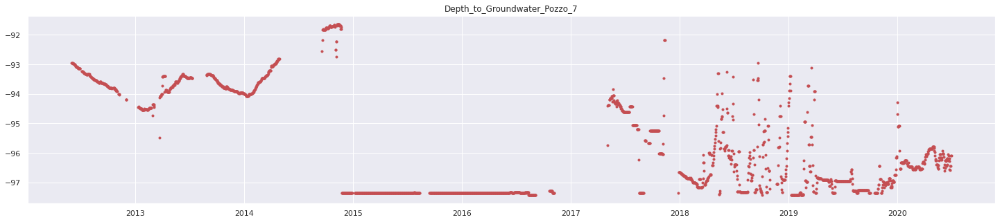

Depth_to_Groundwater_Pozzo_8


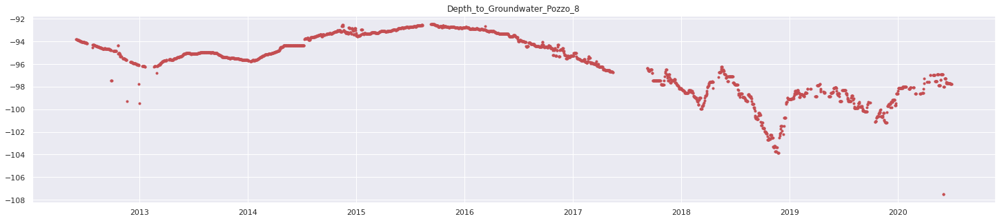

Depth_to_Groundwater_Pozzo_9


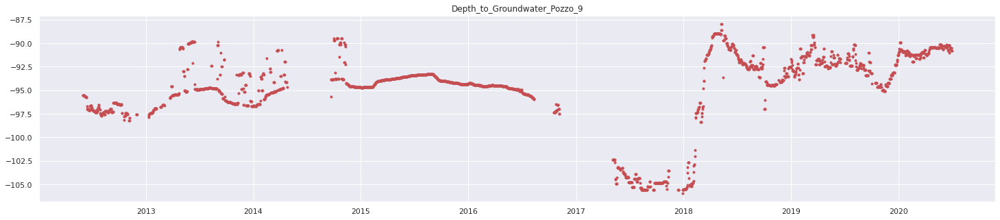

Volume_Pozzo_1


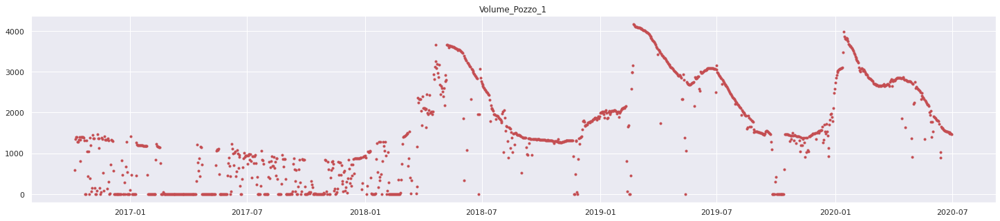

Volume_Pozzo_2


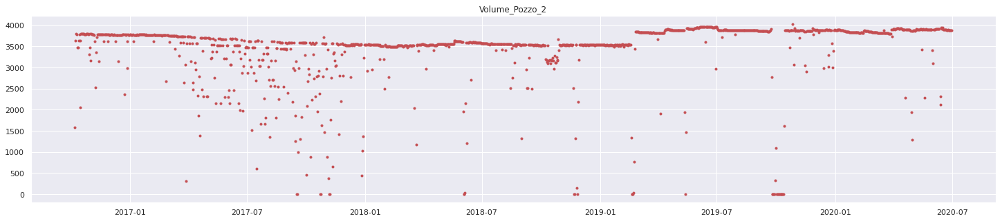

Volume_Pozzo_3


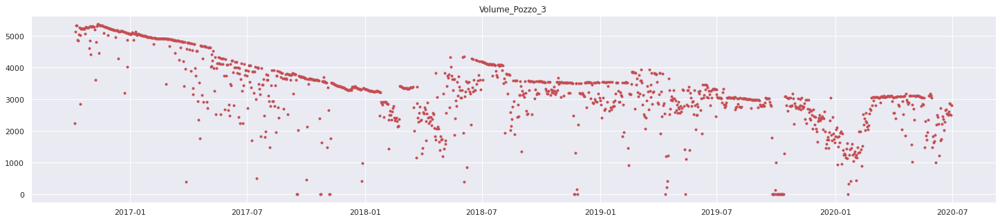

Volume_Pozzo_4


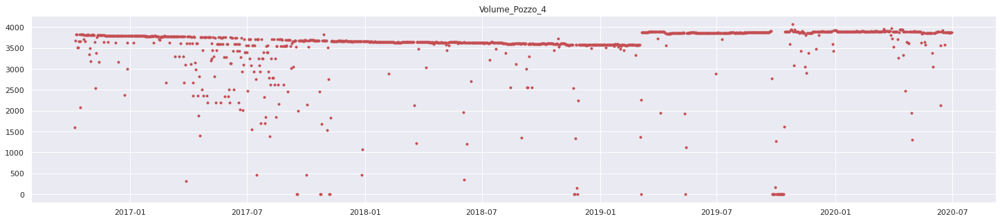

Volume_Pozzo_5+6


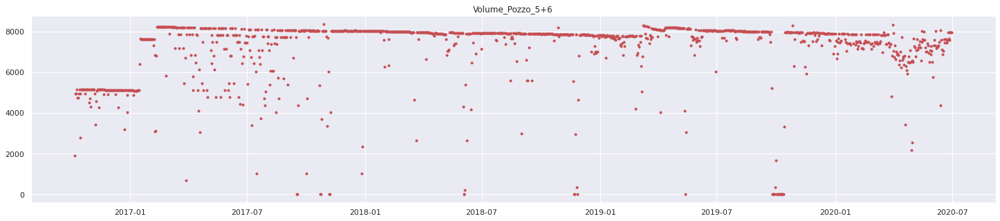

Volume_Pozzo_7


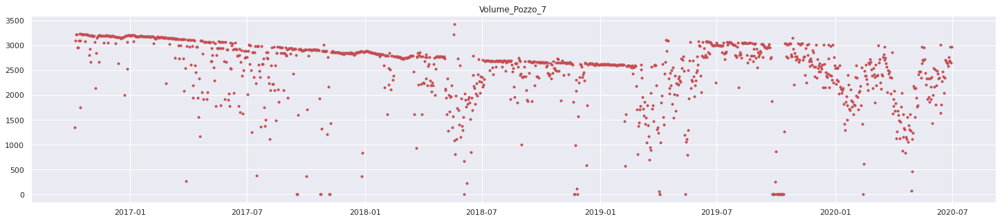

Volume_Pozzo_8


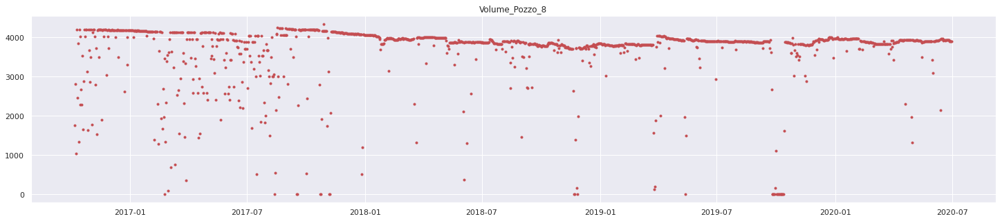

Volume_Pozzo_9


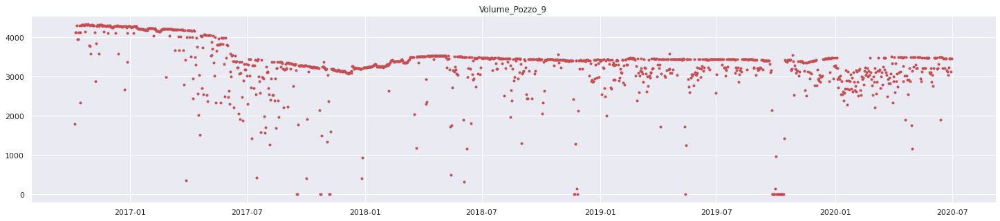

Temperature_Monteporzio


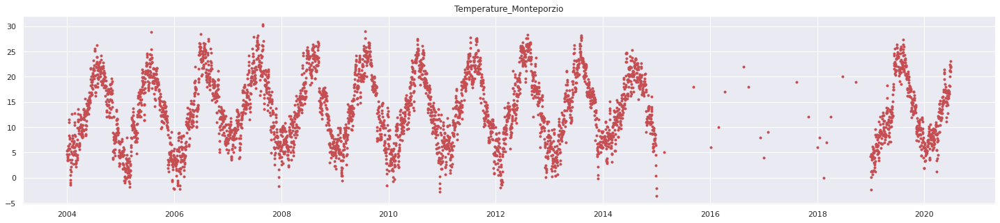

In [ ]:
plt.figure(figsize=(25,5))
plt.plot(Aquifer_Doganella.Date,Aquifer_Doganella['Depth_to_Groundwater_Pozzo_1'],'b.')
plt.show()
for i in range(len(Aquifer_Doganella.columns[1:])):
  col=Aquifer_Doganella.columns[i]
  if col == Aquifer_Doganella_target:
    continue
  print(Aquifer_Doganella.columns[i])
  plt.figure(figsize=(25,5))
  plt.plot(Aquifer_Doganella.Date,Aquifer_Doganella[col],'r.')
  plt.title(col)
  plt.show()

Ovverview of boxplotvafter converting into periods of motnhs and years. We can ignore the old missing data for each of our target variables.

Index(['Date', 'Rainfall_Gallicano', 'Rainfall_Pontetetto',
       'Rainfall_Monte_Serra', 'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano',
       'Rainfall_Piaggione', 'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione'],
      dtype='object')
['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
0   1998-03-05
1   1998-03-06
2   1998-03-07
Name: Date, dtype: datetime64[ns]
8151   2020-06-28
8152   2020-06-29
8153   2020-06-30
Name: Date, dtype: datetime6

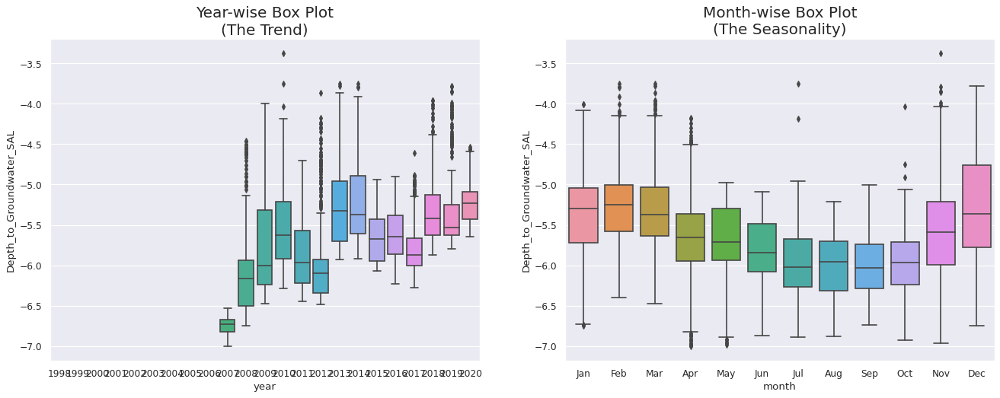

Index(['Date', 'Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri'],
      dtype='object')
['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
0   2004-01-01
1   2004-01-02
2   2004-01-03
Name: Date, dtype: datetime64[ns]
6023   2

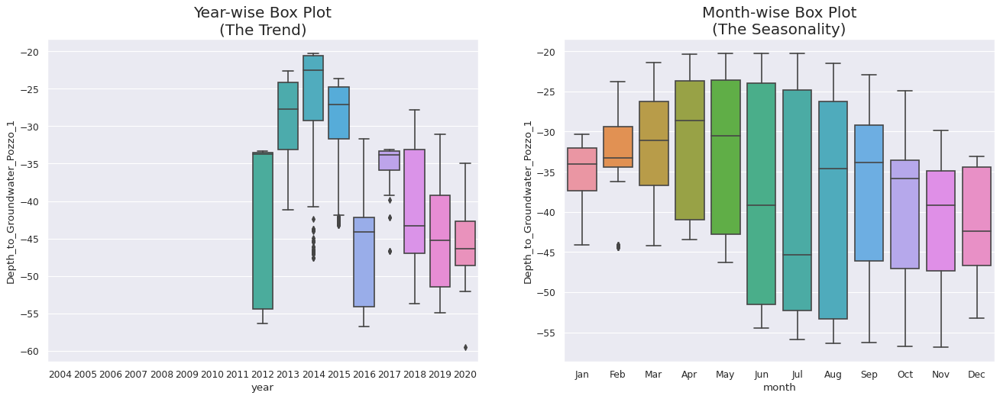

Index(['Date', 'Rainfall_Simignano', 'Rainfall_Siena_Poggio_al_Vento',
       'Rainfall_Mensano', 'Rainfall_Montalcinello',
       'Rainfall_Monticiano_la_Pineta', 'Rainfall_Sovicille',
       'Rainfall_Ponte_Orgia', 'Rainfall_Scorgiano', 'Rainfall_Pentolina',
       'Rainfall_Monteroni_Arbia_Biena', 'Depth_to_Groundwater_Podere_Casetta',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
       'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
       'Temperature_Mensano', 'Temperature_Pentolina',
       'Temperature_Monteroni_Arbia_Biena', 'Volume_Pozzo_1', 'Volume_Pozzo_3',
       'Volume_Pozzo_4'],
      dtype='object')
['Depth_to_Groundwater_Podere_Casetta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 22)


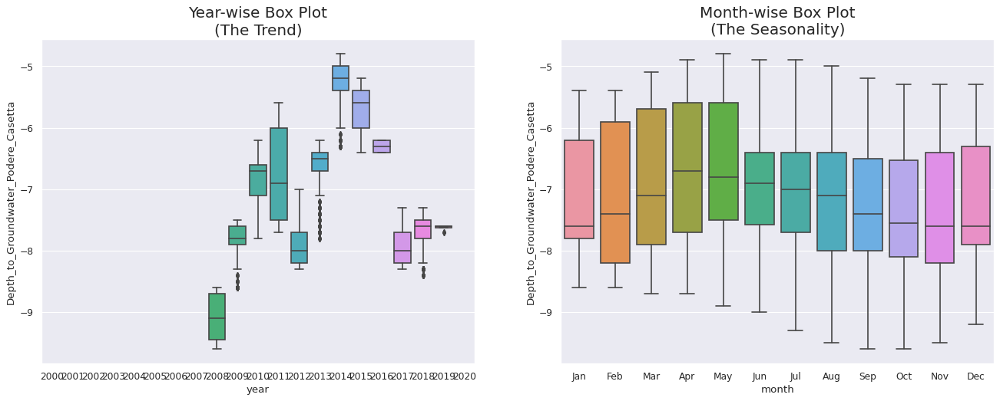

Index(['Date', 'Rainfall_Bastia_Umbra', 'Depth_to_Groundwater_P24',
       'Depth_to_Groundwater_P25', 'Temperature_Bastia_Umbra',
       'Temperature_Petrignano', 'Volume_C10_Petrignano',
       'Hydrometry_Fiume_Chiascio_Petrignano'],
      dtype='object')
['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
0   2006-03-14
1   2006-03-15
2   2006-03-16
Name: Date, dtype: datetime64[ns]
5220   2020-06-28
5221   2020-06-29
5222   2020-06-30
Name: Date, dtype: datetime64[ns]
(5223, 8)


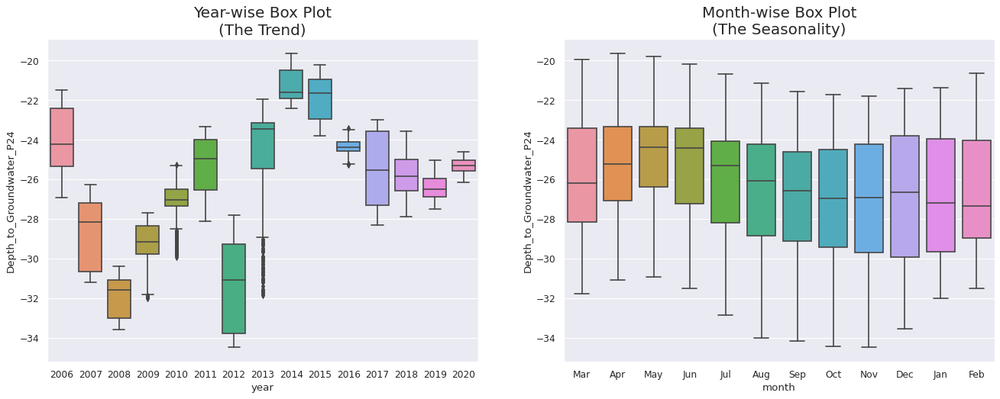

Index(['Date', 'Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_S_Agata',
       'Rainfall_Cavallina', 'Rainfall_Le_Croci', 'Temperature_Le_Croci',
       'Lake_Level', 'Flow_Rate'],
      dtype='object')
['Lake_Level', 'Flow_Rate']
0   2002-06-03
1   2002-06-04
2   2002-06-05
Name: Date, dtype: datetime64[ns]
6600   2020-06-28
6601   2020-06-29
6602   2020-06-30
Name: Date, dtype: datetime64[ns]
(6603, 9)


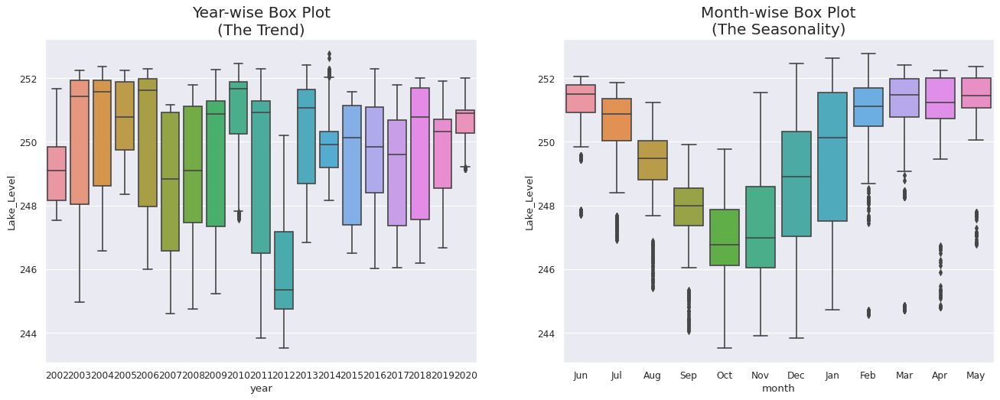

Index(['Date', 'Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_S_Agata',
       'Rainfall_Mangona', 'Rainfall_S_Piero', 'Rainfall_Vernio',
       'Rainfall_Stia', 'Rainfall_Consuma', 'Rainfall_Incisa',
       'Rainfall_Montevarchi', 'Rainfall_S_Savino', 'Rainfall_Laterina',
       'Rainfall_Bibbiena', 'Rainfall_Camaldoli', 'Temperature_Firenze',
       'Hydrometry_Nave_di_Rosano'],
      dtype='object')
['Hydrometry_Nave_di_Rosano']
0   1998-01-01
1   1998-01-02
2   1998-01-03
Name: Date, dtype: datetime64[ns]
8214   2020-06-28
8215   2020-06-29
8216   2020-06-30
Name: Date, dtype: datetime64[ns]
(8217, 17)


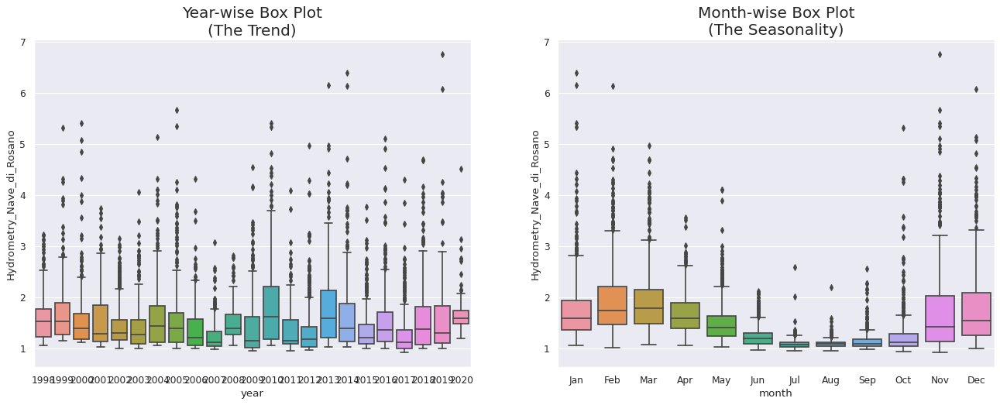

Index(['Date', 'Rainfall_Castel_del_Piano', 'Rainfall_Abbadia_S_Salvatore',
       'Rainfall_S_Fiora', 'Rainfall_Laghetto_Verde', 'Rainfall_Vetta_Amiata',
       'Depth_to_Groundwater_S_Fiora_8', 'Depth_to_Groundwater_S_Fiora_11bis',
       'Depth_to_Groundwater_David_Lazzaretti',
       'Temperature_Abbadia_S_Salvatore', 'Temperature_S_Fiora',
       'Temperature_Laghetto_Verde', 'Flow_Rate_Bugnano', 'Flow_Rate_Arbure',
       'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta'],
      dtype='object')
['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 16)


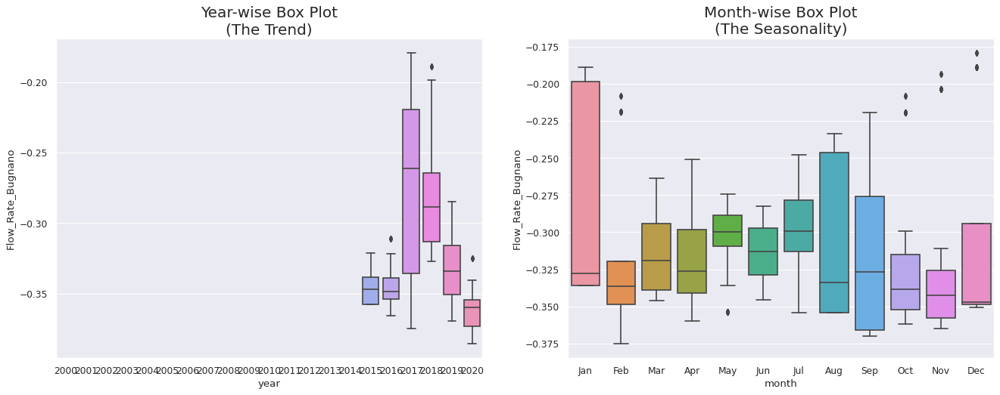

Index(['Date', 'Rainfall_Terni', 'Flow_Rate_Lupa'], dtype='object')
['Flow_Rate_Lupa']
0   2009-01-01
1   2009-01-02
2   2009-01-03
Name: Date, dtype: datetime64[ns]
4196   2020-06-28
4197   2020-06-29
4198   2020-06-30
Name: Date, dtype: datetime64[ns]
(4199, 3)


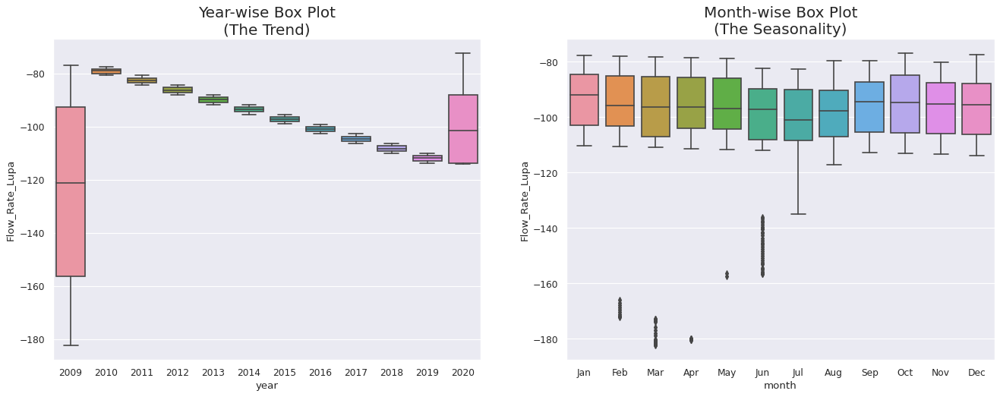

Index(['Date', 'Rainfall_Settefrati', 'Temperature_Settefrati',
       'Flow_Rate_Madonna_di_Canneto'],
      dtype='object')
['Flow_Rate_Madonna_di_Canneto']
0   2012-01-01
1   2012-01-02
2   2012-01-03
Name: Date, dtype: datetime64[ns]
3110   NaT
3111   NaT
3112   NaT
Name: Date, dtype: datetime64[ns]
(3113, 4)


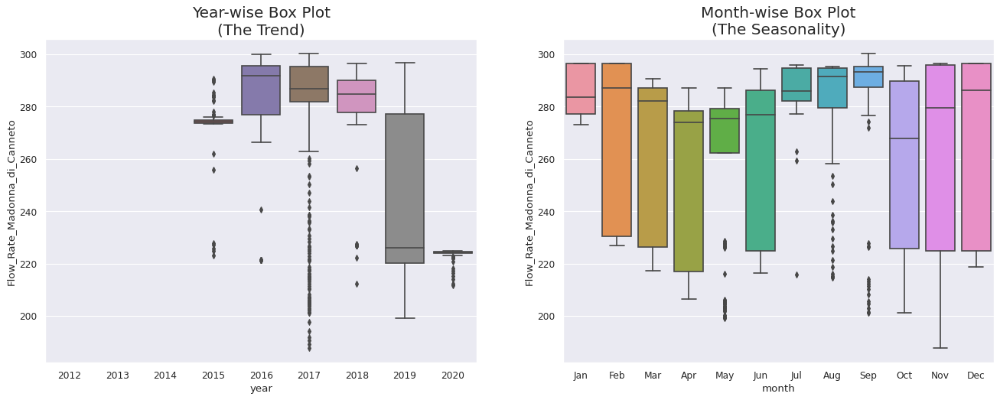

In [ ]:
def box_plot(acea_df,acea_df_target):
  acea_df.replace(0, np.nan, inplace=True)
  acea_df.dropna(subset=['Date'],inplace=True)
  acea_df['year'] = [d.year for d in acea_df.Date]
  acea_df['month'] = [d.strftime('%b') for d in acea_df.Date]
  years = acea_df['year'].unique()
  for target in acea_df_target:
    fig, axes = plt.subplots(1, 2, figsize=(20,7), dpi= 80)
    sns.boxplot(x='year', y=target, data=acea_df, ax=axes[0])
    sns.boxplot(x='month', y=target, data=acea_df.loc[~acea_df.year.isin([1998, 2020]), :])
    # Set Title
    axes[0].set_title('Year-wise Box Plot\n(The Trend)', fontsize=18); 
    axes[1].set_title('Month-wise Box Plot\n(The Seasonality)', fontsize=18)
    plt.show()
    return acea_df

for i,(acea_df,acea_df_target) in enumerate(zip(all_data,all_data_target)):
    print(acea_df.columns)
    print(acea_df_target)
    print(acea_df.Date.head(3))
    print(acea_df.Date.tail(3))
    print(acea_df.shape)
    all_data[i] = box_plot(acea_df,acea_df_target)


In [ ]:
year_to_select =  [2006,2012,2008,2006,2002,1998,2015,2009,2015]

Null values recognition.

Index(['Date', 'Rainfall_Gallicano', 'Rainfall_Pontetetto',
       'Rainfall_Monte_Serra', 'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano',
       'Rainfall_Piaggione', 'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
0   1998-03-05
1   1998-03-06
2   1998-03-07
Name: Date, dtype: datetime64[ns]
8151   2020-06-28
8152   2020-06-29
8153   2020-06-30
Name: Date,

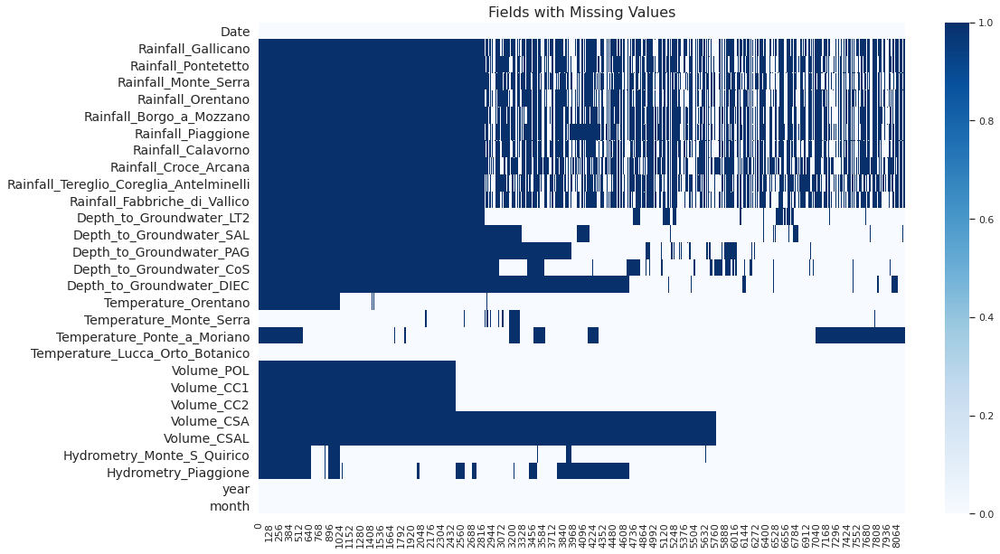

Index(['Date', 'Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
0   2004-01-01
1   2004-01-02
2   2004-01-03
Name: Date, dtype: dateti

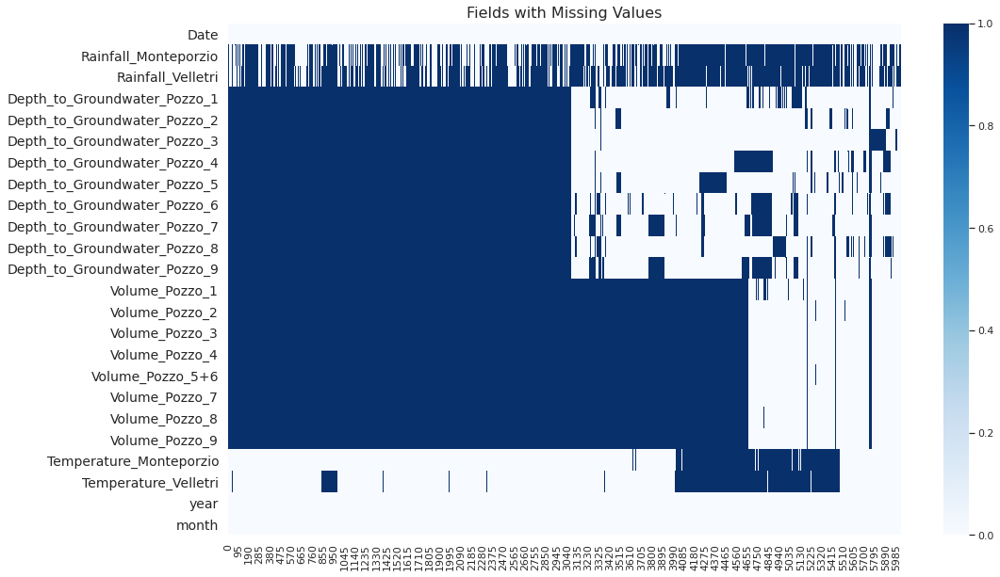

Index(['Date', 'Rainfall_Simignano', 'Rainfall_Siena_Poggio_al_Vento',
       'Rainfall_Mensano', 'Rainfall_Montalcinello',
       'Rainfall_Monticiano_la_Pineta', 'Rainfall_Sovicille',
       'Rainfall_Ponte_Orgia', 'Rainfall_Scorgiano', 'Rainfall_Pentolina',
       'Rainfall_Monteroni_Arbia_Biena', 'Depth_to_Groundwater_Podere_Casetta',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
       'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
       'Temperature_Mensano', 'Temperature_Pentolina',
       'Temperature_Monteroni_Arbia_Biena', 'Volume_Pozzo_1', 'Volume_Pozzo_3',
       'Volume_Pozzo_4', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_Podere_Casetta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 24)


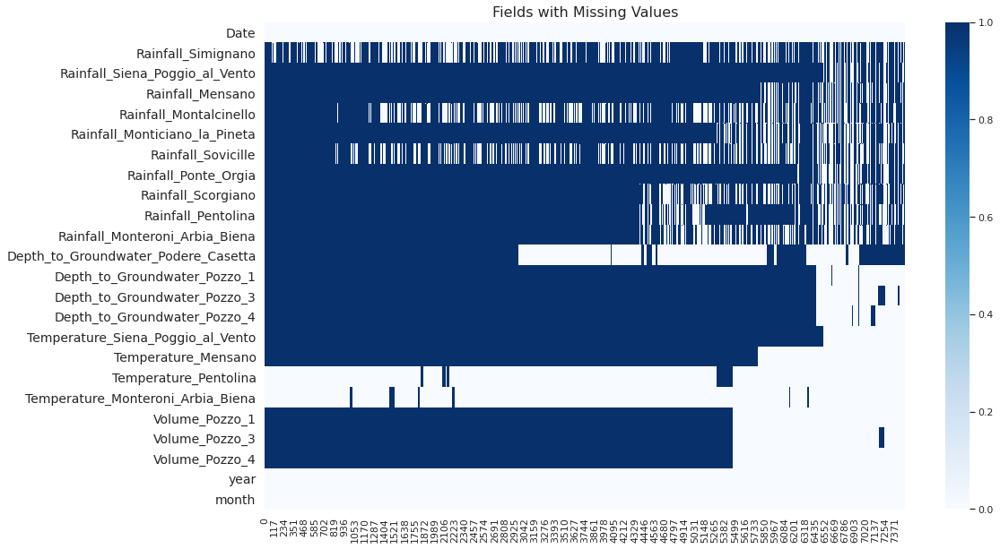

Index(['Date', 'Rainfall_Bastia_Umbra', 'Depth_to_Groundwater_P24',
       'Depth_to_Groundwater_P25', 'Temperature_Bastia_Umbra',
       'Temperature_Petrignano', 'Volume_C10_Petrignano',
       'Hydrometry_Fiume_Chiascio_Petrignano', 'year', 'month'],
      dtype='object')
['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
0   2006-03-14
1   2006-03-15
2   2006-03-16
Name: Date, dtype: datetime64[ns]
5220   2020-06-28
5221   2020-06-29
5222   2020-06-30
Name: Date, dtype: datetime64[ns]
(5223, 10)


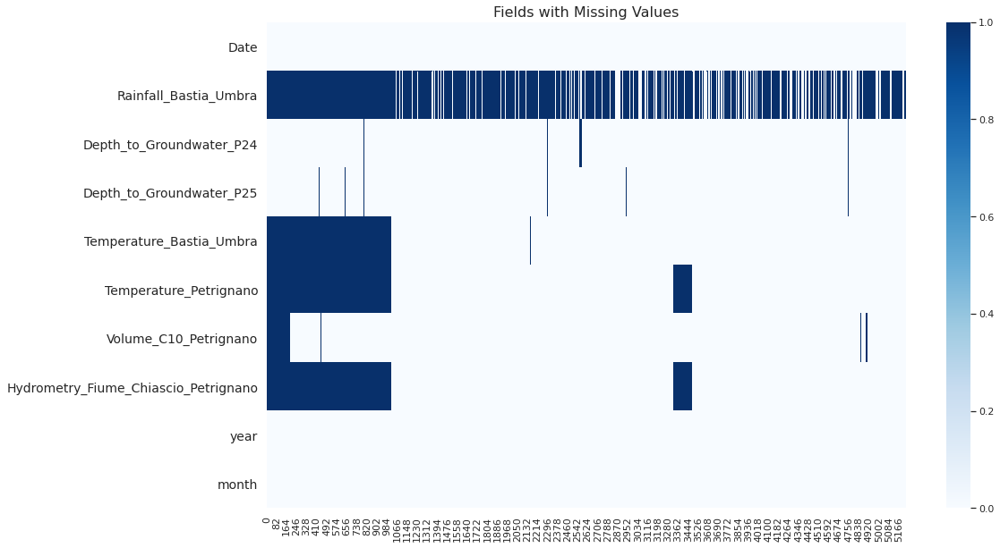

Index(['Date', 'Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_S_Agata',
       'Rainfall_Cavallina', 'Rainfall_Le_Croci', 'Temperature_Le_Croci',
       'Lake_Level', 'Flow_Rate', 'year', 'month'],
      dtype='object')
['Lake_Level', 'Flow_Rate']
0   2002-06-03
1   2002-06-04
2   2002-06-05
Name: Date, dtype: datetime64[ns]
6600   2020-06-28
6601   2020-06-29
6602   2020-06-30
Name: Date, dtype: datetime64[ns]
(6603, 11)


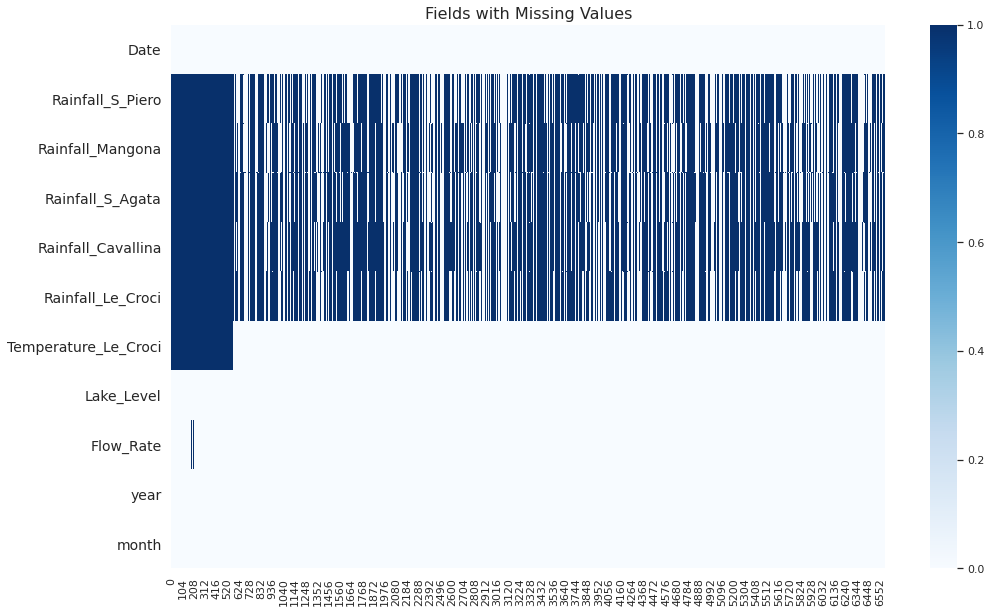

Index(['Date', 'Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_S_Agata',
       'Rainfall_Mangona', 'Rainfall_S_Piero', 'Rainfall_Vernio',
       'Rainfall_Stia', 'Rainfall_Consuma', 'Rainfall_Incisa',
       'Rainfall_Montevarchi', 'Rainfall_S_Savino', 'Rainfall_Laterina',
       'Rainfall_Bibbiena', 'Rainfall_Camaldoli', 'Temperature_Firenze',
       'Hydrometry_Nave_di_Rosano', 'year', 'month'],
      dtype='object')
['Hydrometry_Nave_di_Rosano']
0   1998-01-01
1   1998-01-02
2   1998-01-03
Name: Date, dtype: datetime64[ns]
8214   2020-06-28
8215   2020-06-29
8216   2020-06-30
Name: Date, dtype: datetime64[ns]
(8217, 19)


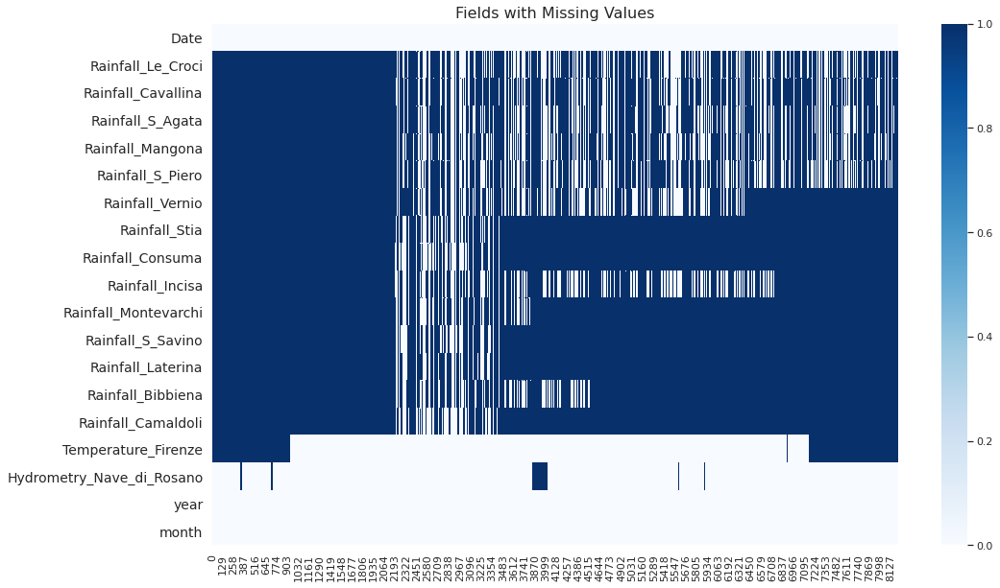

Index(['Date', 'Rainfall_Castel_del_Piano', 'Rainfall_Abbadia_S_Salvatore',
       'Rainfall_S_Fiora', 'Rainfall_Laghetto_Verde', 'Rainfall_Vetta_Amiata',
       'Depth_to_Groundwater_S_Fiora_8', 'Depth_to_Groundwater_S_Fiora_11bis',
       'Depth_to_Groundwater_David_Lazzaretti',
       'Temperature_Abbadia_S_Salvatore', 'Temperature_S_Fiora',
       'Temperature_Laghetto_Verde', 'Flow_Rate_Bugnano', 'Flow_Rate_Arbure',
       'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta', 'year', 'month'],
      dtype='object')
['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
0   2000-01-01
1   2000-01-02
2   2000-01-03
Name: Date, dtype: datetime64[ns]
7484   2020-06-28
7485   2020-06-29
7486   2020-06-30
Name: Date, dtype: datetime64[ns]
(7487, 18)


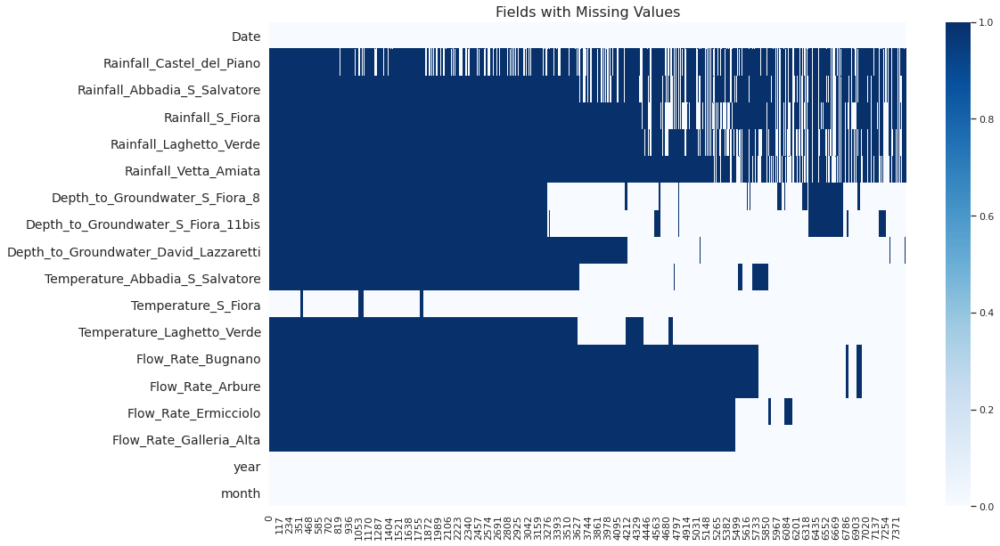

Index(['Date', 'Rainfall_Terni', 'Flow_Rate_Lupa', 'year', 'month'], dtype='object')
['Flow_Rate_Lupa']
0   2009-01-01
1   2009-01-02
2   2009-01-03
Name: Date, dtype: datetime64[ns]
4196   2020-06-28
4197   2020-06-29
4198   2020-06-30
Name: Date, dtype: datetime64[ns]
(4199, 5)


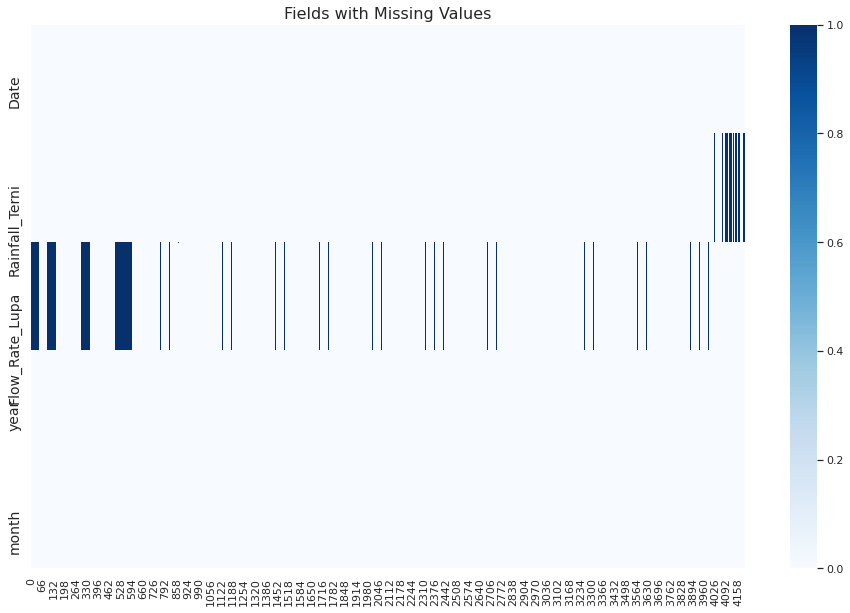

Index(['Date', 'Rainfall_Settefrati', 'Temperature_Settefrati',
       'Flow_Rate_Madonna_di_Canneto', 'year', 'month'],
      dtype='object')
['Flow_Rate_Madonna_di_Canneto']
0   2012-01-01
1   2012-01-02
2   2012-01-03
Name: Date, dtype: datetime64[ns]
3101   2020-06-28
3102   2020-06-29
3103   2020-06-30
Name: Date, dtype: datetime64[ns]
(3104, 6)


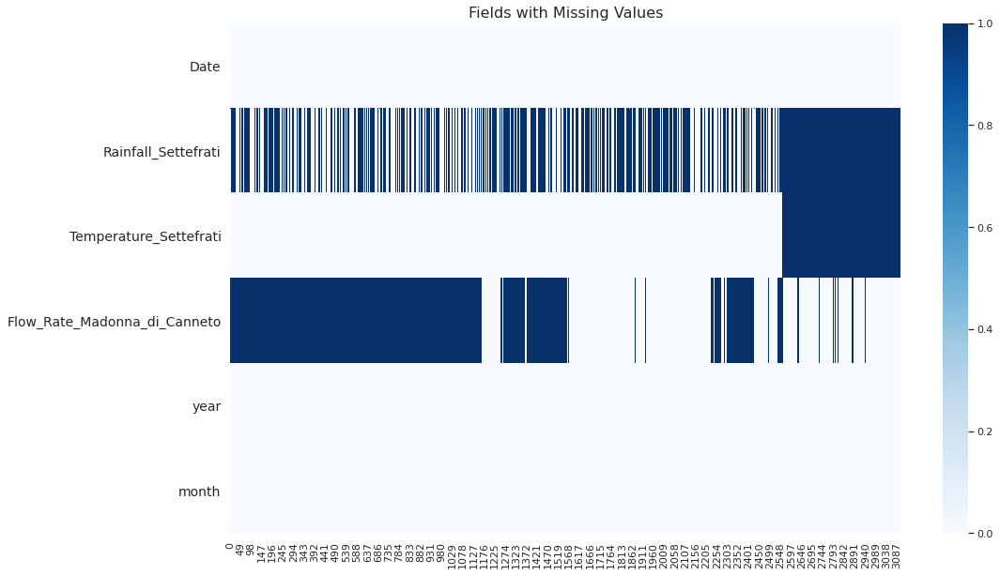

In [ ]:
def nagraph(acea_df):
    f, ax = plt.subplots(nrows=1, ncols=1, figsize=(16,10))
    sns.heatmap(acea_df.T.isna(), cmap='Blues')
    ax.set_title('Fields with Missing Values', fontsize=16)
    for tick in ax.yaxis.get_major_ticks():
        tick.label.set_fontsize(14)
    plt.show()
    
for acea_df,acea_df_target in zip(all_data,all_data_target):
    print(acea_df.columns)
    print(acea_df_target)
    print(acea_df.Date.head(3))
    print(acea_df.Date.tail(3))
    print(acea_df.shape)
    nagraph(acea_df)

###Stationarity test
(Nans and inf not allowed)
more negative the value the more likely we are to reject null hypothesis(stationary)

In [ ]:
Aquifer_Doganella.drop(Aquifer_Doganella_target,axis=1)

,Date,Rainfall_Monteporzio,Rainfall_Velletri,Volume_Pozzo_1,Volume_Pozzo_2,Volume_Pozzo_3,Volume_Pozzo_4,Volume_Pozzo_5+6,Volume_Pozzo_7,Volume_Pozzo_8,Volume_Pozzo_9,Temperature_Monteporzio,Temperature_Velletri,year,month
0,2004-01-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.30,8.60,2004,Jan
1,2004-01-02,0.2,0.8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.70,6.25,2004,Jan
2,2004-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.40,9.80,2004,Jan
3,2004-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.35,5.95,2004,Jan
4,2004-01-05,0.2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.60,5.85,2004,Jan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6021,2020-06-26,NaN,NaN,1516.104,3883.932,2526.516,3867.876,7949.304,2684.412,3911.832,3450.132,21.05,23.39,2020,Jun
6022,2020-06-27,NaN,NaN,1491.408,3884.724,2871.864,3867.300,7590.564,2681.280,3899.772,3449.088,22.18,24.44,2020,Jun
6023,2020-06-28,NaN,NaN,1485.756,3885.228,2858.400,3869.352,7944.660,2962.980,3901.032,3449.808,23.06,25.43,2020,Jun
6024,2020-06-29,NaN,NaN,1479.636,3888.684,2499.444,3873.096,7947.684,2653.884,3904.776,3129.336,22.03,24.22,2020,Jun


In [ ]:
from statsmodels.tsa.stattools import adfuller

## Data Preprocessing

In [ ]:
def select_dates(acea_df,year):
    acea_df['year'] = pd.DatetimeIndex(acea_df['Date']).year 
    acea_df = acea_df[acea_df.year>year-1]
    print(acea_df.head())
    return acea_df

for i,(acea_df,year) in enumerate(zip(all_data,year_to_select)):
  all_data[i] = select_dates(acea_df,year)

           Date  Rainfall_Gallicano  ...  year  month
2859 2006-01-01                37.2  ...  2006    Jan
2860 2006-01-02                 3.2  ...  2006    Jan
2861 2006-01-03                 0.2  ...  2006    Jan
2862 2006-01-04                 NaN  ...  2006    Jan
2863 2006-01-05                 NaN  ...  2006    Jan

[5 rows x 29 columns]
           Date  Rainfall_Monteporzio  ...  year  month
2922 2012-01-01                   NaN  ...  2012    Jan
2923 2012-01-02                   1.8  ...  2012    Jan
2924 2012-01-03                  11.0  ...  2012    Jan
2925 2012-01-04                   1.0  ...  2012    Jan
2926 2012-01-05                   0.2  ...  2012    Jan

[5 rows x 24 columns]
           Date  Rainfall_Simignano  ...  year  month
2922 2008-01-01                 NaN  ...  2008    Jan
2923 2008-01-02                 NaN  ...  2008    Jan
2924 2008-01-03                 NaN  ...  2008    Jan
2925 2008-01-04                 4.0  ...  2008    Jan
2926 2008-01-05         

### Feature Selection

In [ ]:
!pip install shap

     |████████████████████████████████| 358kB 5.6MB/s 
  Created wheel for shap: filename=shap-0.38.1-cp36-cp36m-linux_x86_64.whl size=489390 sha256=b3d9335df793f6e48380e1d37de06dc846c918e4b54136f072493e25be42944c
  Stored in directory: /root/.cache/pip/wheels/a8/fb/e4/88012be41842b9be62ae18d82d1b1e880daf8539d1fef1fa00
Successfully built shap


In [ ]:
def data_impute(acea_df):
    from sklearn.model_selection import train_test_split
    from sklearn.metrics import mean_absolute_error
    import lightgbm as lgb


    features_to_fill = acea_df.columns[:-2]

    temp_df = acea_df[features_to_fill].copy()

    # Create time related features
    temp_df['year'] = pd.DatetimeIndex(temp_df['Date']).year 

    temp_df['month'] = pd.DatetimeIndex(temp_df['Date']).month 
    month_in_year = 12
    temp_df['month_sin'] = np.sin(2*np.pi*temp_df.month/month_in_year)
    temp_df['month_cos'] = np.cos(2*np.pi*temp_df.month/month_in_year)

    temp_df['season'] = temp_df.month%12 // 3 + 1

    temp_df['day_of_year'] = pd.DatetimeIndex(temp_df['Date']).dayofyear
    days_in_year = 365.25
    temp_df['day_of_year_sin'] = np.sin(2*np.pi*temp_df.day_of_year/days_in_year)
    temp_df['day_of_year_cos'] = np.cos(2*np.pi*temp_df.day_of_year/days_in_year)

    temp_df['week_of_year'] = pd.DatetimeIndex(temp_df['Date']).weekofyear
    weeks_in_year = 52.1429
    temp_df['week_of_year_sin'] = np.sin(2*np.pi*temp_df.week_of_year/weeks_in_year)
    temp_df['week_of_year_cos'] = np.cos(2*np.pi*temp_df.week_of_year/weeks_in_year)
    
    features = ['month_sin', 'month_cos', 'day_of_year_sin', 'day_of_year_cos', 'week_of_year_sin', 'week_of_year_cos', 'year', 'season']
    temp_df.drop(['month'],axis=1,inplace=True)
    for attribute in features_to_fill[1:]:
          target = attribute
          X = temp_df[temp_df[attribute].notna()][features]#.reset_index(drop=True)
          y = temp_df[temp_df[attribute].notna()][target]#.reset_index(drop=True)
          print(X.shape)
          print(y.shape)
          X_train, X_valid, y_train, y_valid = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True)

          X_test = temp_df[features]#.reset_index(drop=True)
          # Model
          params = {'num_leaves': 32,
                    'objective': 'regression_l1',
                    'max_depth': 8,
                    'learning_rate': 0.05,
                    "metric": 'mae',
                    'seed' : 42
                  }

          dtrain = lgb.Dataset(X_train, y_train)
          dvalid = lgb.Dataset(X_valid, y_valid)

          clf = lgb.train(params, dtrain, 10000, valid_sets = [dtrain, dvalid], verbose_eval=False,  early_stopping_rounds=100)

          y_pred_valid = clf.predict(X_valid)
          
          old = temp_df[attribute].copy()
          y_pred = clf.predict(X_test)
          #replacing of actual null values here
          acea_df[attribute] = np.where(acea_df[attribute].isna(), y_pred, acea_df[attribute])

          f, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 3))

          sns.lineplot(x=acea_df.Date, y=acea_df[attribute], color='red',label='predicted')
          sns.lineplot(x=acea_df.Date, y=old.fillna(np.inf), color='blue', label = 'original')
          plt.show()
          """ax.set_title('Fill NaN by Prediction', fontsize=14)
          ax.set_ylabel(ylabel=attribute, fontsize=14)
          ax.set_xlim([date(1998, 1, 1), date(2020, 6, 30)])
          plt.show()"""
    try:
        acea_df.drop(['Date','month'],axis=1,inplace=True)
    except:
        acea_df.drop(['Date'],axis=1,inplace=True)
    return acea_df

# LSTM

# Models

In [ ]:
#!pip install tensorflow==2.2.1

In [ ]:
import numpy
import matplotlib.pyplot as plt
import pandas as pd
import math
import tensorflow as tf
print(tf.__version__)
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import shap

2.4.1


In [ ]:
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):
	n_vars = 1 if type(data) is list else data.shape[1]
	df = pd.DataFrame(data)
	cols, names = list(), list()
	# input sequence (t-n, ... t-1)
	for i in range(n_in, 0, -1):
		cols.append(df.shift(i))
		names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
	# forecast sequence (t, t+1, ... t+n)
	for i in range(0, n_out):
		cols.append(df.shift(-i))
		if i == 0:
			names += [('var%d(t)' % (j+1)) for j in range(n_vars)]
		else:
			names += [('var%d(t+%d)' % (j+1, i)) for j in range(n_vars)]
	# put it all together
	agg = pd.concat(cols, axis=1)
	agg.columns = names
	# drop rows with NaN values
	if dropnan:
		agg.dropna(inplace=True)
	return agg

In [ ]:
def get_model(trainX):
        model = Sequential()
        model.add(LSTM(50, activation='relu', input_shape=(trainX.shape[1], trainX.shape[2])))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

In [ ]:
def forecast(acea_df,acea_df_target):
    dataset = acea_df.copy()
    print(dataset.columns)
    values = dataset.values
    # ensure all data is float
    values = values.astype('float32')
    # normalize features
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled = scaler.fit_transform(values)
    print(scaler.min_[0],scaler.scale_[0])
    
    # frame as supervised learning
    reframed = series_to_supervised(scaled, 1, 1)
    # drop columns we don't want to predict
    cols_to_drop = [len(acea_df.columns) + acea_df.columns.get_loc(c) for c in acea_df if c not in acea_df_target]
    reframed.drop(reframed.columns[cols_to_drop], axis=1, inplace=True)
    print(reframed.columns)
    values = reframed.values

    train_size = int(len(values) * 0.7)
    test_size = len(values) - train_size

    train, test = values[0:train_size,:], values[train_size:len(values),:]
    scale = MinMaxScaler(feature_range=(0, 1))
    scale.min_,scale.scale_ = scaler.min_[0],scaler.scale_[0]

    for i in range(1,len(acea_df.columns)-len(cols_to_drop)+1):
        trainX, trainY = train[:, :len(acea_df.columns)], train[:, -i]
        testX, testY = test[:, :len(acea_df.columns)], test[:, -i]

        print(len(train), len(test))

        trainX = trainX.reshape((trainX.shape[0], 1, trainX.shape[1]))
        testX = testX.reshape((testX.shape[0], 1, testX.shape[1]))

        print(trainX.shape, trainY.shape, testX.shape, testY.shape)

        model = get_model(testX)
        grads = gradient_importance(trainX, model)
        print(grads)
        print('Mean:', np.mean(grads))
        print('Standard Deviation:', np.std(grads))
        plt.figure(figsize=(20,10))
        plt.bar(acea_df.columns,grads)
        plt.xticks(acea_df.columns, rotation=90)
        plt.show()
        #|
        idx = np.nonzero((grads > 0.02) | (grads < -0.02))
        print("Selected Features - " + str(idx))

        foo = trainX[:,:,idx]
        print("foo shape - "+ str(foo.shape))
        trainX = np.squeeze(foo, axis=(1,))
        print("Train reshape - " + str(trainX.shape))
        foo = testX[:,:,idx]
        print("foo shape - "+ str(foo.shape))
        testX = np.squeeze(foo, axis=(1,))
        print("Test reshape - " + str(testX.shape))  

        model = get_model(trainX)
        history = model.fit(trainX, trainY, epochs=100, validation_data=(testX, testY), verbose=2, shuffle=False)

        yhat = model.predict(testX)
        testX = testX.reshape((testX.shape[0], testX.shape[2]))
        print(testX.shape)

        inv_yhat = np.concatenate((yhat, testX[:, 1:]), axis=1)
        inv_yhat = scale.inverse_transform(inv_yhat)
        inv_yhat = inv_yhat[:,0]

        testY = testY.reshape((len(testY), 1))
        inv_y = np.concatenate((testY, testX[:, 1:]), axis=1)
        inv_y = scale.inverse_transform(inv_y)
        inv_y = inv_y[:,0]

        rmse = math.sqrt(mean_squared_error(inv_y, inv_yhat))
        print('Test RMSE: %.3f' % rmse)
        plt.plot(inv_yhat)
        plt.plot(inv_y)
        plt.show()
        plt.plot(history.history['loss'], label='train')
        plt.plot(history.history['val_loss'], label='test')
        plt.legend()
        plt.show()

In [ ]:
for acea_df,acea_df_target in zip(all_data,all_data_target):
    print(acea_df_target)

['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
['Depth_to_Groundwater_Podere_Casetta']
['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
['Lake_Level', 'Flow_Rate']
['Hydrometry_Nave_di_Rosano']
['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
['Flow_Rate_Lupa']
['Flow_Rate_Madonna_di_Canneto']


In [ ]:
def gradient_importance(seq, model):
    seq = tf.Variable(seq, dtype=tf.float32)
    with tf.GradientTape() as tape:
        predictions = model(seq)
    grads = tape.gradient(predictions, seq)
    grads = tf.reduce_mean(grads, axis=1).numpy()[0]
    return grads

In [ ]:
!pip install matplotlib

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


(4096, 8)
(4096,)


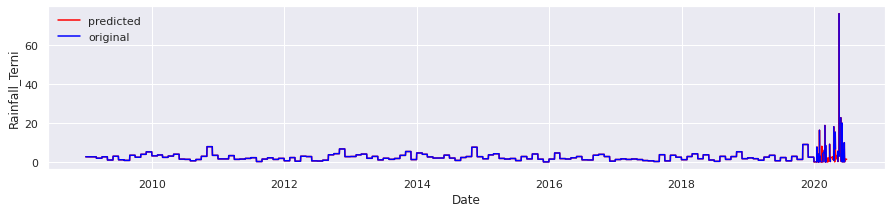

(3816, 8)
(3816,)


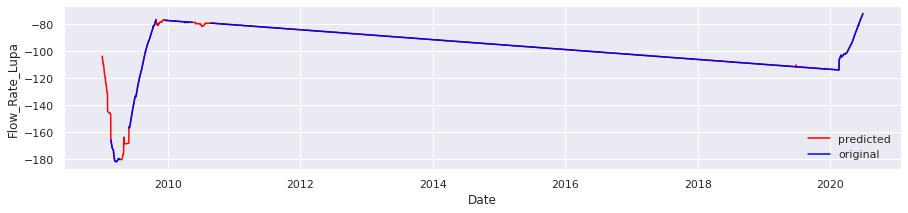

Index(['Rainfall_Terni', 'Flow_Rate_Lupa', 'year'], dtype='object')
-0.0024269284 0.013189828
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var2(t)'], dtype='object')
2938 1260
(2938, 1, 3) (2938,) (1260, 1, 3) (1260,)
[-0.01226299  0.00750967  0.00226856]
Mean: -0.00082825014
Standard Deviation: 0.008363901


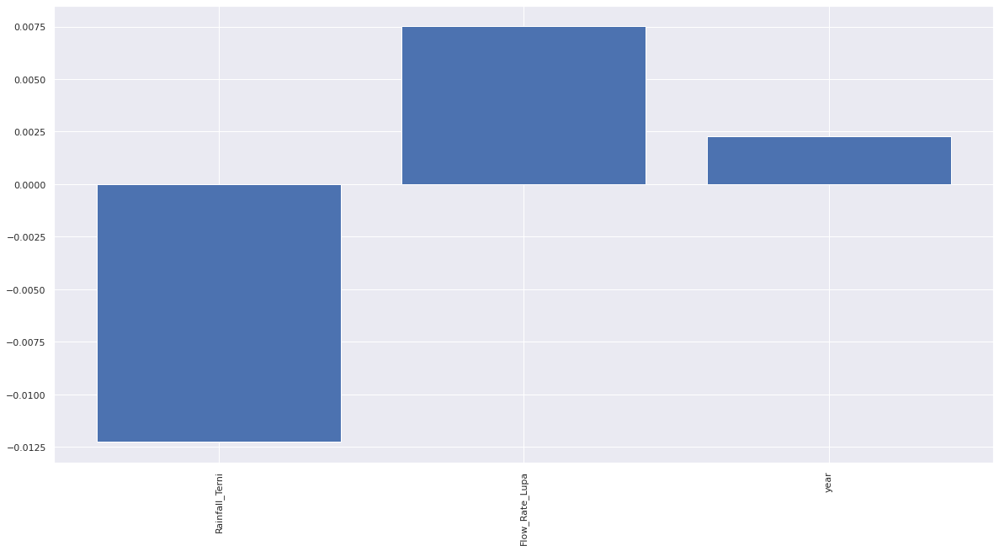

Selected Features - (array([], dtype=int64),)
foo shape - (2938, 1, 1, 0)
Train reshape - (2938, 1, 0)
foo shape - (1260, 1, 1, 0)
Test reshape - (1260, 1, 0)
Epoch 1/100
92/92 - 2s - loss: 0.5996 - val_loss: 0.3602
Epoch 2/100
92/92 - 0s - loss: 0.4784 - val_loss: 0.2683
Epoch 3/100
92/92 - 0s - loss: 0.3779 - val_loss: 0.1949
Epoch 4/100
92/92 - 0s - loss: 0.2959 - val_loss: 0.1375
Epoch 5/100
92/92 - 0s - loss: 0.2299 - val_loss: 0.0937
Epoch 6/100
92/92 - 0s - loss: 0.1777 - val_loss: 0.0613
Epoch 7/100
92/92 - 0s - loss: 0.1371 - val_loss: 0.0382
Epoch 8/100
92/92 - 0s - loss: 0.1063 - val_loss: 0.0226
Epoch 9/100
92/92 - 0s - loss: 0.0832 - val_loss: 0.0126
Epoch 10/100
92/92 - 0s - loss: 0.0663 - val_loss: 0.0069
Epoch 11/100
92/92 - 0s - loss: 0.0543 - val_loss: 0.0043
Epoch 12/100
92/92 - 0s - loss: 0.0460 - val_loss: 0.0037
Epoch 13/100
92/92 - 0s - loss: 0.0403 - val_loss: 0.0044
Epoch 14/100
92/92 - 0s - loss: 0.0366 - val_loss: 0.0057
Epoch 15/100
92/92 - 0s - loss: 0.0342

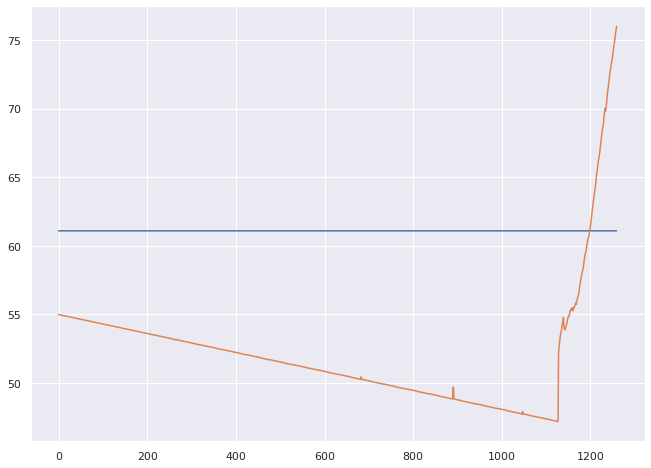

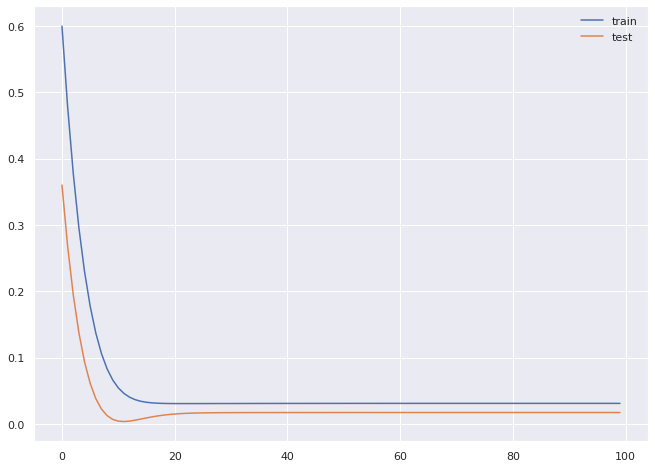

In [ ]:
acea_df = data_impute(Water_Spring_Lupa)
forecast(acea_df,Water_Spring_Lupa_target)

Dataset for imputation -            Date  Rainfall_Gallicano  ...  year  month
2859 2006-01-01                37.2  ...  2006    Jan
2860 2006-01-02                 3.2  ...  2006    Jan
2861 2006-01-03                 0.2  ...  2006    Jan
2862 2006-01-04                 NaN  ...  2006    Jan
2863 2006-01-05                 NaN  ...  2006    Jan
...         ...                 ...  ...   ...    ...
8149 2020-06-26                 NaN  ...  2020    Jun
8150 2020-06-27                 NaN  ...  2020    Jun
8151 2020-06-28                 NaN  ...  2020    Jun
8152 2020-06-29                 NaN  ...  2020    Jun
8153 2020-06-30                 NaN  ...  2020    Jun

[5295 rows x 29 columns]
(2085, 8)
(2085,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


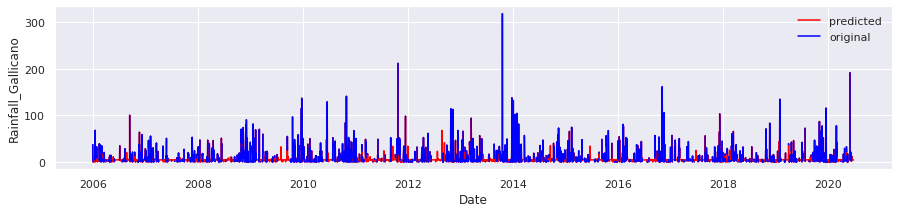

(1945, 8)
(1945,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


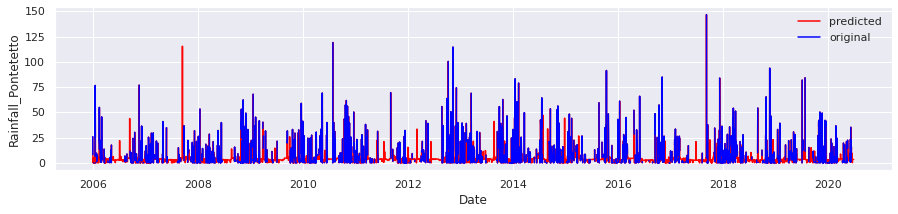

(2143, 8)
(2143,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


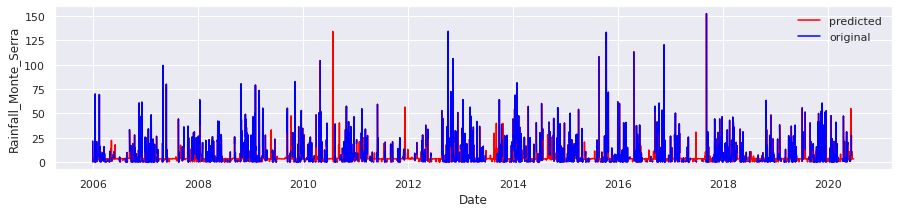

(2108, 8)
(2108,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


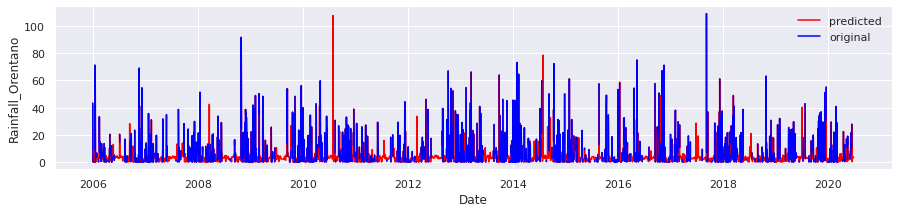

(2002, 8)
(2002,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


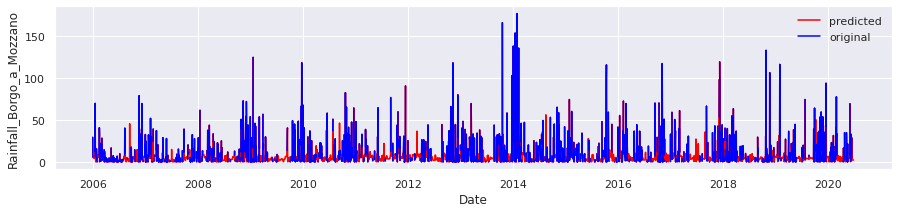

(1726, 8)
(1726,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


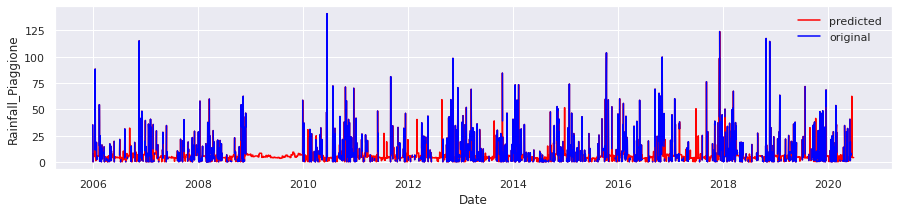

(2204, 8)
(2204,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


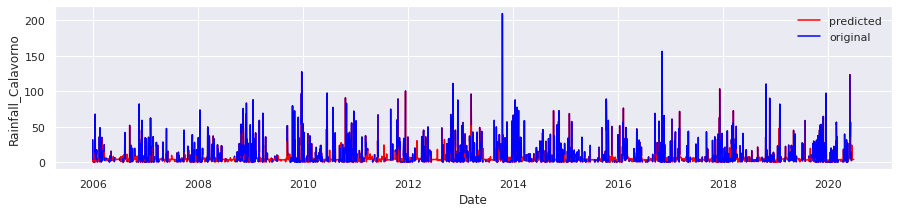

(2061, 8)
(2061,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


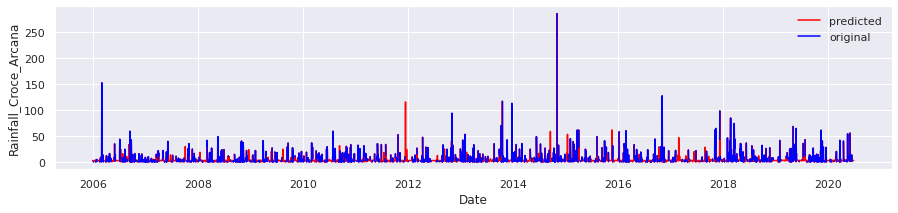

(2154, 8)
(2154,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


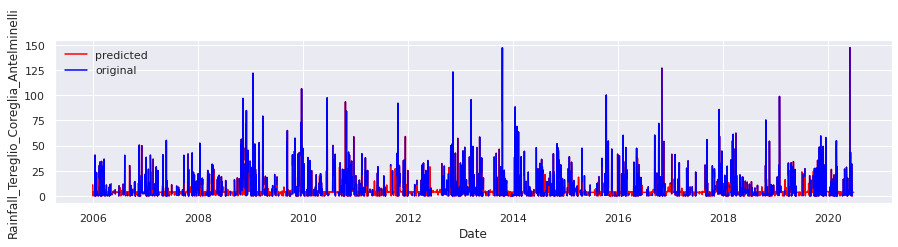

(2269, 8)
(2269,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


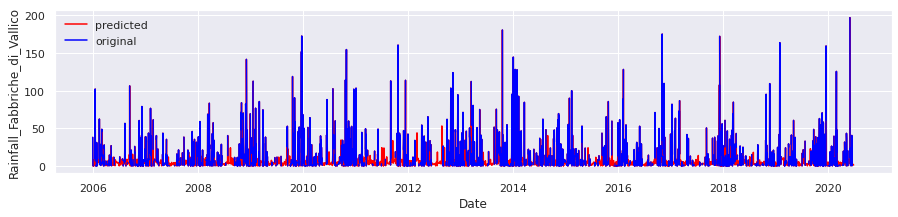

(4800, 8)
(4800,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


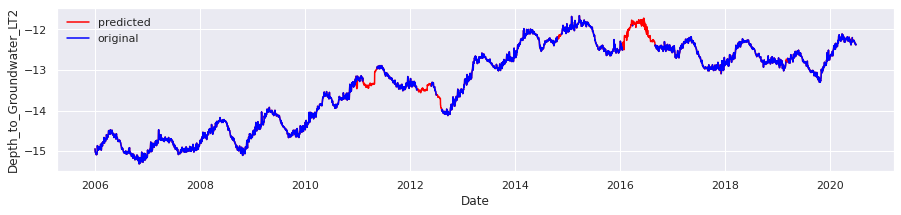

(4535, 8)
(4535,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


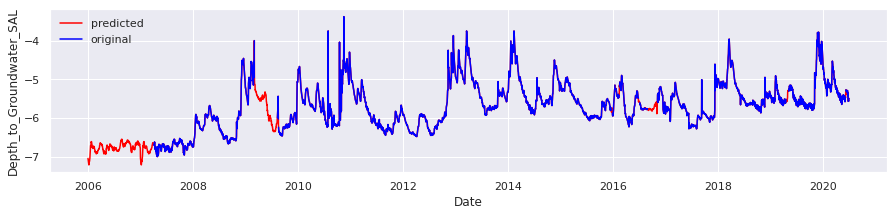

(3807, 8)
(3807,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


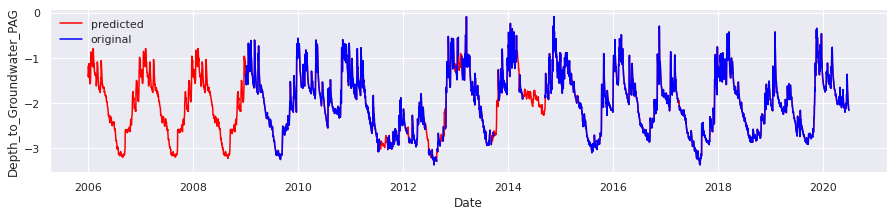

(4311, 8)
(4311,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


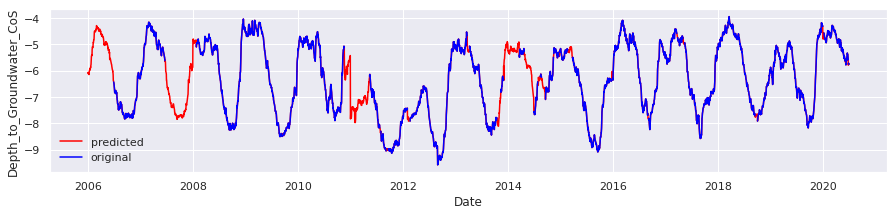

(3270, 8)
(3270,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


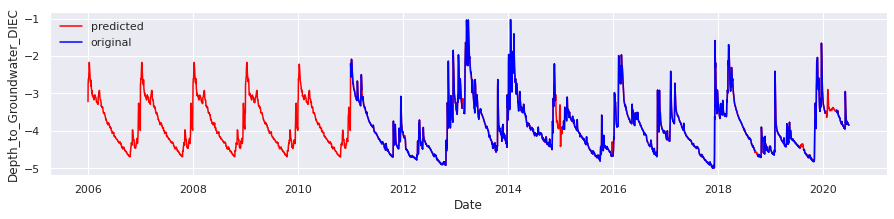

(5294, 8)
(5294,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


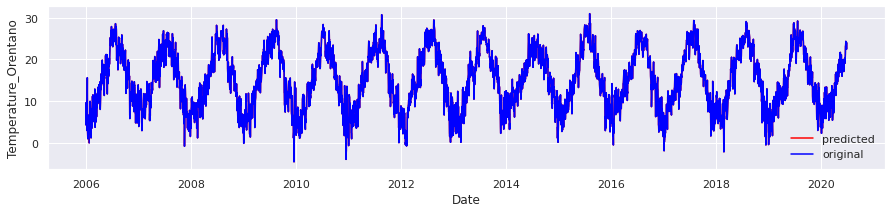

(5059, 8)
(5059,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


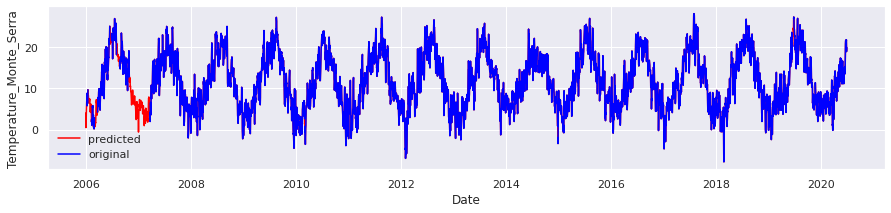

(3756, 8)
(3756,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


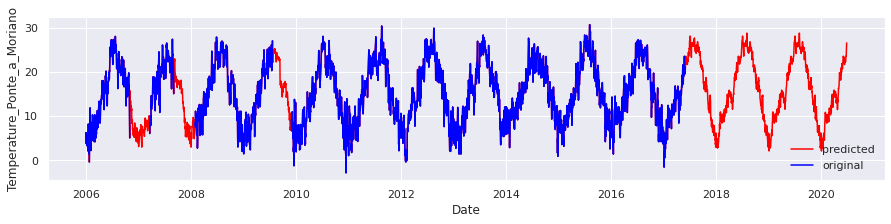

(5294, 8)
(5294,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


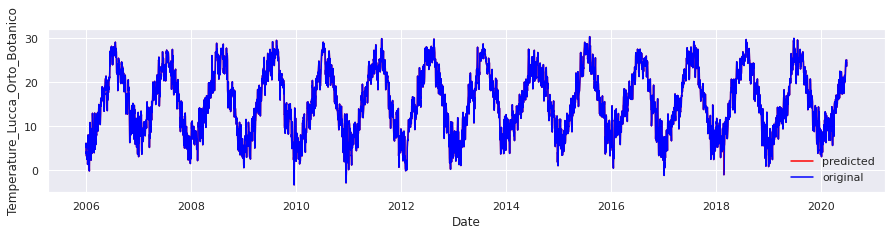

(5295, 8)
(5295,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


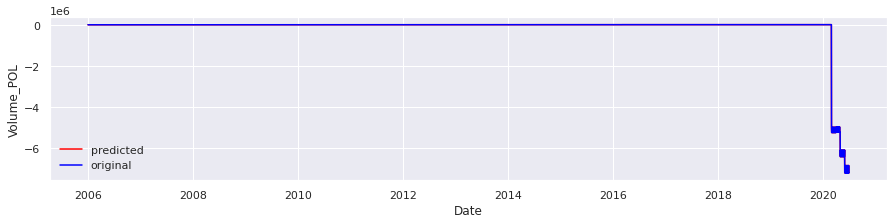

(5295, 8)
(5295,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


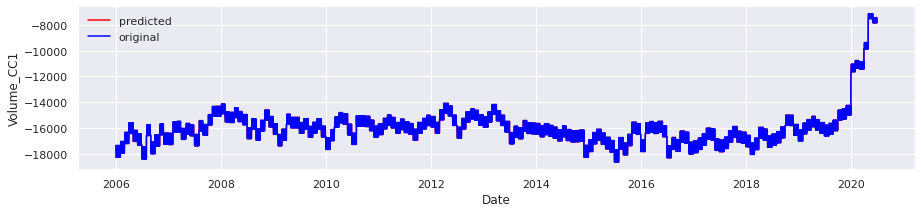

(5295, 8)
(5295,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


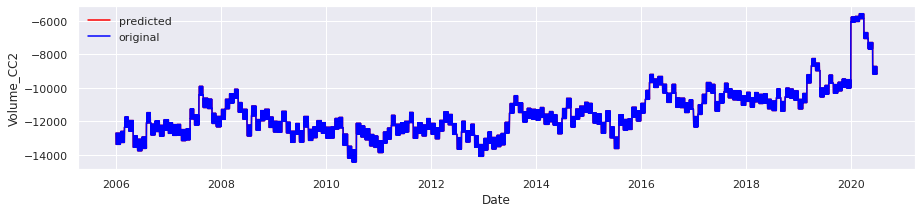

(2373, 8)
(2373,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


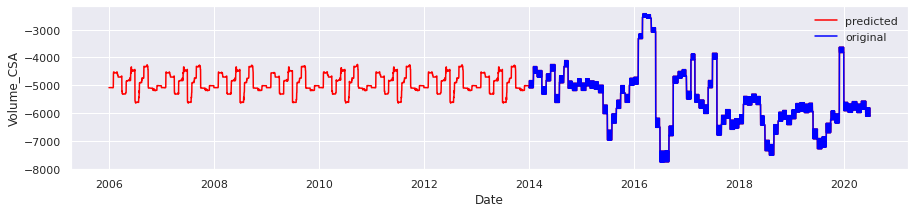

(2373, 8)
(2373,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


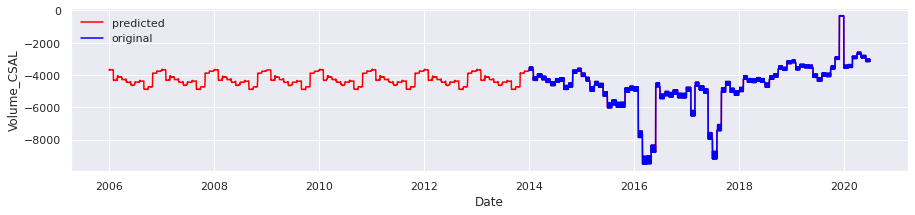

(5203, 8)
(5203,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


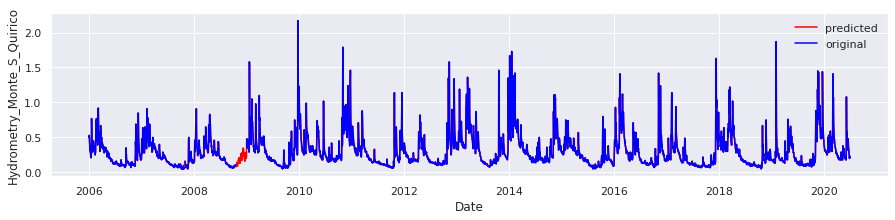

(4249, 8)
(4249,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


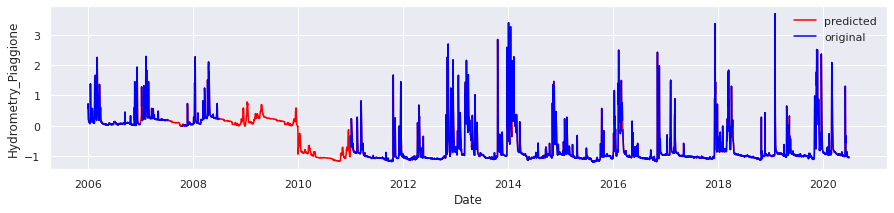


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_LT2']
Index(['Rainfall_Gallicano', 'Rainfall_Pontetetto', 'Rainfall_Monte_Serra',
       'Rainfall_Orentano', 'Rainfall_Borgo_a_Mozzano', 'Rainfall_Piaggione',
       'Rainfall_Calavorno', 'Rainfall_Croce_Arcana',
       'Rainfall_Tereglio_Coreglia_Antelminelli',
       'Rainfall_Fabbriche_di_Vallico', 'Depth_to_Groundwater_LT2',
       'Depth_to_Groundwater_SAL', 'Depth_to_Groundwater_PAG',
       'Depth_to_Groundwater_CoS', 'Depth_to_Groundwater_DIEC',
       'Temperature_Orentano', 'Temperature_Monte_Serra',
       'Temperature_Ponte_a_Moriano', 'Temperature_Lucca_Orto_Botanico',
       'Volume_POL', 'Volume_CC1', 'Volume_CC2', 'Volume_CSA', 'Volume_CSAL',
       'Hydrometry_Monte_S_Quirico', 'Hydrometry_Piaggione', 'year'],
      dtype='object')
-0.00062774646 0.0031387322
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-

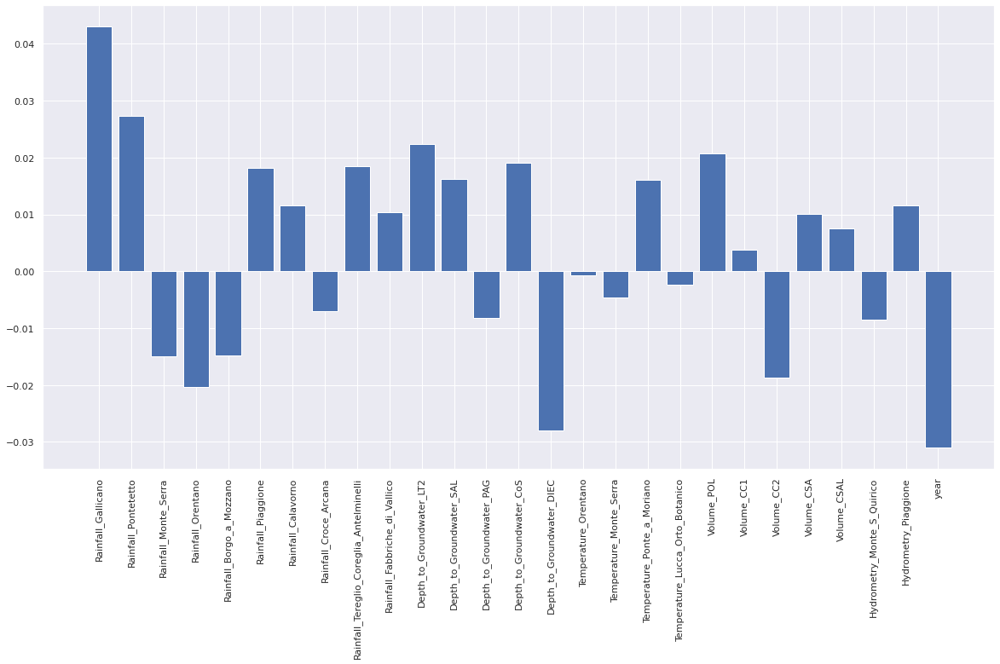

Selected Features - (array([ 0,  1,  3, 10, 14, 19, 26]),)
foo shape - (3705, 1, 1, 7)
Train reshape - (3705, 1, 7)
foo shape - (1589, 1, 1, 7)
Test reshape - (1589, 1, 7)
Epoch 1/100
116/116 - 2s - loss: 0.1570 - val_loss: 0.0393
Epoch 2/100
116/116 - 0s - loss: 0.0625 - val_loss: 0.0392
Epoch 3/100
116/116 - 0s - loss: 0.0548 - val_loss: 0.0365
Epoch 4/100
116/116 - 0s - loss: 0.0480 - val_loss: 0.0360
Epoch 5/100
116/116 - 0s - loss: 0.0438 - val_loss: 0.0347
Epoch 6/100
116/116 - 0s - loss: 0.0406 - val_loss: 0.0337
Epoch 7/100
116/116 - 0s - loss: 0.0383 - val_loss: 0.0328
Epoch 8/100
116/116 - 0s - loss: 0.0366 - val_loss: 0.0323
Epoch 9/100
116/116 - 0s - loss: 0.0354 - val_loss: 0.0321
Epoch 10/100
116/116 - 0s - loss: 0.0345 - val_loss: 0.0322
Epoch 11/100
116/116 - 1s - loss: 0.0339 - val_loss: 0.0324
Epoch 12/100
116/116 - 0s - loss: 0.0334 - val_loss: 0.0328
Epoch 13/100
116/116 - 0s - loss: 0.0330 - val_loss: 0.0332
Epoch 14/100
116/116 - 0s - loss: 0.0326 - val_loss: 0.03

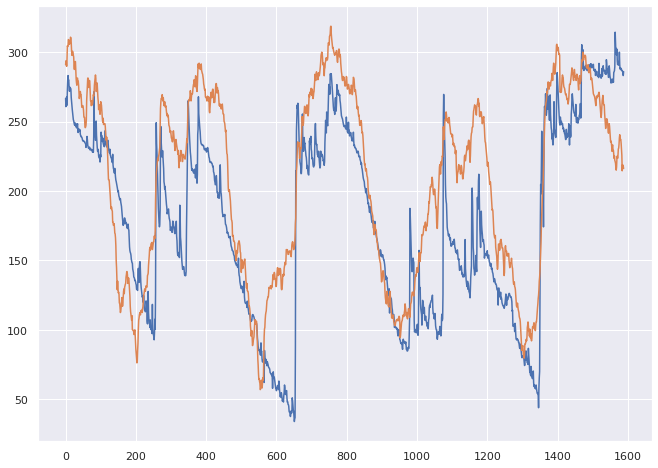

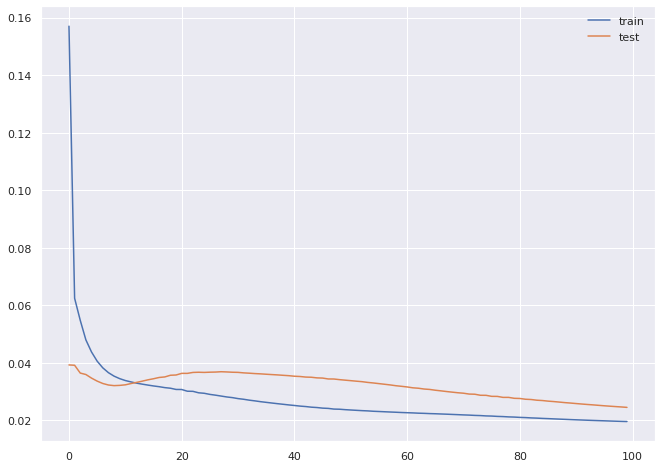

3705 1589
(3705, 1, 27) (3705,) (1589, 1, 27) (1589,)
[ 0.03947687 -0.01556369 -0.03882497 -0.02230539  0.00276157 -0.01419285
  0.00483202 -0.00780327 -0.04275426 -0.03120022 -0.02705953  0.01133919
  0.02592527  0.01235402  0.01899479 -0.03574247 -0.01630482  0.0226851
  0.01530664 -0.00117248 -0.00062882  0.01126127  0.00395099  0.01053292
 -0.04253168 -0.05067912 -0.01030273]
Mean: -0.0065794704
Standard Deviation: 0.023419404


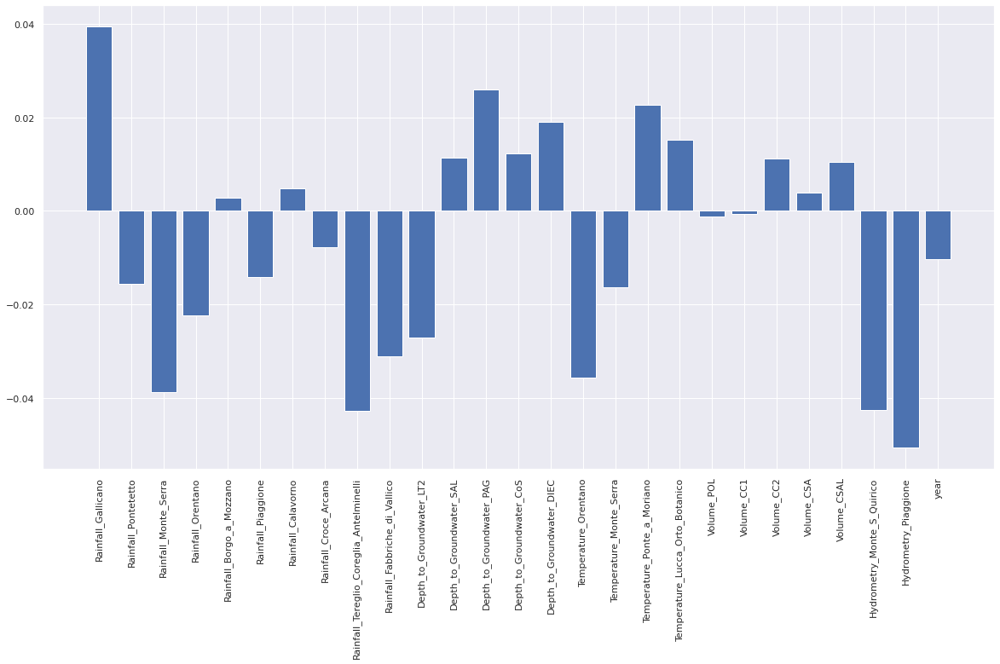

Selected Features - (array([ 0,  2,  3,  8,  9, 10, 12, 15, 17, 24, 25]),)
foo shape - (3705, 1, 1, 11)
Train reshape - (3705, 1, 11)
foo shape - (1589, 1, 1, 11)
Test reshape - (1589, 1, 11)
Epoch 1/100
116/116 - 2s - loss: 0.0162 - val_loss: 0.0087
Epoch 2/100
116/116 - 0s - loss: 0.0206 - val_loss: 0.0081
Epoch 3/100
116/116 - 0s - loss: 0.0189 - val_loss: 0.0077
Epoch 4/100
116/116 - 1s - loss: 0.0180 - val_loss: 0.0076
Epoch 5/100
116/116 - 0s - loss: 0.0175 - val_loss: 0.0074
Epoch 6/100
116/116 - 0s - loss: 0.0172 - val_loss: 0.0073
Epoch 7/100
116/116 - 0s - loss: 0.0169 - val_loss: 0.0071
Epoch 8/100
116/116 - 0s - loss: 0.0167 - val_loss: 0.0070
Epoch 9/100
116/116 - 0s - loss: 0.0165 - val_loss: 0.0069
Epoch 10/100
116/116 - 0s - loss: 0.0164 - val_loss: 0.0069
Epoch 11/100
116/116 - 0s - loss: 0.0163 - val_loss: 0.0068
Epoch 12/100
116/116 - 0s - loss: 0.0162 - val_loss: 0.0068
Epoch 13/100
116/116 - 0s - loss: 0.0161 - val_loss: 0.0067
Epoch 14/100
116/116 - 0s - loss: 0.0

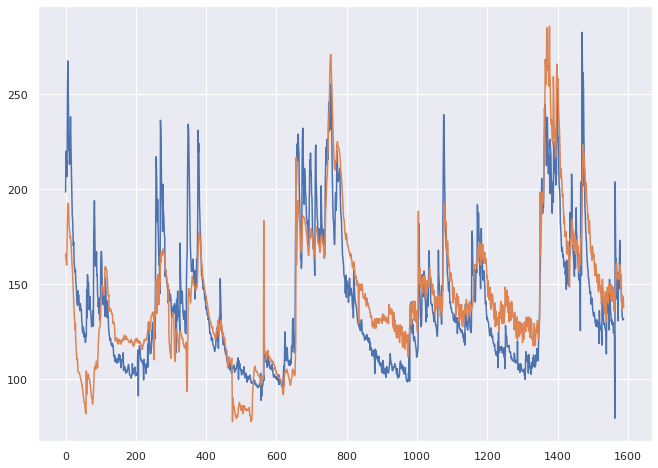

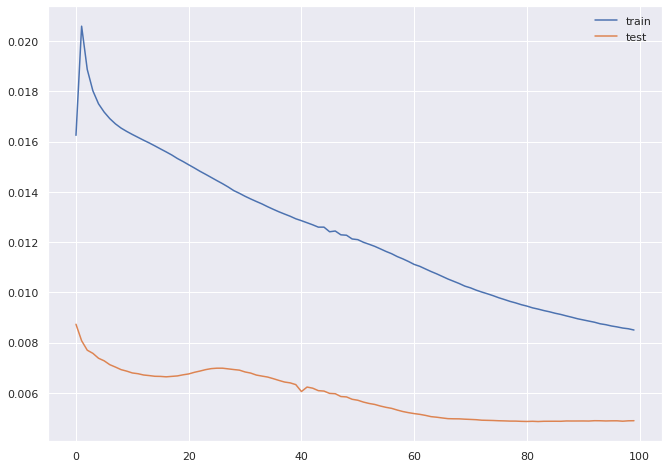

3705 1589
(3705, 1, 27) (3705,) (1589, 1, 27) (1589,)
[ 1.7923357e-02  1.6725967e-02  2.9748885e-02  1.3808615e-02
  2.6537223e-02 -3.4681633e-02 -1.2171163e-02  2.8626366e-02
 -9.4817756e-03 -1.0534510e-02  3.0033663e-02  2.5052816e-02
 -1.0350359e-02  9.4240112e-03  6.4798971e-03  1.1040003e-02
  6.1399806e-03  3.3159777e-05 -6.9681041e-02  1.4167433e-02
 -2.9738571e-02  2.1005485e-02 -2.3067566e-02 -4.7193640e-03
  1.7499877e-02  1.6871216e-02  2.0353206e-02]
Mean: 0.003964636
Standard Deviation: 0.022930074


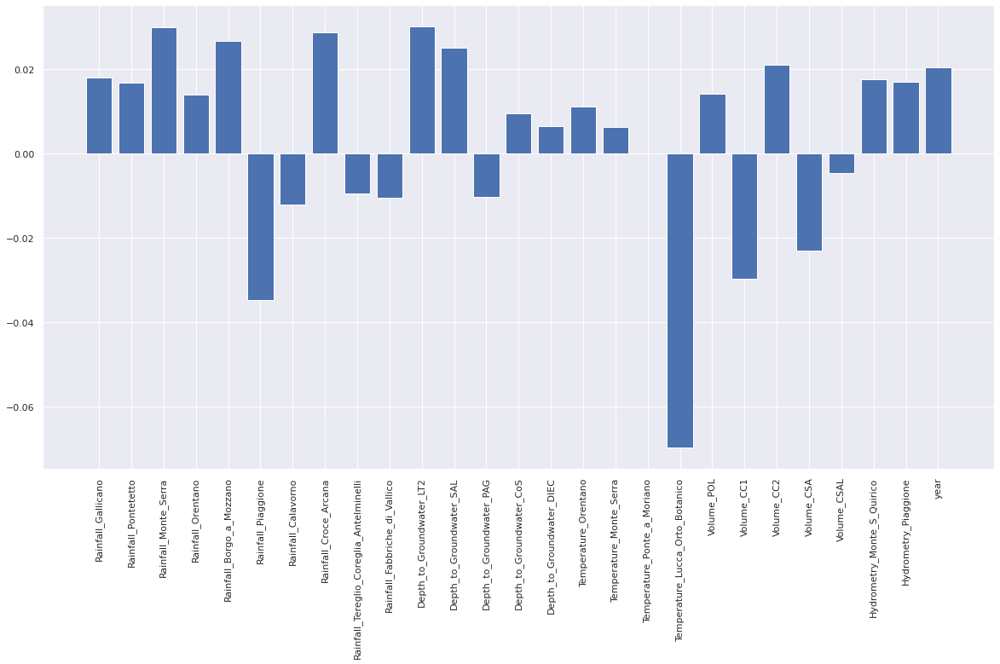

Selected Features - (array([ 2,  4,  5,  7, 10, 11, 18, 20, 21, 22, 26]),)
foo shape - (3705, 1, 1, 11)
Train reshape - (3705, 1, 11)
foo shape - (1589, 1, 1, 11)
Test reshape - (1589, 1, 11)
Epoch 1/100
116/116 - 2s - loss: 0.0174 - val_loss: 0.0674
Epoch 2/100
116/116 - 0s - loss: 0.0258 - val_loss: 0.0561
Epoch 3/100
116/116 - 0s - loss: 0.0150 - val_loss: 0.0495
Epoch 4/100
116/116 - 0s - loss: 0.0082 - val_loss: 0.0448
Epoch 5/100
116/116 - 0s - loss: 0.0050 - val_loss: 0.0402
Epoch 6/100
116/116 - 0s - loss: 0.0036 - val_loss: 0.0354
Epoch 7/100
116/116 - 0s - loss: 0.0030 - val_loss: 0.0308
Epoch 8/100
116/116 - 0s - loss: 0.0026 - val_loss: 0.0272
Epoch 9/100
116/116 - 0s - loss: 0.0024 - val_loss: 0.0239
Epoch 10/100
116/116 - 0s - loss: 0.0022 - val_loss: 0.0210
Epoch 11/100
116/116 - 0s - loss: 0.0020 - val_loss: 0.0185
Epoch 12/100
116/116 - 0s - loss: 0.0018 - val_loss: 0.0163
Epoch 13/100
116/116 - 1s - loss: 0.0017 - val_loss: 0.0144
Epoch 14/100
116/116 - 0s - loss: 0.0

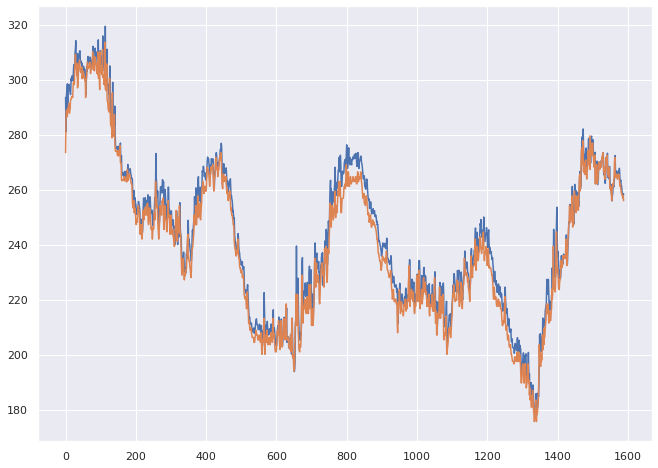

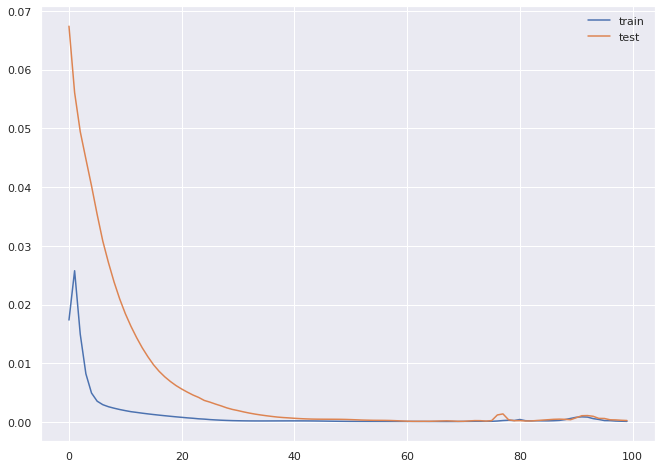

Dataset for imputation -            Date  Rainfall_Monteporzio  ...  year  month
2922 2012-01-01                   NaN  ...  2012    Jan
2923 2012-01-02                   1.8  ...  2012    Jan
2924 2012-01-03                  11.0  ...  2012    Jan
2925 2012-01-04                   1.0  ...  2012    Jan
2926 2012-01-05                   0.2  ...  2012    Jan
...         ...                   ...  ...   ...    ...
6021 2020-06-26                   NaN  ...  2020    Jun
6022 2020-06-27                   NaN  ...  2020    Jun
6023 2020-06-28                   NaN  ...  2020    Jun
6024 2020-06-29                   NaN  ...  2020    Jun
6025 2020-06-30                   NaN  ...  2020    Jun

[3104 rows x 24 columns]
(869, 8)
(869,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


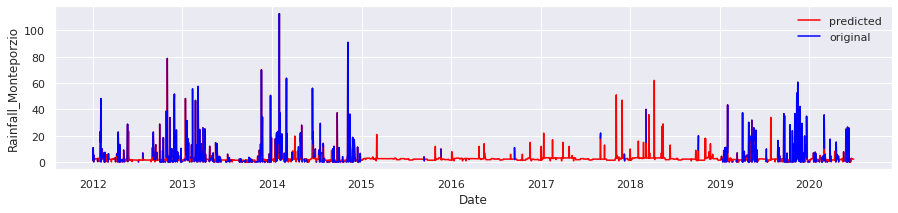

(707, 8)
(707,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


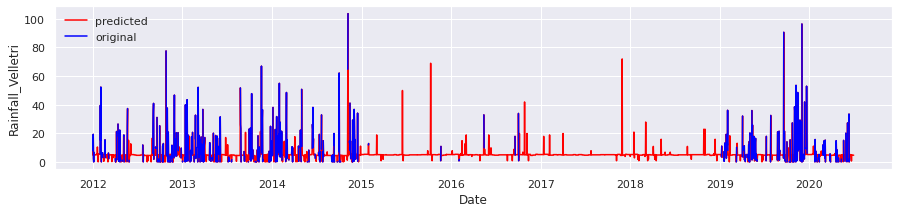

(2537, 8)
(2537,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


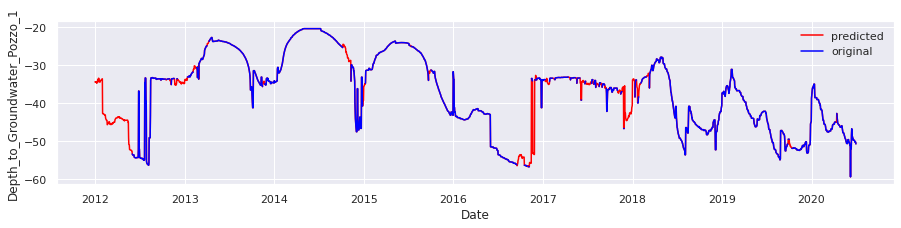

(2736, 8)
(2736,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


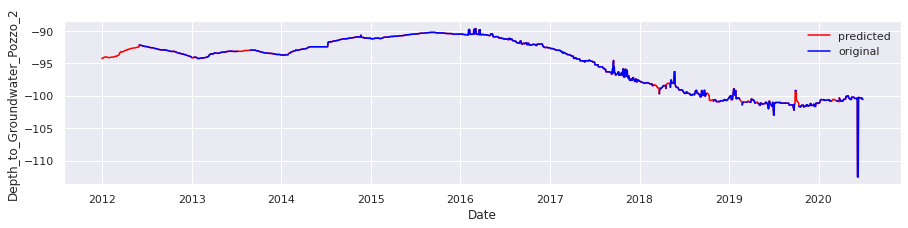

(2774, 8)
(2774,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


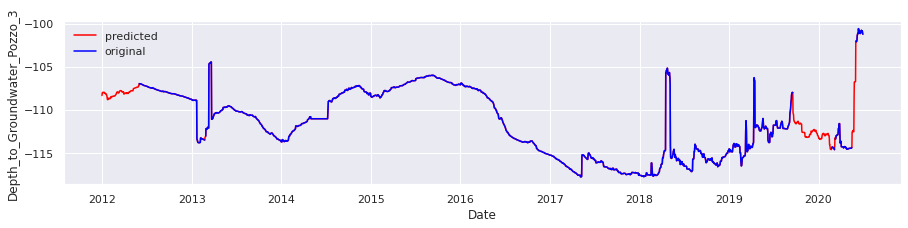

(2374, 8)
(2374,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


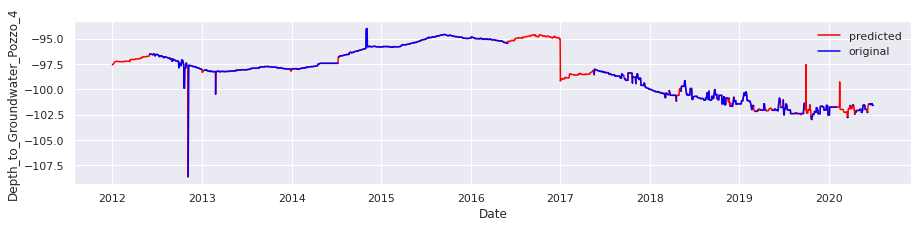

(2508, 8)
(2508,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


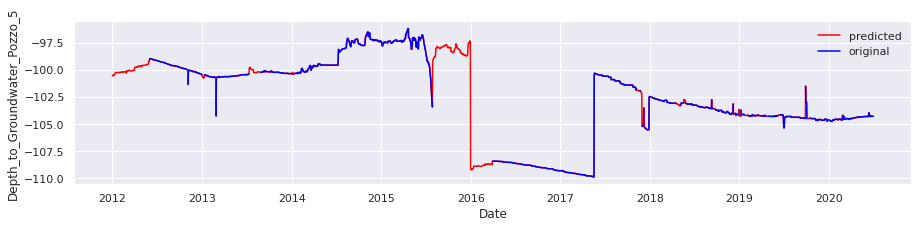

(2428, 8)
(2428,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


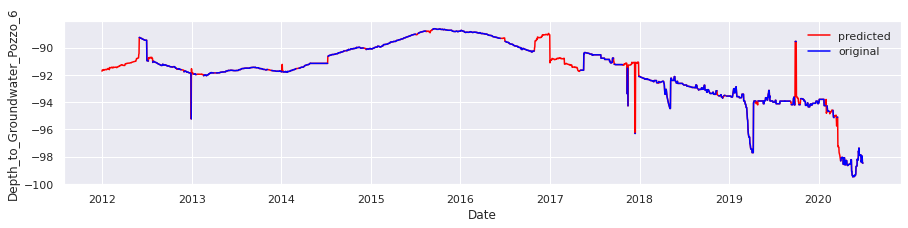

(2311, 8)
(2311,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


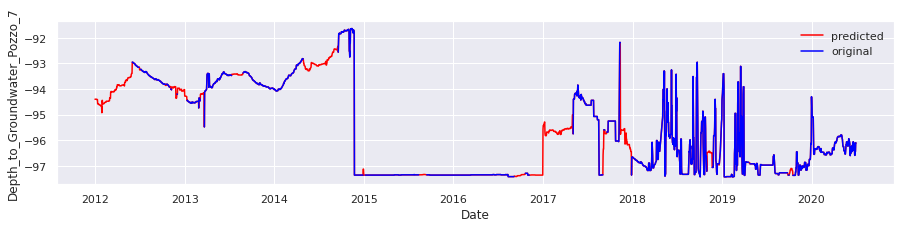

(2551, 8)
(2551,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


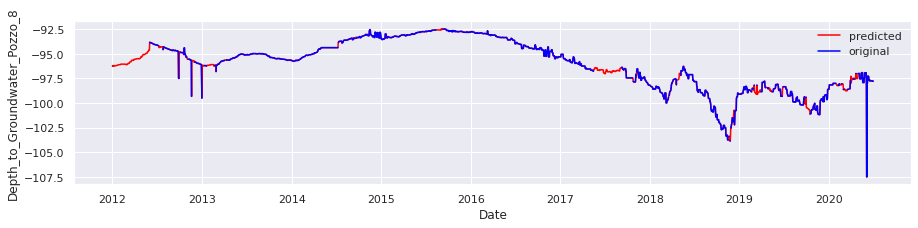

(2339, 8)
(2339,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


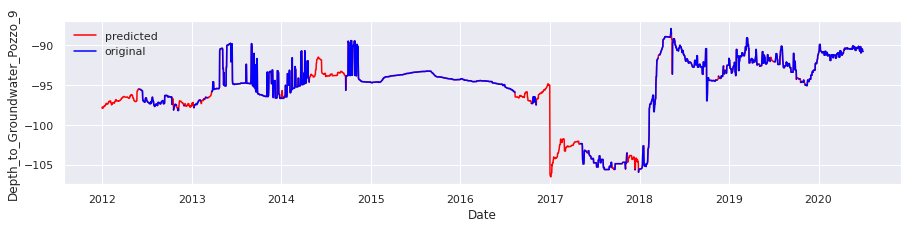

(1260, 8)
(1260,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


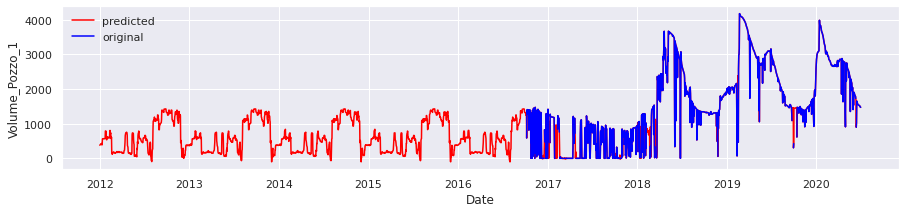

(1328, 8)
(1328,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


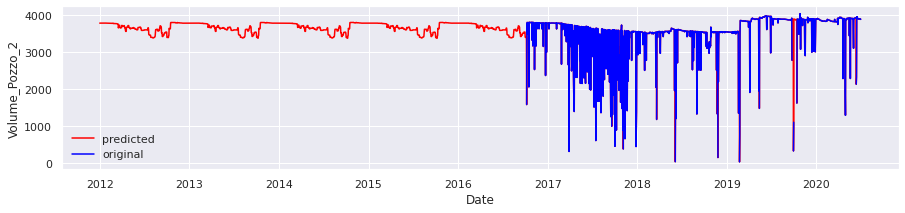

(1331, 8)
(1331,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


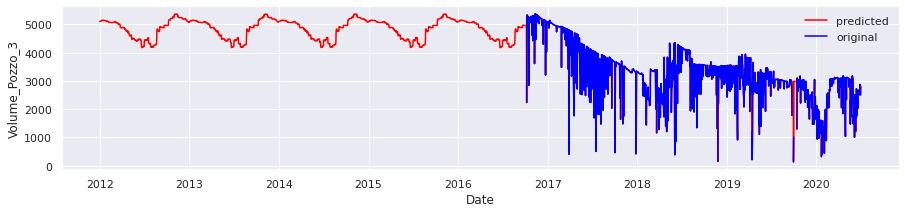

(1332, 8)
(1332,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


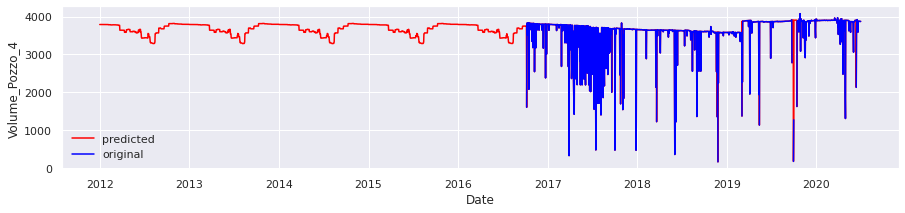

(1331, 8)
(1331,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


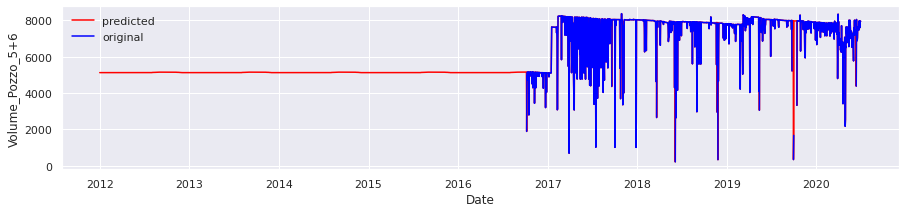

(1330, 8)
(1330,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


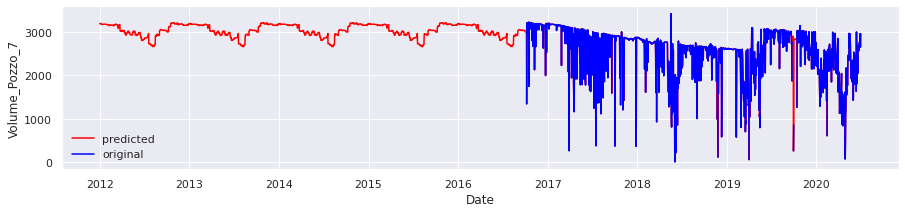

(1331, 8)
(1331,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


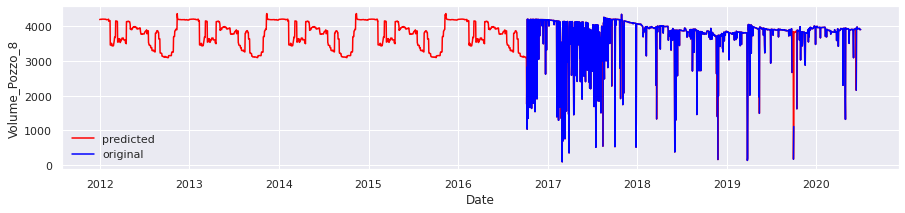

(1333, 8)
(1333,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


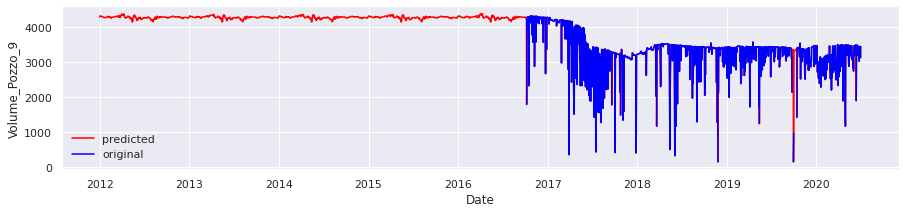

(1647, 8)
(1647,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


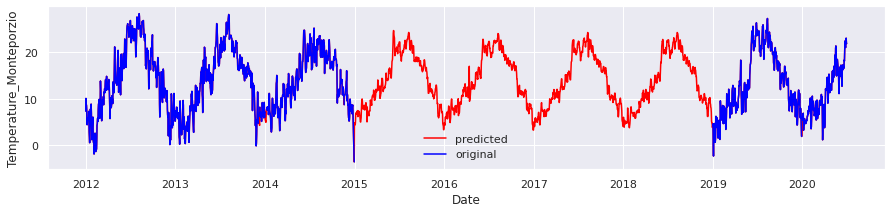

(1642, 8)
(1642,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


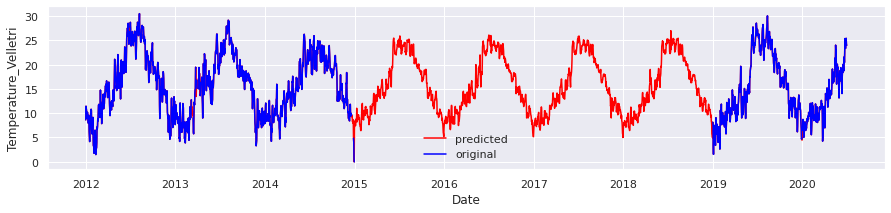


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2', 'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4', 'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6', 'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8', 'Depth_to_Groundwater_Pozzo_9']
Index(['Rainfall_Monteporzio', 'Rainfall_Velletri',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_2',
       'Depth_to_Groundwater_Pozzo_3', 'Depth_to_Groundwater_Pozzo_4',
       'Depth_to_Groundwater_Pozzo_5', 'Depth_to_Groundwater_Pozzo_6',
       'Depth_to_Groundwater_Pozzo_7', 'Depth_to_Groundwater_Pozzo_8',
       'Depth_to_Groundwater_Pozzo_9', 'Volume_Pozzo_1', 'Volume_Pozzo_2',
       'Volume_Pozzo_3', 'Volume_Pozzo_4', 'Volume_Pozzo_5+6',
       'Volume_Pozzo_7', 'Volume_Pozzo_8', 'Volume_Pozzo_9',
       'Temperature_Monteporzio', 'Temperature_Velletri', 'year'],
      dtype='object')
-0.0017793594 0.008896797
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-

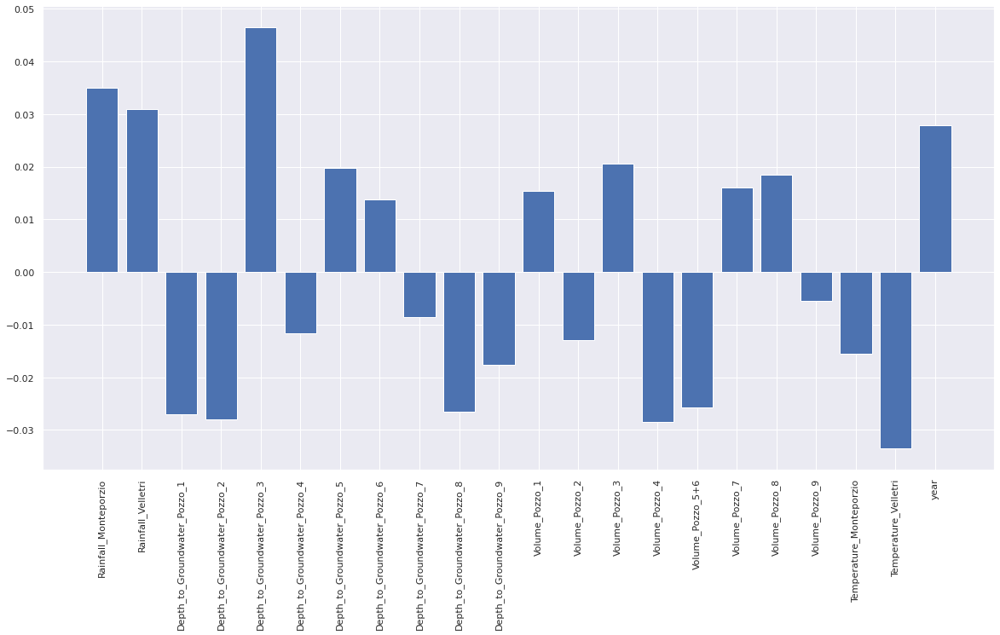

Selected Features - (array([ 0,  1,  2,  3,  4,  9, 13, 14, 15, 20, 21]),)
foo shape - (2172, 1, 1, 11)
Train reshape - (2172, 1, 11)
foo shape - (931, 1, 1, 11)
Test reshape - (931, 1, 11)
Epoch 1/100
68/68 - 2s - loss: 0.1368 - val_loss: 0.1200
Epoch 2/100
68/68 - 0s - loss: 0.0359 - val_loss: 0.1449
Epoch 3/100
68/68 - 0s - loss: 0.0332 - val_loss: 0.1775
Epoch 4/100
68/68 - 0s - loss: 0.0299 - val_loss: 0.1892
Epoch 5/100
68/68 - 0s - loss: 0.0263 - val_loss: 0.2125
Epoch 6/100
68/68 - 0s - loss: 0.0234 - val_loss: 0.2406
Epoch 7/100
68/68 - 0s - loss: 0.0215 - val_loss: 0.2656
Epoch 8/100
68/68 - 0s - loss: 0.0199 - val_loss: 0.2980
Epoch 9/100
68/68 - 0s - loss: 0.0191 - val_loss: 0.3273
Epoch 10/100
68/68 - 0s - loss: 0.0181 - val_loss: 0.3646
Epoch 11/100
68/68 - 0s - loss: 0.0175 - val_loss: 0.4060
Epoch 12/100
68/68 - 0s - loss: 0.0173 - val_loss: 0.4298
Epoch 13/100
68/68 - 0s - loss: 0.0168 - val_loss: 0.4577
Epoch 14/100
68/68 - 0s - loss: 0.0163 - val_loss: 0.4849
Epoch 1

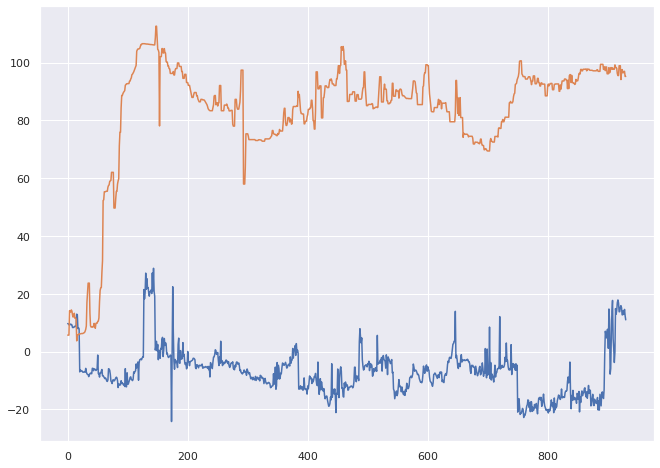

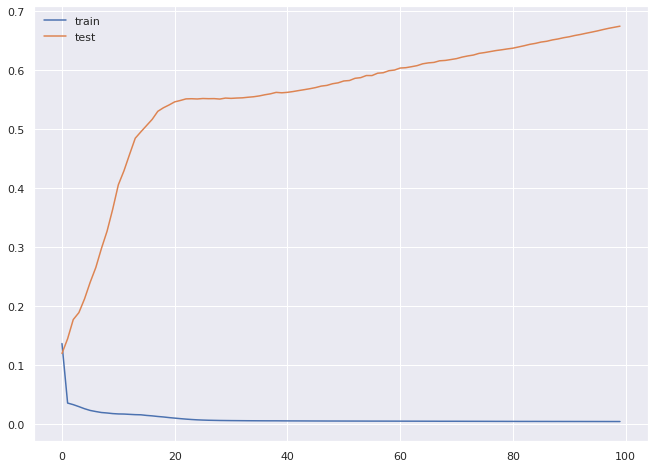

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.01353107 -0.02046334  0.00111083 -0.0056431  -0.02047639 -0.00093203
 -0.01147057 -0.04024947 -0.01996956  0.00316457  0.00592254  0.00403483
  0.00737196 -0.00454694  0.00571357  0.02968991 -0.01393048 -0.05241447
 -0.01636004 -0.02287543  0.036443    0.00611574]
Mean: -0.006513452
Standard Deviation: 0.019563865


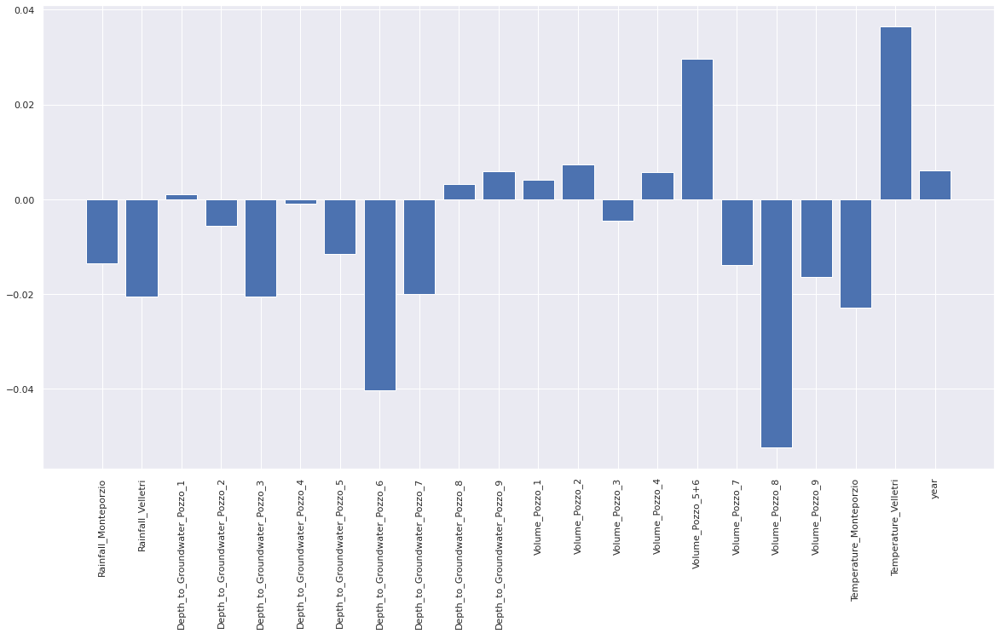

Selected Features - (array([ 1,  4,  7, 15, 17, 19, 20]),)
foo shape - (2172, 1, 1, 7)
Train reshape - (2172, 1, 7)
foo shape - (931, 1, 1, 7)
Test reshape - (931, 1, 7)
Epoch 1/100
68/68 - 2s - loss: 0.4799 - val_loss: 0.0286
Epoch 2/100
68/68 - 0s - loss: 0.0440 - val_loss: 0.1016
Epoch 3/100
68/68 - 0s - loss: 0.0119 - val_loss: 0.0930
Epoch 4/100
68/68 - 0s - loss: 0.0099 - val_loss: 0.0823
Epoch 5/100
68/68 - 0s - loss: 0.0089 - val_loss: 0.0799
Epoch 6/100
68/68 - 0s - loss: 0.0082 - val_loss: 0.0781
Epoch 7/100
68/68 - 0s - loss: 0.0074 - val_loss: 0.0731
Epoch 8/100
68/68 - 0s - loss: 0.0069 - val_loss: 0.0709
Epoch 9/100
68/68 - 0s - loss: 0.0065 - val_loss: 0.0692
Epoch 10/100
68/68 - 0s - loss: 0.0063 - val_loss: 0.0671
Epoch 11/100
68/68 - 0s - loss: 0.0061 - val_loss: 0.0657
Epoch 12/100
68/68 - 0s - loss: 0.0059 - val_loss: 0.0580
Epoch 13/100
68/68 - 0s - loss: 0.0053 - val_loss: 0.0587
Epoch 14/100
68/68 - 0s - loss: 0.0053 - val_loss: 0.0583
Epoch 15/100
68/68 - 0s - l

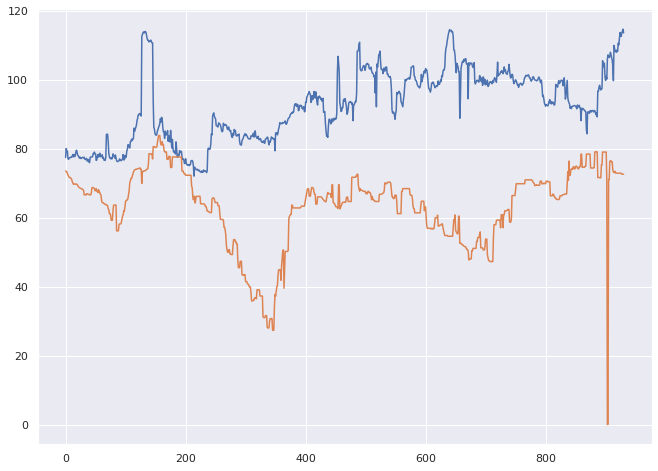

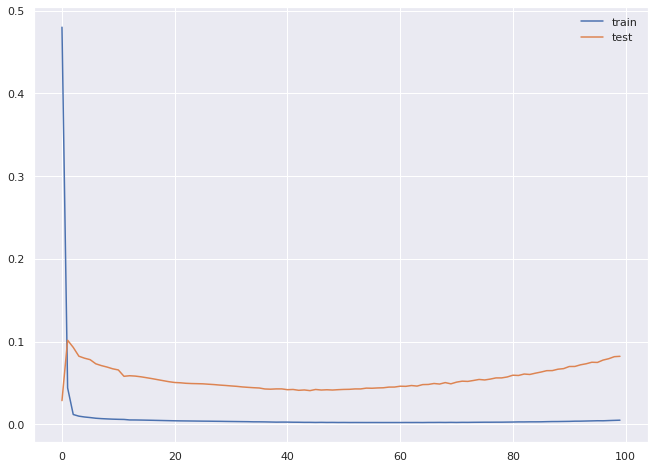

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[ 0.01334543 -0.00433218  0.06280977  0.01445714 -0.01141872  0.01209107
 -0.02659603 -0.01744302 -0.03218658  0.04960629  0.03230371  0.00011471
 -0.02161021  0.00119204 -0.00177429  0.00328961  0.00422645  0.04090589
  0.04877646 -0.0024825  -0.01443004 -0.03158404]
Mean: 0.0054209516
Standard Deviation: 0.026369367


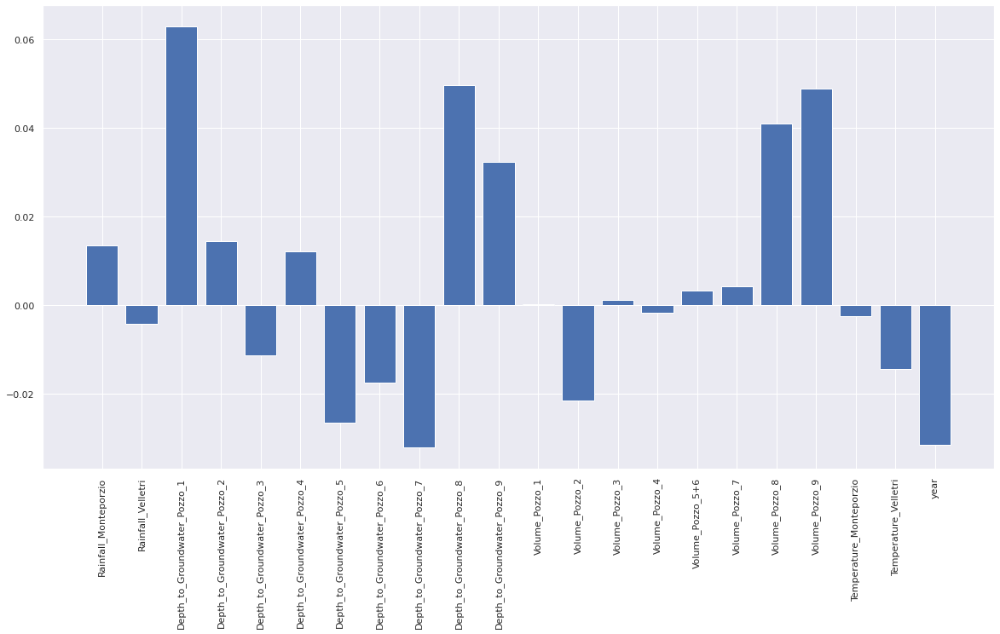

Selected Features - (array([ 2,  6,  8,  9, 10, 12, 17, 18, 21]),)
foo shape - (2172, 1, 1, 9)
Train reshape - (2172, 1, 9)
foo shape - (931, 1, 1, 9)
Test reshape - (931, 1, 9)
Epoch 1/100
68/68 - 2s - loss: 0.1687 - val_loss: 0.0216
Epoch 2/100
68/68 - 0s - loss: 0.0933 - val_loss: 0.0164
Epoch 3/100
68/68 - 0s - loss: 0.0724 - val_loss: 0.0135
Epoch 4/100
68/68 - 0s - loss: 0.0545 - val_loss: 0.0131
Epoch 5/100
68/68 - 0s - loss: 0.0341 - val_loss: 0.0140
Epoch 6/100
68/68 - 0s - loss: 0.0195 - val_loss: 0.0180
Epoch 7/100
68/68 - 0s - loss: 0.0113 - val_loss: 0.0169
Epoch 8/100
68/68 - 0s - loss: 0.0056 - val_loss: 0.0161
Epoch 9/100
68/68 - 0s - loss: 0.0029 - val_loss: 0.0160
Epoch 10/100
68/68 - 0s - loss: 0.0020 - val_loss: 0.0176
Epoch 11/100
68/68 - 0s - loss: 0.0016 - val_loss: 0.0185
Epoch 12/100
68/68 - 0s - loss: 0.0016 - val_loss: 0.0181
Epoch 13/100
68/68 - 0s - loss: 0.0017 - val_loss: 0.0166
Epoch 14/100
68/68 - 0s - loss: 0.0017 - val_loss: 0.0145
Epoch 15/100
68/68 

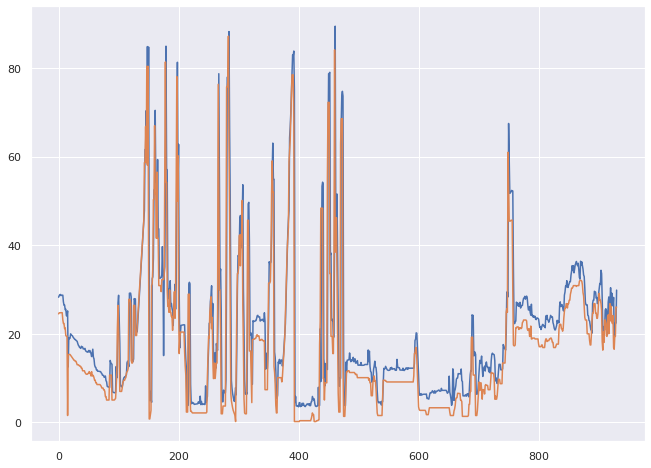

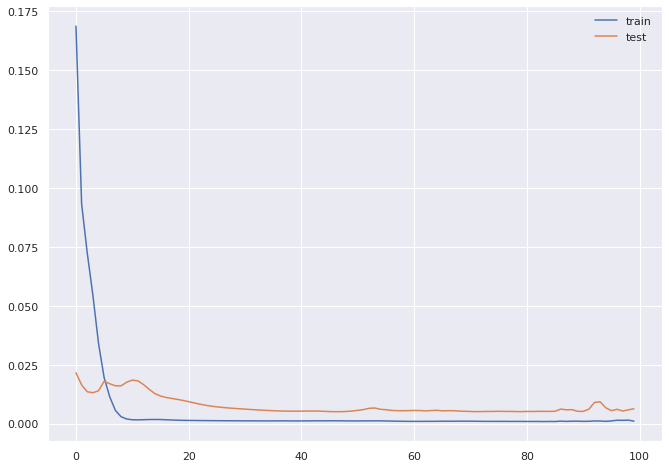

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.00689926  0.03384979  0.00477243  0.0090311  -0.01817198  0.00804869
 -0.04916606  0.00125032  0.01899609 -0.01636706 -0.04005085  0.02702448
 -0.03039622 -0.01271889 -0.03460534 -0.04359355  0.00139937  0.01359439
  0.03722121 -0.03379926 -0.00837266  0.00873105]
Mean: -0.0059191915
Standard Deviation: 0.024632256


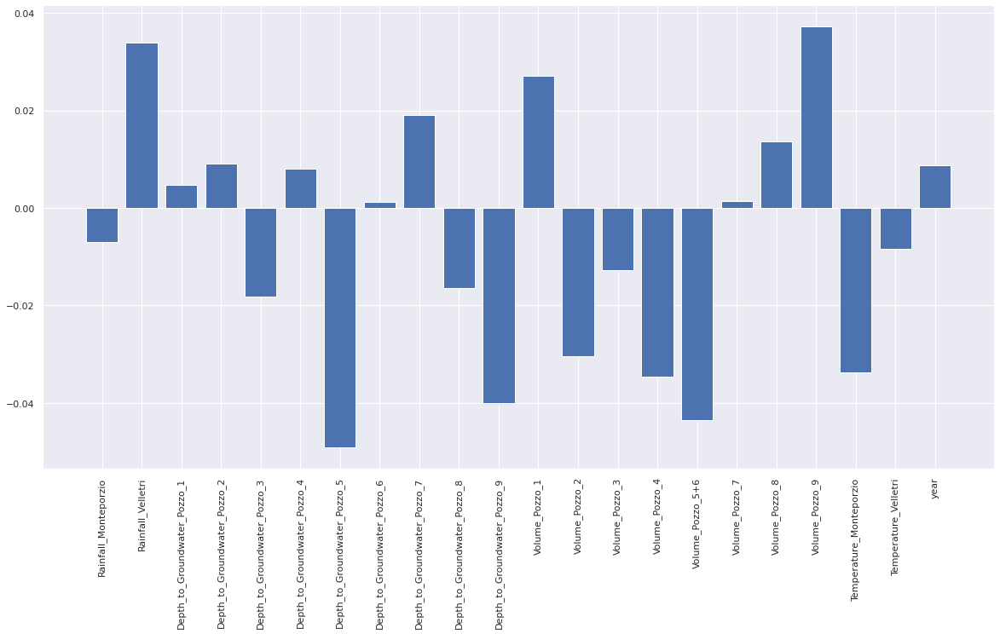

Selected Features - (array([ 1,  6, 10, 11, 12, 14, 15, 18, 19]),)
foo shape - (2172, 1, 1, 9)
Train reshape - (2172, 1, 9)
foo shape - (931, 1, 1, 9)
Test reshape - (931, 1, 9)
Epoch 1/100
68/68 - 2s - loss: 0.1718 - val_loss: 0.2748
Epoch 2/100
68/68 - 0s - loss: 0.0260 - val_loss: 0.3168
Epoch 3/100
68/68 - 0s - loss: 0.0254 - val_loss: 0.3258
Epoch 4/100
68/68 - 0s - loss: 0.0245 - val_loss: 0.3364
Epoch 5/100
68/68 - 0s - loss: 0.0236 - val_loss: 0.3397
Epoch 6/100
68/68 - 0s - loss: 0.0228 - val_loss: 0.3469
Epoch 7/100
68/68 - 0s - loss: 0.0218 - val_loss: 0.3680
Epoch 8/100
68/68 - 0s - loss: 0.0212 - val_loss: 0.3543
Epoch 9/100
68/68 - 1s - loss: 0.0204 - val_loss: 0.3569
Epoch 10/100
68/68 - 0s - loss: 0.0196 - val_loss: 0.3550
Epoch 11/100
68/68 - 0s - loss: 0.0189 - val_loss: 0.3587
Epoch 12/100
68/68 - 0s - loss: 0.0181 - val_loss: 0.3457
Epoch 13/100
68/68 - 0s - loss: 0.0178 - val_loss: 0.3418
Epoch 14/100
68/68 - 0s - loss: 0.0172 - val_loss: 0.3353
Epoch 15/100
68/68 

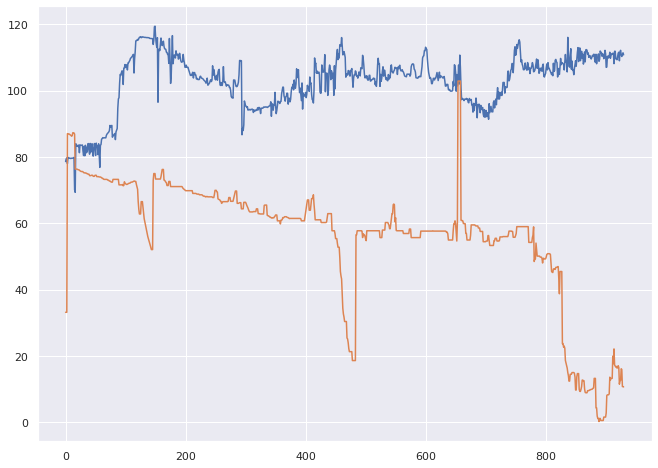

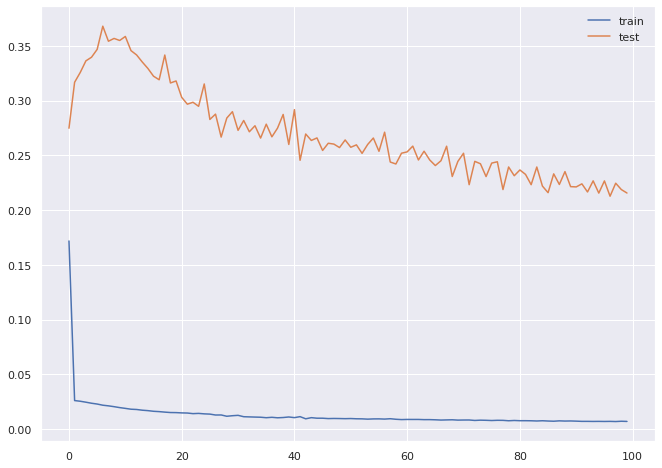

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.00046054 -0.00184412  0.00563473 -0.00749298 -0.04344707 -0.00678631
 -0.03263231  0.00154194 -0.02654628  0.02584844  0.00368504  0.03779627
  0.03510712  0.01382817  0.03757667  0.01608383 -0.00597396 -0.00100125
 -0.00331455 -0.00320211 -0.00383227 -0.03736809]
Mean: 0.00014547055
Standard Deviation: 0.021815747


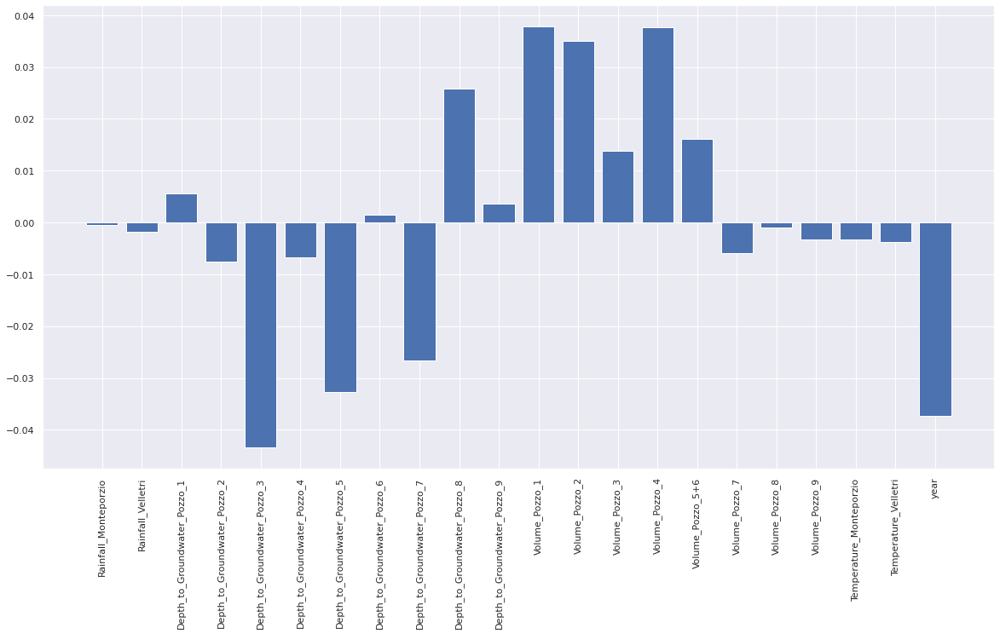

Selected Features - (array([ 4,  6,  8,  9, 11, 12, 14, 21]),)
foo shape - (2172, 1, 1, 8)
Train reshape - (2172, 1, 8)
foo shape - (931, 1, 1, 8)
Test reshape - (931, 1, 8)
Epoch 1/100
68/68 - 2s - loss: 0.2891 - val_loss: 0.0095
Epoch 2/100
68/68 - 0s - loss: 0.0782 - val_loss: 0.0053
Epoch 3/100
68/68 - 0s - loss: 0.0435 - val_loss: 0.0069
Epoch 4/100
68/68 - 0s - loss: 0.0295 - val_loss: 0.0113
Epoch 5/100
68/68 - 1s - loss: 0.0207 - val_loss: 0.0141
Epoch 6/100
68/68 - 0s - loss: 0.0149 - val_loss: 0.0144
Epoch 7/100
68/68 - 0s - loss: 0.0111 - val_loss: 0.0122
Epoch 8/100
68/68 - 0s - loss: 0.0090 - val_loss: 0.0090
Epoch 9/100
68/68 - 0s - loss: 0.0073 - val_loss: 0.0068
Epoch 10/100
68/68 - 0s - loss: 0.0057 - val_loss: 0.0054
Epoch 11/100
68/68 - 0s - loss: 0.0043 - val_loss: 0.0045
Epoch 12/100
68/68 - 0s - loss: 0.0033 - val_loss: 0.0039
Epoch 13/100
68/68 - 0s - loss: 0.0025 - val_loss: 0.0033
Epoch 14/100
68/68 - 0s - loss: 0.0020 - val_loss: 0.0029
Epoch 15/100
68/68 - 0s

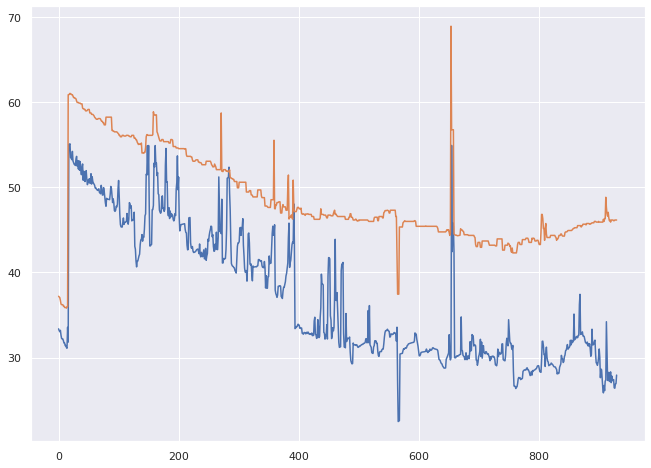

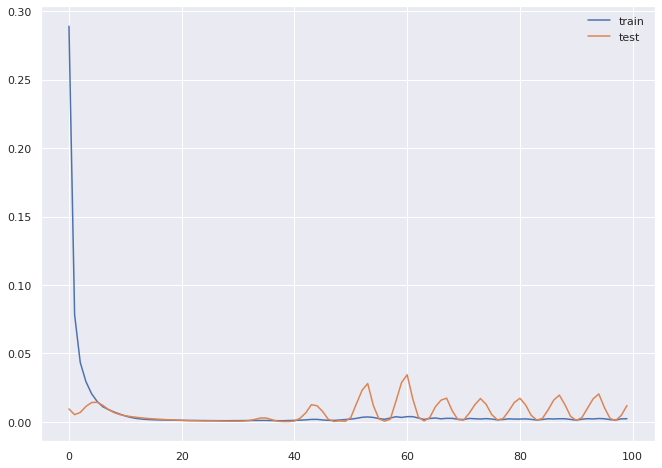

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.00509342  0.03888089 -0.002862    0.04605036  0.01451947 -0.01457762
  0.00188055 -0.00761785  0.06445008 -0.02578476  0.06459352  0.03035184
  0.05008512  0.02440933  0.02508239  0.00493348  0.05459792  0.01065888
  0.0494106   0.04004693 -0.00901376 -0.00017473]
Mean: 0.020673962
Standard Deviation: 0.026662292


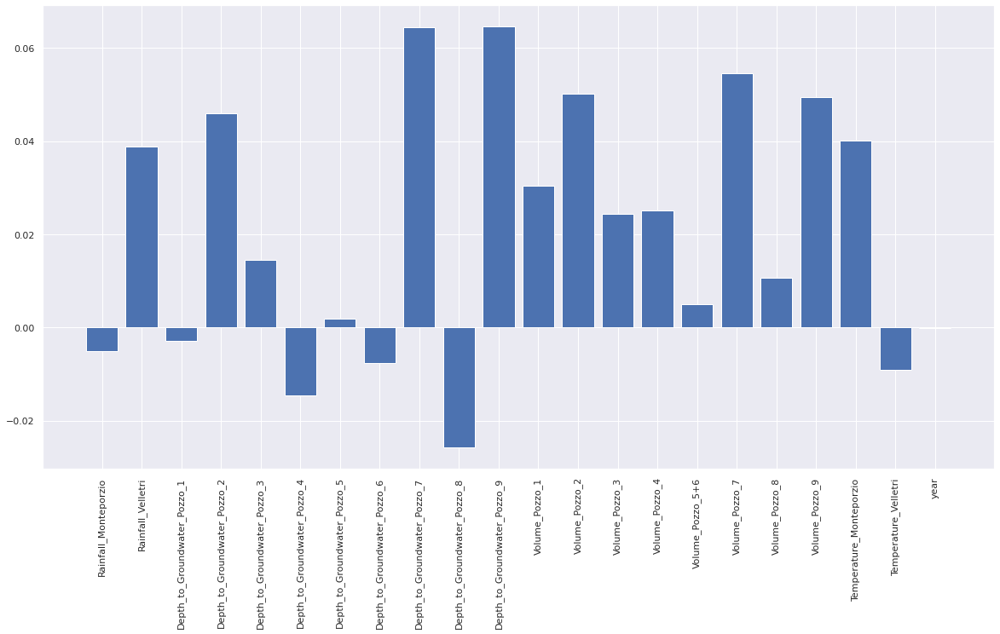

Selected Features - (array([ 1,  3,  8,  9, 10, 11, 12, 13, 14, 16, 18, 19]),)
foo shape - (2172, 1, 1, 12)
Train reshape - (2172, 1, 12)
foo shape - (931, 1, 1, 12)
Test reshape - (931, 1, 12)
Epoch 1/100
68/68 - 2s - loss: 0.1246 - val_loss: 0.1071
Epoch 2/100
68/68 - 1s - loss: 0.0102 - val_loss: 0.0933
Epoch 3/100
68/68 - 0s - loss: 0.0057 - val_loss: 0.0767
Epoch 4/100
68/68 - 0s - loss: 0.0054 - val_loss: 0.0809
Epoch 5/100
68/68 - 0s - loss: 0.0055 - val_loss: 0.0806
Epoch 6/100
68/68 - 0s - loss: 0.0050 - val_loss: 0.0808
Epoch 7/100
68/68 - 0s - loss: 0.0048 - val_loss: 0.0807
Epoch 8/100
68/68 - 0s - loss: 0.0047 - val_loss: 0.0813
Epoch 9/100
68/68 - 0s - loss: 0.0045 - val_loss: 0.0821
Epoch 10/100
68/68 - 0s - loss: 0.0044 - val_loss: 0.0830
Epoch 11/100
68/68 - 0s - loss: 0.0042 - val_loss: 0.0846
Epoch 12/100
68/68 - 0s - loss: 0.0041 - val_loss: 0.0863
Epoch 13/100
68/68 - 0s - loss: 0.0040 - val_loss: 0.0885
Epoch 14/100
68/68 - 0s - loss: 0.0039 - val_loss: 0.0907
Epo

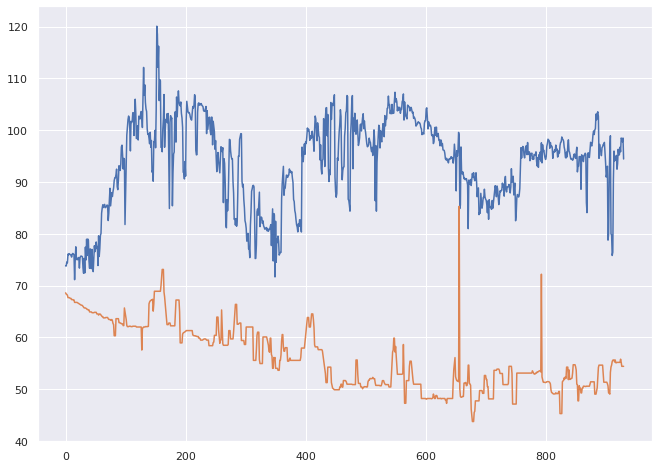

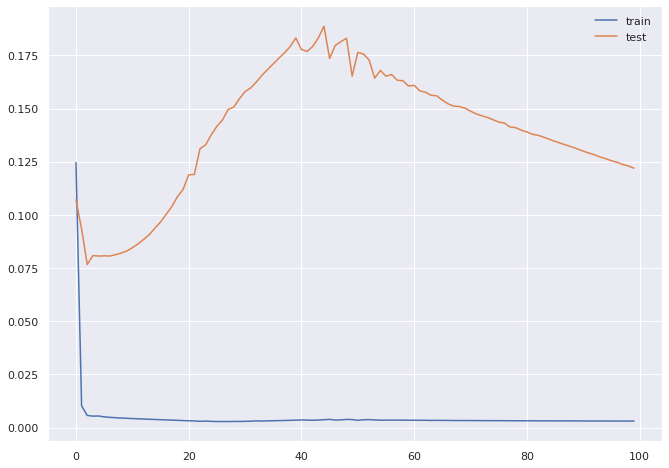

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[-0.02492924  0.04425234 -0.00841813 -0.01463683 -0.02052642 -0.01783538
 -0.03147313 -0.03163311 -0.02101922  0.02278119 -0.03251634 -0.03571657
 -0.02060924  0.01755966 -0.00229984  0.00924826 -0.00741538  0.01719788
  0.00323992  0.03326837  0.00436786  0.02066668]
Mean: -0.0043839393
Standard Deviation: 0.022567647


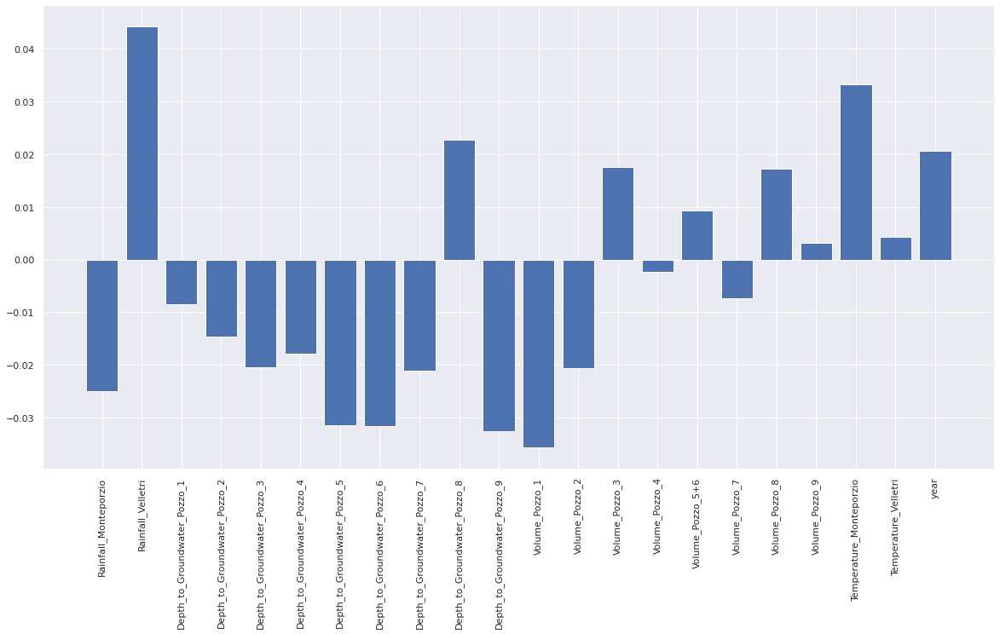

Selected Features - (array([ 0,  1,  4,  6,  7,  8,  9, 10, 11, 12, 19, 21]),)
foo shape - (2172, 1, 1, 12)
Train reshape - (2172, 1, 12)
foo shape - (931, 1, 1, 12)
Test reshape - (931, 1, 12)
Epoch 1/100
68/68 - 2s - loss: 0.0901 - val_loss: 0.0541
Epoch 2/100
68/68 - 0s - loss: 0.0274 - val_loss: 0.0396
Epoch 3/100
68/68 - 0s - loss: 0.0222 - val_loss: 0.0324
Epoch 4/100
68/68 - 0s - loss: 0.0161 - val_loss: 0.0256
Epoch 5/100
68/68 - 0s - loss: 0.0109 - val_loss: 0.0203
Epoch 6/100
68/68 - 0s - loss: 0.0070 - val_loss: 0.0164
Epoch 7/100
68/68 - 0s - loss: 0.0049 - val_loss: 0.0145
Epoch 8/100
68/68 - 0s - loss: 0.0042 - val_loss: 0.0138
Epoch 9/100
68/68 - 0s - loss: 0.0037 - val_loss: 0.0131
Epoch 10/100
68/68 - 0s - loss: 0.0036 - val_loss: 0.0127
Epoch 11/100
68/68 - 0s - loss: 0.0034 - val_loss: 0.0123
Epoch 12/100
68/68 - 0s - loss: 0.0033 - val_loss: 0.0116
Epoch 13/100
68/68 - 0s - loss: 0.0032 - val_loss: 0.0108
Epoch 14/100
68/68 - 0s - loss: 0.0030 - val_loss: 0.0100
Epo

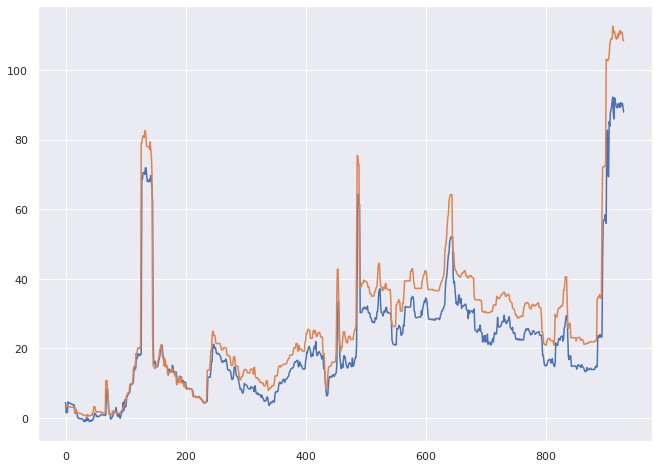

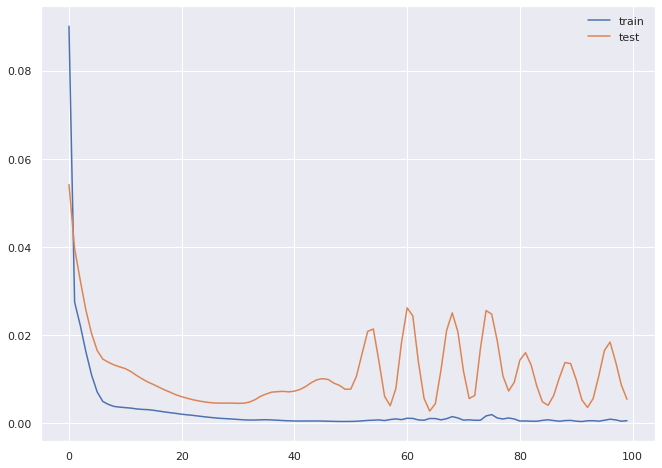

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[ 0.00433419 -0.00056026 -0.01538881 -0.02332529  0.02417697  0.01829449
 -0.00642134 -0.03244028  0.00943461 -0.03399079 -0.00012651  0.01990068
  0.04059184 -0.03118635 -0.02101666 -0.00211849 -0.00059641 -0.02465487
  0.0533046  -0.01243056 -0.02875365  0.01095744]
Mean: -0.0023643393
Standard Deviation: 0.023304008


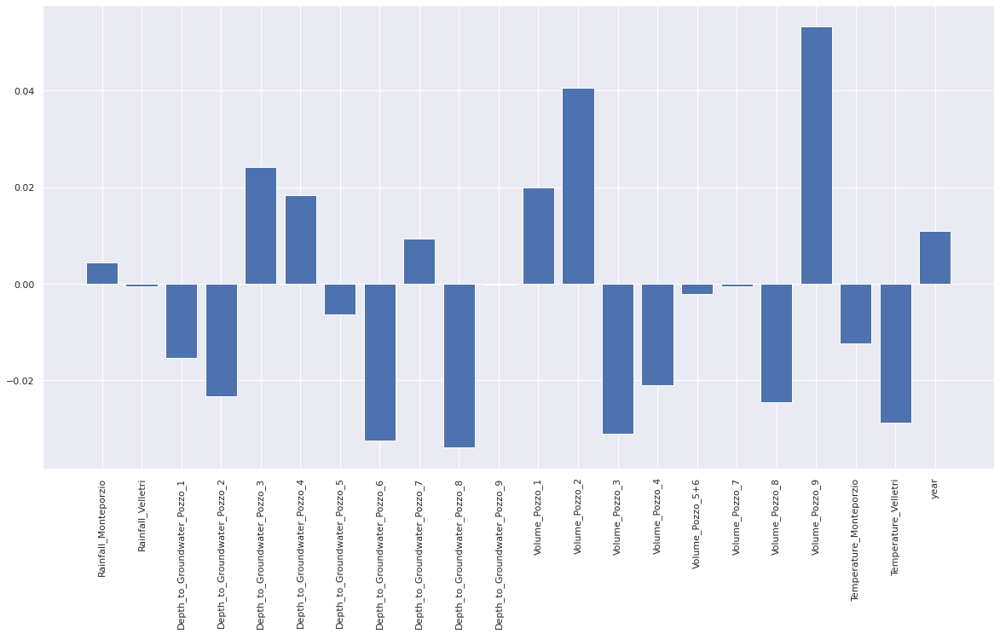

Selected Features - (array([ 3,  4,  7,  9, 12, 13, 14, 17, 18, 20]),)
foo shape - (2172, 1, 1, 10)
Train reshape - (2172, 1, 10)
foo shape - (931, 1, 1, 10)
Test reshape - (931, 1, 10)
Epoch 1/100
68/68 - 2s - loss: 0.2106 - val_loss: 0.0344
Epoch 2/100
68/68 - 0s - loss: 0.0049 - val_loss: 0.0269
Epoch 3/100
68/68 - 0s - loss: 0.0032 - val_loss: 0.0273
Epoch 4/100
68/68 - 0s - loss: 0.0032 - val_loss: 0.0271
Epoch 5/100
68/68 - 0s - loss: 0.0031 - val_loss: 0.0271
Epoch 6/100
68/68 - 0s - loss: 0.0028 - val_loss: 0.0275
Epoch 7/100
68/68 - 0s - loss: 0.0025 - val_loss: 0.0263
Epoch 8/100
68/68 - 1s - loss: 0.0026 - val_loss: 0.0261
Epoch 9/100
68/68 - 0s - loss: 0.0025 - val_loss: 0.0263
Epoch 10/100
68/68 - 0s - loss: 0.0023 - val_loss: 0.0253
Epoch 11/100
68/68 - 0s - loss: 0.0020 - val_loss: 0.0249
Epoch 12/100
68/68 - 0s - loss: 0.0018 - val_loss: 0.0241
Epoch 13/100
68/68 - 0s - loss: 0.0016 - val_loss: 0.0222
Epoch 14/100
68/68 - 0s - loss: 0.0014 - val_loss: 0.0227
Epoch 15/10

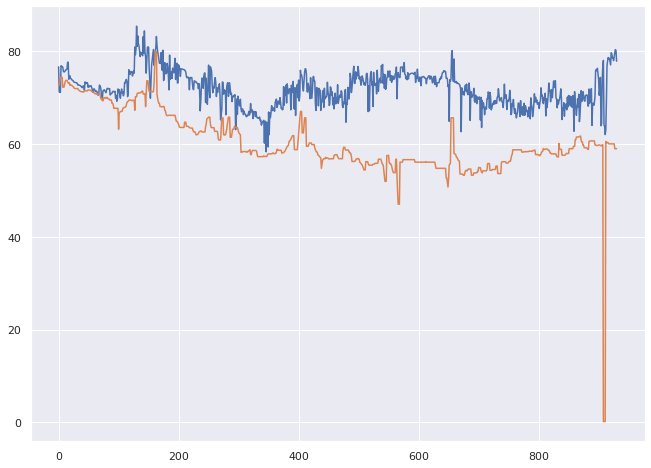

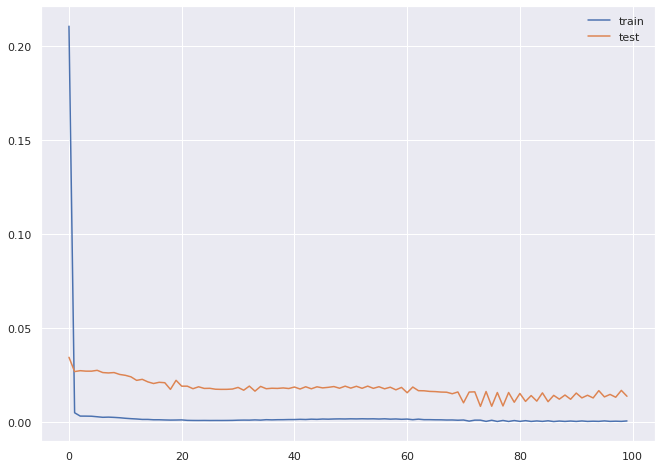

2172 931
(2172, 1, 22) (2172,) (931, 1, 22) (931,)
[ 0.01051804  0.01248457  0.00372473  0.00833214 -0.04932929  0.04120519
  0.02746014 -0.00986455  0.01838623 -0.0320318   0.00272728  0.01129323
 -0.008259    0.01093339 -0.03198982  0.01373131 -0.02735235  0.0069964
 -0.00046422 -0.00404896 -0.00456303 -0.0058741 ]
Mean: -0.00027202035
Standard Deviation: 0.020336408


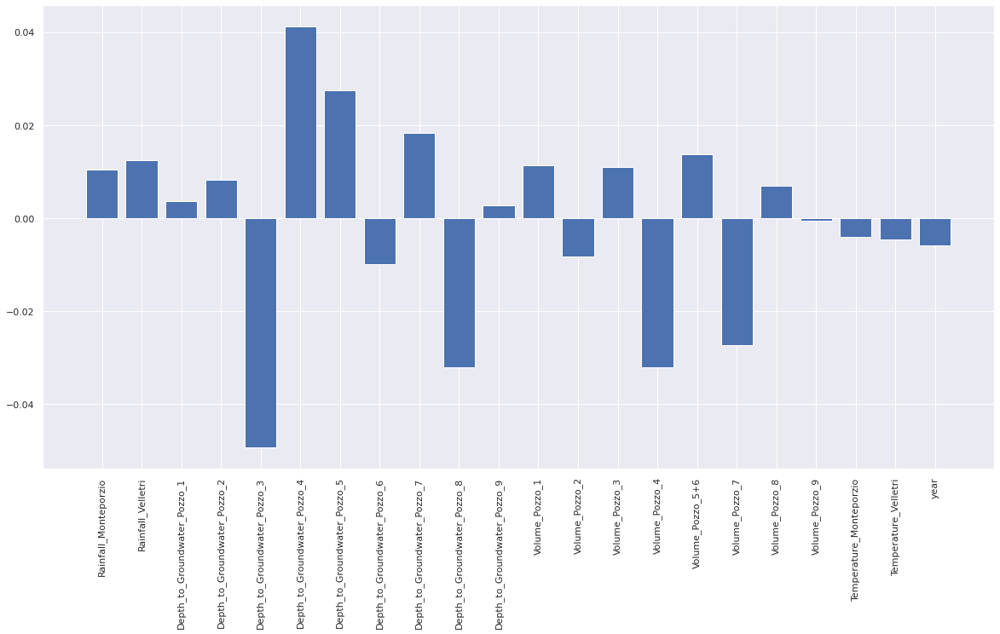

Selected Features - (array([ 4,  5,  6,  9, 14, 16]),)
foo shape - (2172, 1, 1, 6)
Train reshape - (2172, 1, 6)
foo shape - (931, 1, 1, 6)
Test reshape - (931, 1, 6)
Epoch 1/100
68/68 - 2s - loss: 0.2955 - val_loss: 0.0440
Epoch 2/100
68/68 - 0s - loss: 0.0774 - val_loss: 0.0340
Epoch 3/100
68/68 - 0s - loss: 0.0670 - val_loss: 0.0339
Epoch 4/100
68/68 - 1s - loss: 0.0658 - val_loss: 0.0341
Epoch 5/100
68/68 - 0s - loss: 0.0645 - val_loss: 0.0344
Epoch 6/100
68/68 - 0s - loss: 0.0636 - val_loss: 0.0347
Epoch 7/100
68/68 - 0s - loss: 0.0624 - val_loss: 0.0350
Epoch 8/100
68/68 - 0s - loss: 0.0617 - val_loss: 0.0353
Epoch 9/100
68/68 - 0s - loss: 0.0605 - val_loss: 0.0356
Epoch 10/100
68/68 - 0s - loss: 0.0601 - val_loss: 0.0361
Epoch 11/100
68/68 - 0s - loss: 0.0590 - val_loss: 0.0367
Epoch 12/100
68/68 - 0s - loss: 0.0586 - val_loss: 0.0373
Epoch 13/100
68/68 - 0s - loss: 0.0575 - val_loss: 0.0376
Epoch 14/100
68/68 - 0s - loss: 0.0573 - val_loss: 0.0384
Epoch 15/100
68/68 - 0s - loss:

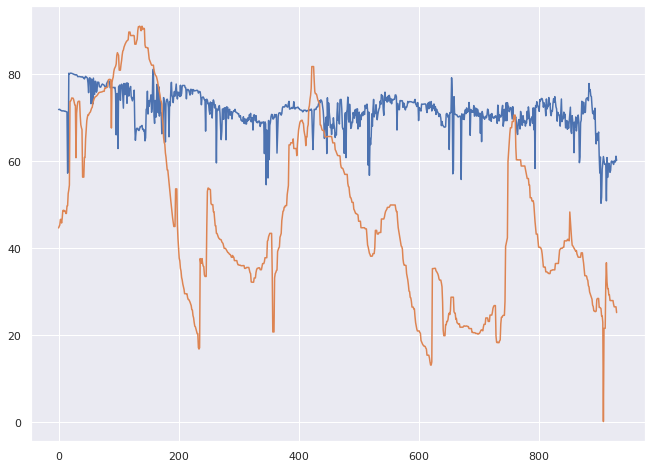

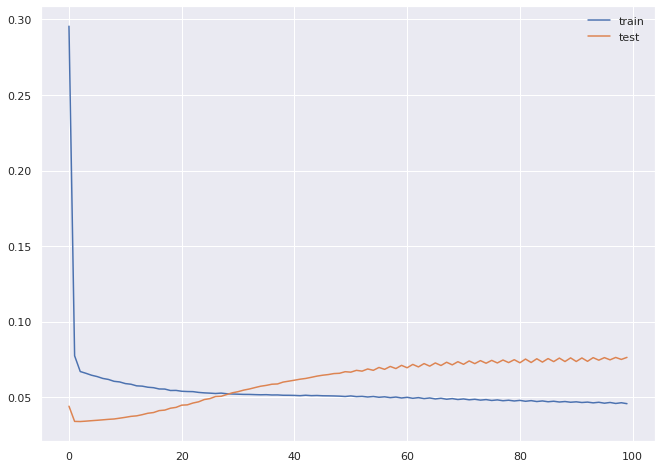

Dataset for imputation -            Date  Rainfall_Simignano  ...  year  month
2922 2008-01-01                 NaN  ...  2008    Jan
2923 2008-01-02                 NaN  ...  2008    Jan
2924 2008-01-03                 NaN  ...  2008    Jan
2925 2008-01-04                 4.0  ...  2008    Jan
2926 2008-01-05                 2.2  ...  2008    Jan
...         ...                 ...  ...   ...    ...
7482 2020-06-26                 NaN  ...  2020    Jun
7483 2020-06-27                 NaN  ...  2020    Jun
7484 2020-06-28                 NaN  ...  2020    Jun
7485 2020-06-29                 NaN  ...  2020    Jun
7486 2020-06-30                 NaN  ...  2020    Jun

[4565 rows x 24 columns]
(1522, 8)
(1522,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


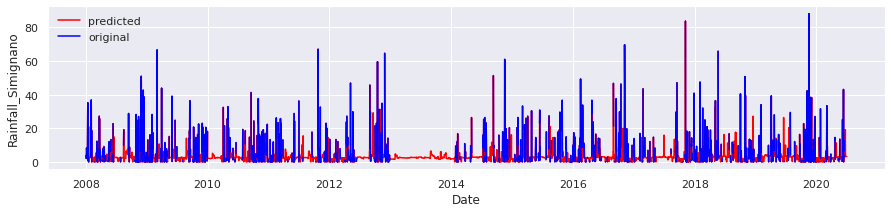

(339, 8)
(339,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


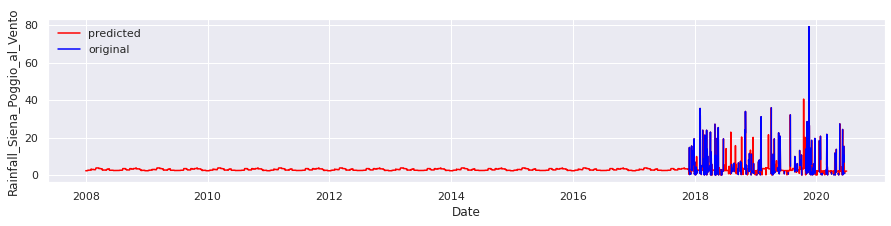

(611, 8)
(611,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


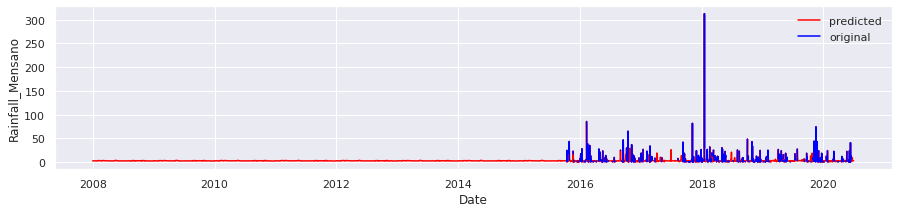

(1826, 8)
(1826,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


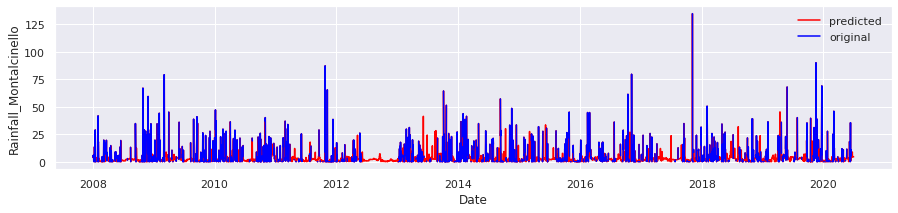

(938, 8)
(938,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


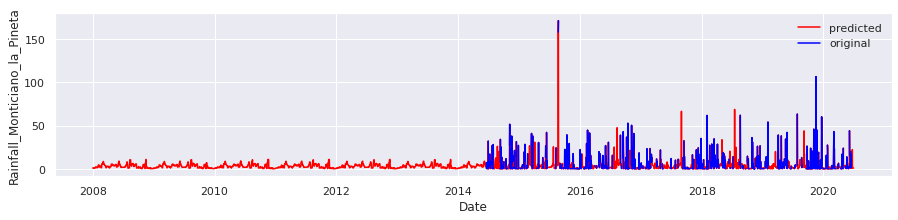

(1764, 8)
(1764,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


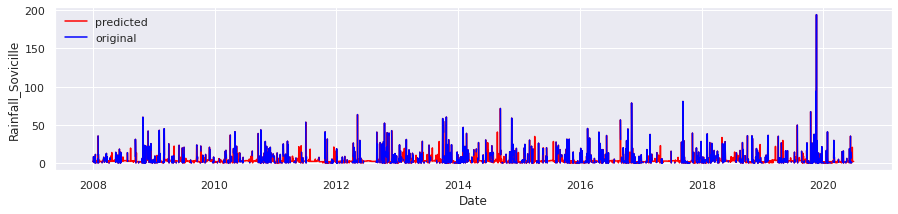

(555, 8)
(555,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


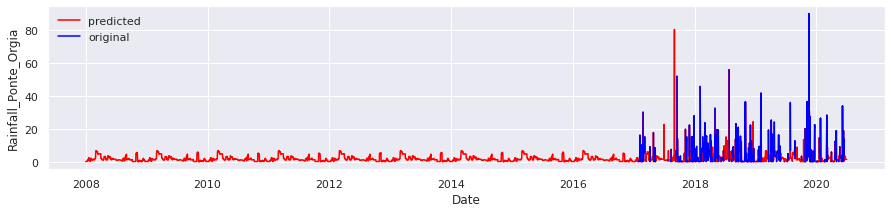

(1235, 8)
(1235,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


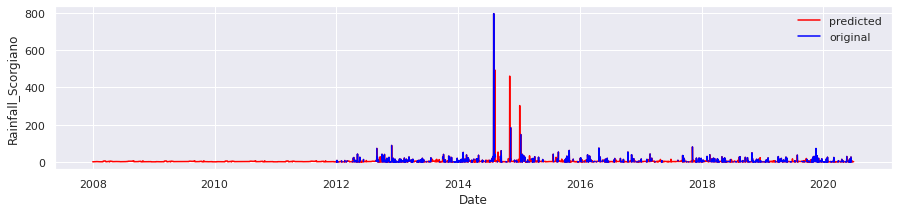

(983, 8)
(983,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


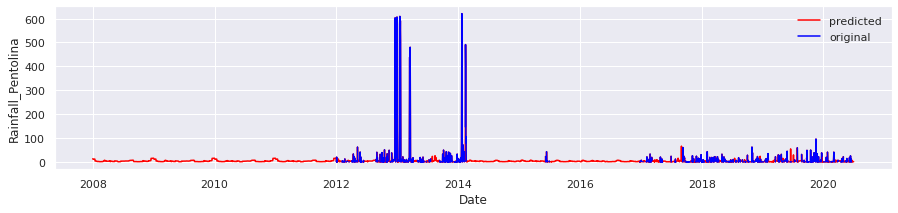

(1263, 8)
(1263,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


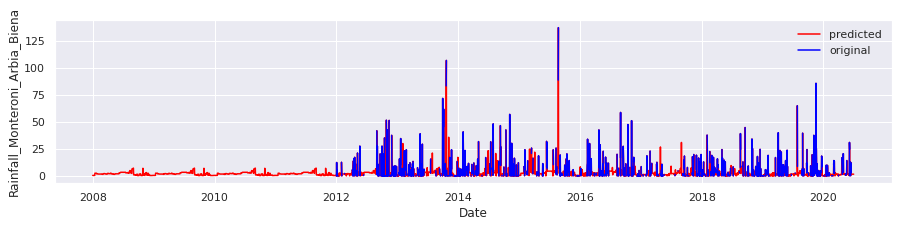

(3346, 8)
(3346,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


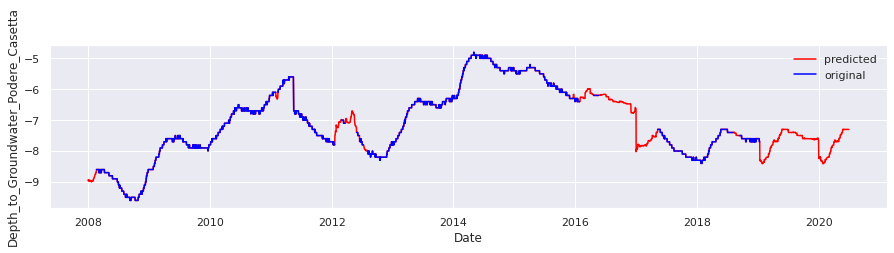

(1012, 8)
(1012,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


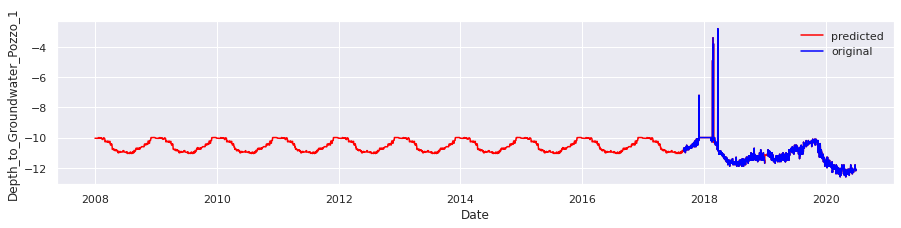

(920, 8)
(920,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


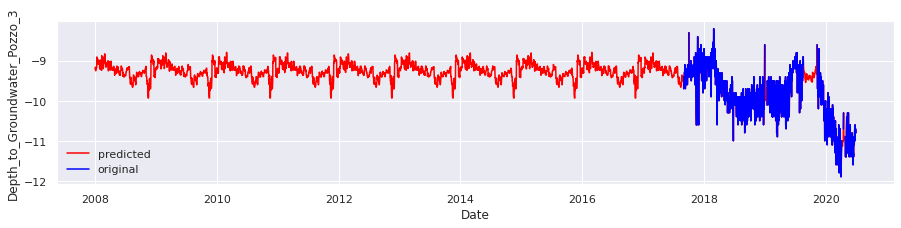

(965, 8)
(965,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


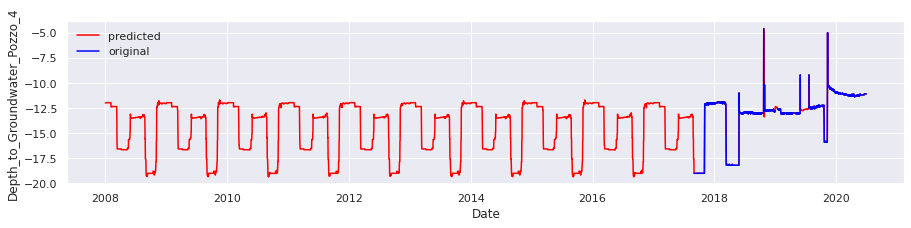

(953, 8)
(953,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


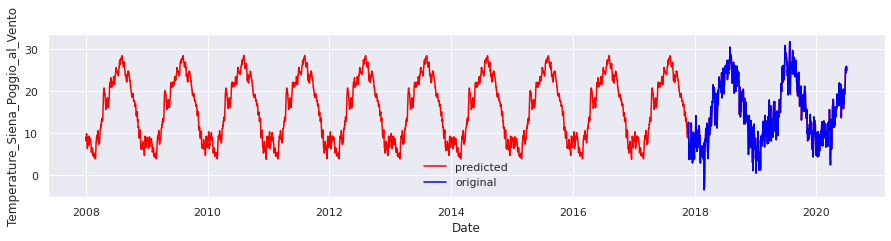

(1720, 8)
(1720,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


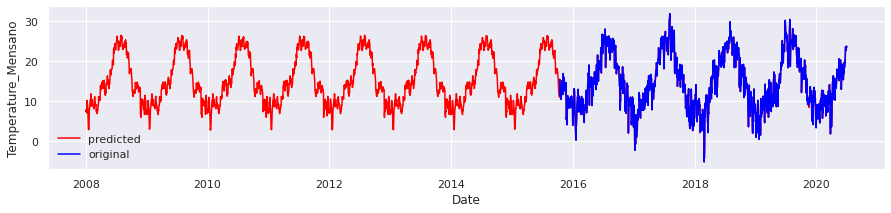

(4375, 8)
(4375,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


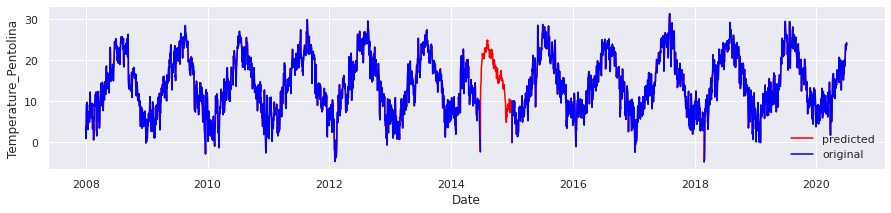

(4522, 8)
(4522,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


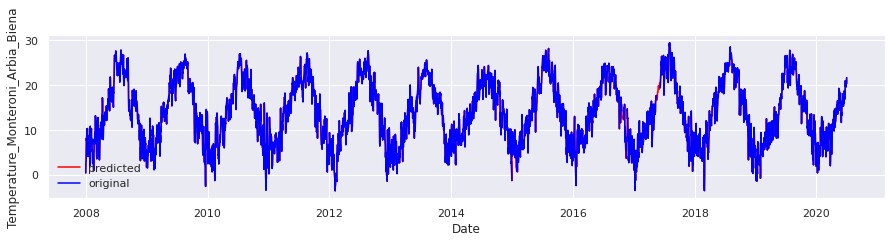

(2008, 8)
(2008,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


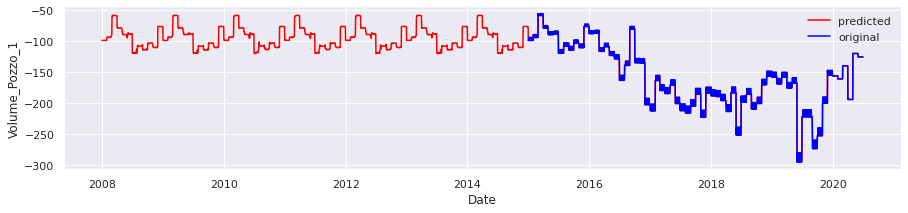

(1947, 8)
(1947,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


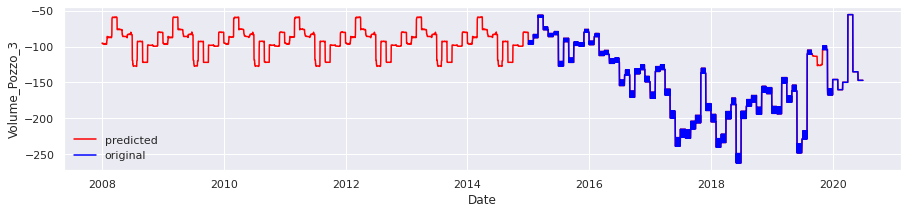

(2008, 8)
(2008,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


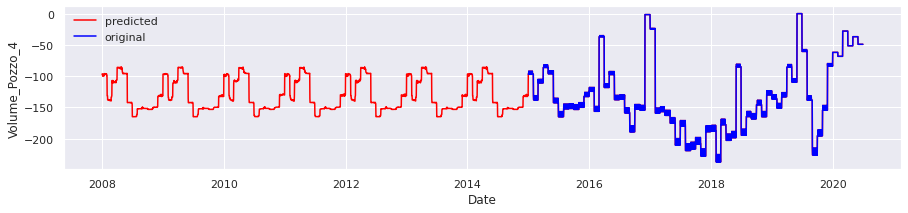


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Depth_to_Groundwater_Podere_Casetta']
Index(['Rainfall_Simignano', 'Rainfall_Siena_Poggio_al_Vento',
       'Rainfall_Mensano', 'Rainfall_Montalcinello',
       'Rainfall_Monticiano_la_Pineta', 'Rainfall_Sovicille',
       'Rainfall_Ponte_Orgia', 'Rainfall_Scorgiano', 'Rainfall_Pentolina',
       'Rainfall_Monteroni_Arbia_Biena', 'Depth_to_Groundwater_Podere_Casetta',
       'Depth_to_Groundwater_Pozzo_1', 'Depth_to_Groundwater_Pozzo_3',
       'Depth_to_Groundwater_Pozzo_4', 'Temperature_Siena_Poggio_al_Vento',
       'Temperature_Mensano', 'Temperature_Pentolina',
       'Temperature_Monteroni_Arbia_Biena', 'Volume_Pozzo_1', 'Volume_Pozzo_3',
       'Volume_Pozzo_4', 'year'],
      dtype='object')
-0.002283105 0.011415524
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', '

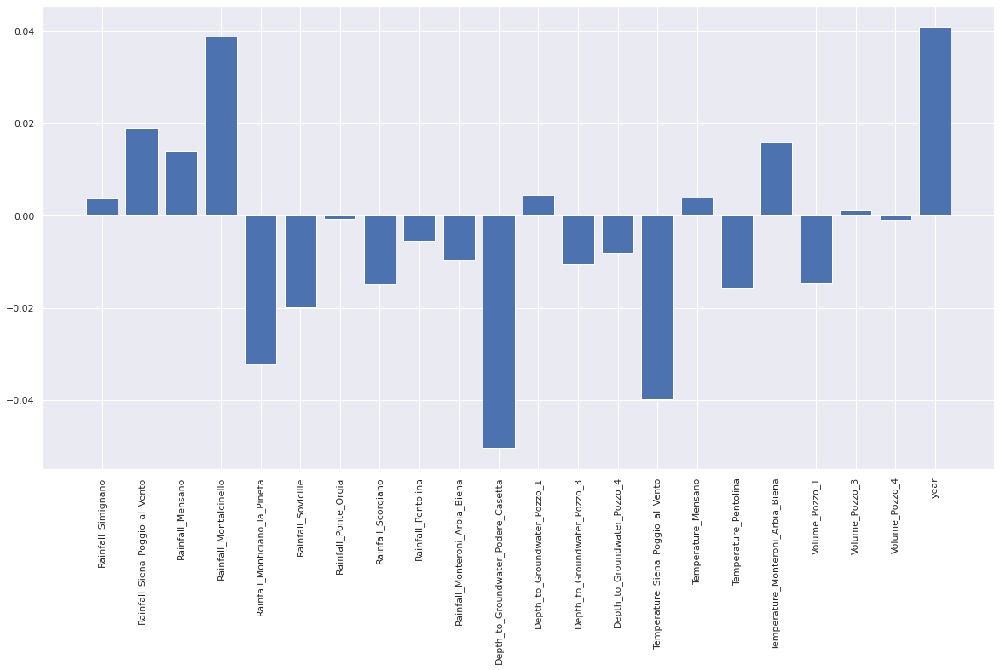

Selected Features - (array([ 3,  4, 10, 14, 21]),)
foo shape - (3194, 1, 1, 5)
Train reshape - (3194, 1, 5)
foo shape - (1370, 1, 1, 5)
Test reshape - (1370, 1, 5)
Epoch 1/100
100/100 - 2s - loss: 0.1032 - val_loss: 0.1103
Epoch 2/100
100/100 - 0s - loss: 0.0297 - val_loss: 0.1317
Epoch 3/100
100/100 - 0s - loss: 0.0241 - val_loss: 0.1129
Epoch 4/100
100/100 - 0s - loss: 0.0186 - val_loss: 0.0936
Epoch 5/100
100/100 - 0s - loss: 0.0144 - val_loss: 0.0724
Epoch 6/100
100/100 - 0s - loss: 0.0111 - val_loss: 0.0528
Epoch 7/100
100/100 - 0s - loss: 0.0084 - val_loss: 0.0362
Epoch 8/100
100/100 - 0s - loss: 0.0064 - val_loss: 0.0229
Epoch 9/100
100/100 - 0s - loss: 0.0047 - val_loss: 0.0132
Epoch 10/100
100/100 - 0s - loss: 0.0034 - val_loss: 0.0068
Epoch 11/100
100/100 - 1s - loss: 0.0024 - val_loss: 0.0031
Epoch 12/100
100/100 - 0s - loss: 0.0016 - val_loss: 0.0013
Epoch 13/100
100/100 - 0s - loss: 0.0011 - val_loss: 6.2484e-04
Epoch 14/100
100/100 - 0s - loss: 7.6541e-04 - val_loss: 4.05

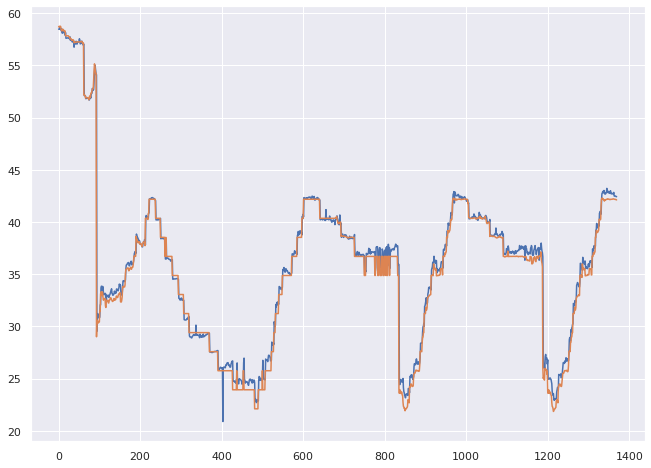

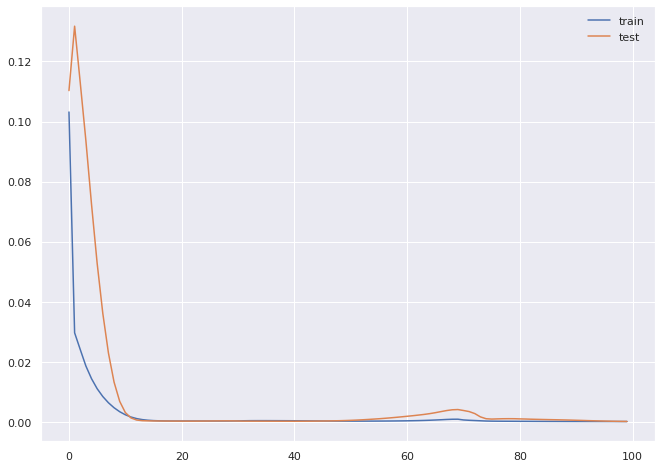

Dataset for imputation -            Date  Rainfall_Bastia_Umbra  ...  year  month
0    2006-03-14                    NaN  ...  2006    Mar
1    2006-03-15                    NaN  ...  2006    Mar
2    2006-03-16                    NaN  ...  2006    Mar
3    2006-03-17                    NaN  ...  2006    Mar
4    2006-03-18                    NaN  ...  2006    Mar
...         ...                    ...  ...   ...    ...
5218 2020-06-26                    NaN  ...  2020    Jun
5219 2020-06-27                    NaN  ...  2020    Jun
5220 2020-06-28                    NaN  ...  2020    Jun
5221 2020-06-29                    NaN  ...  2020    Jun
5222 2020-06-30                    NaN  ...  2020    Jun

[5223 rows x 10 columns]
(1052, 8)
(1052,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


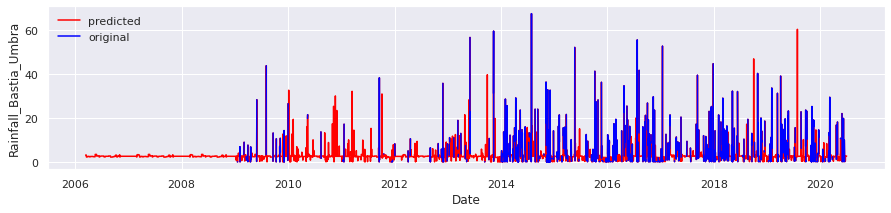

(5168, 8)
(5168,)


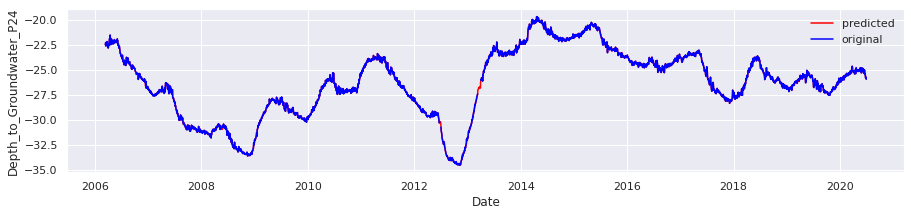

(5184, 8)
(5184,)


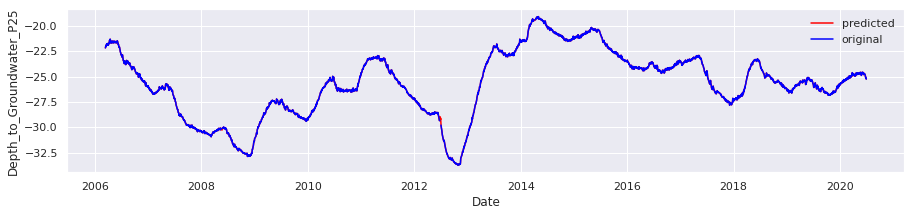

(4192, 8)
(4192,)


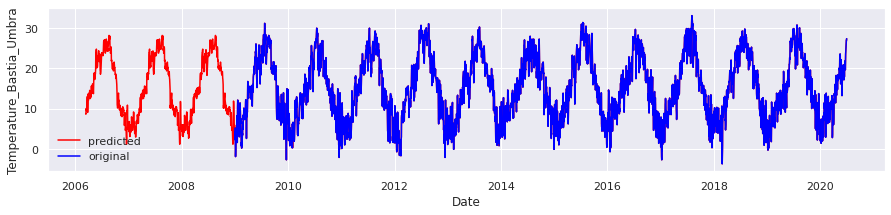

(4046, 8)
(4046,)


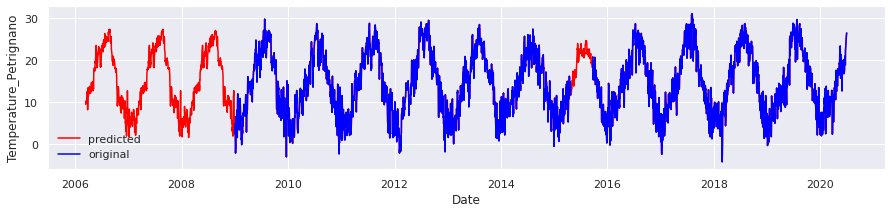

(4995, 8)
(4995,)


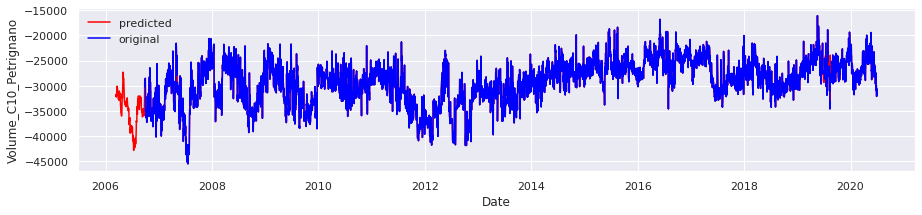

(4049, 8)
(4049,)


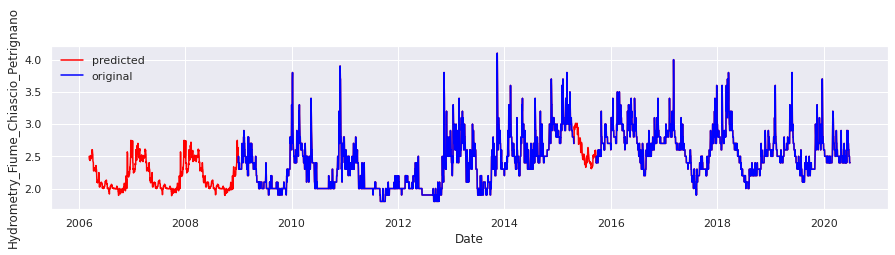

target Attributes - ['Depth_to_Groundwater_P24', 'Depth_to_Groundwater_P25']
Index(['Rainfall_Bastia_Umbra', 'Depth_to_Groundwater_P24',
       'Depth_to_Groundwater_P25', 'Temperature_Bastia_Umbra',
       'Temperature_Petrignano', 'Volume_C10_Petrignano',
       'Hydrometry_Fiume_Chiascio_Petrignano', 'year'],
      dtype='object')
-0.0014880951 0.0148809515
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var2(t)', 'var3(t)'],
      dtype='object')
3655 1567
(3655, 1, 8) (3655,) (1567, 1, 8) (1567,)
[ 0.02305404 -0.03614701  0.0202753   0.01797919 -0.00199966  0.02839216
 -0.00317373 -0.01318931]
Mean: 0.004398873
Standard Deviation: 0.020651203


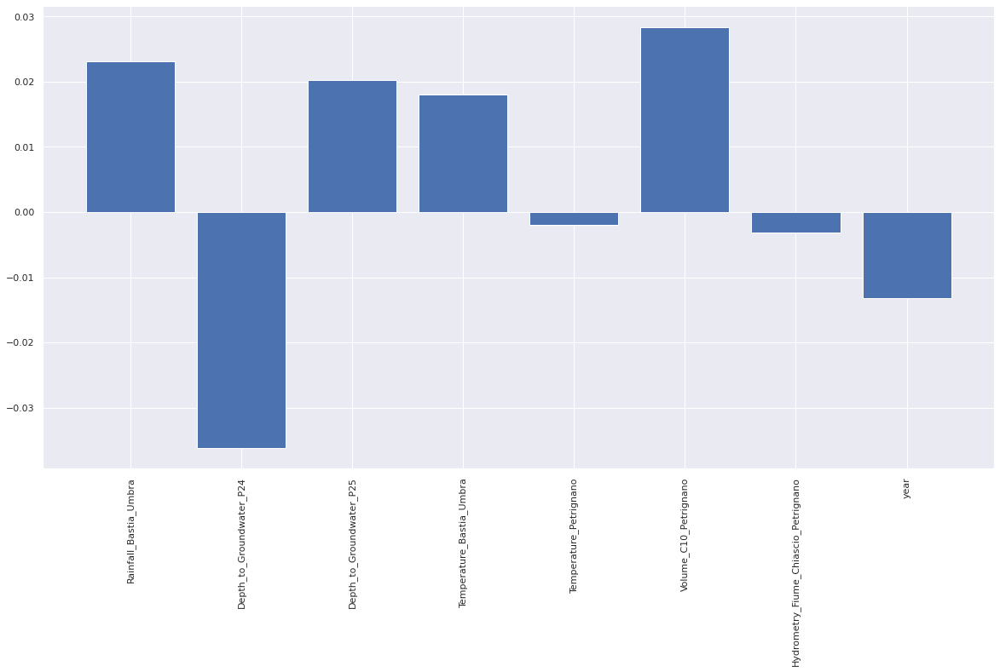

Selected Features - (array([0, 1, 2, 5]),)
foo shape - (3655, 1, 1, 4)
Train reshape - (3655, 1, 4)
foo shape - (1567, 1, 1, 4)
Test reshape - (1567, 1, 4)
Epoch 1/100
115/115 - 2s - loss: 0.1406 - val_loss: 0.0048
Epoch 2/100
115/115 - 0s - loss: 0.0197 - val_loss: 0.0141
Epoch 3/100
115/115 - 0s - loss: 0.0133 - val_loss: 0.0101
Epoch 4/100
115/115 - 0s - loss: 0.0084 - val_loss: 0.0050
Epoch 5/100
115/115 - 0s - loss: 0.0050 - val_loss: 0.0017
Epoch 6/100
115/115 - 0s - loss: 0.0028 - val_loss: 3.4988e-04
Epoch 7/100
115/115 - 0s - loss: 0.0015 - val_loss: 1.9102e-04
Epoch 8/100
115/115 - 0s - loss: 7.4209e-04 - val_loss: 3.5887e-04
Epoch 9/100
115/115 - 0s - loss: 4.1442e-04 - val_loss: 4.5515e-04
Epoch 10/100
115/115 - 1s - loss: 3.2270e-04 - val_loss: 4.5477e-04
Epoch 11/100
115/115 - 0s - loss: 3.0597e-04 - val_loss: 4.2519e-04
Epoch 12/100
115/115 - 0s - loss: 3.0112e-04 - val_loss: 3.9365e-04
Epoch 13/100
115/115 - 0s - loss: 2.9578e-04 - val_loss: 3.6560e-04
Epoch 14/100
115/

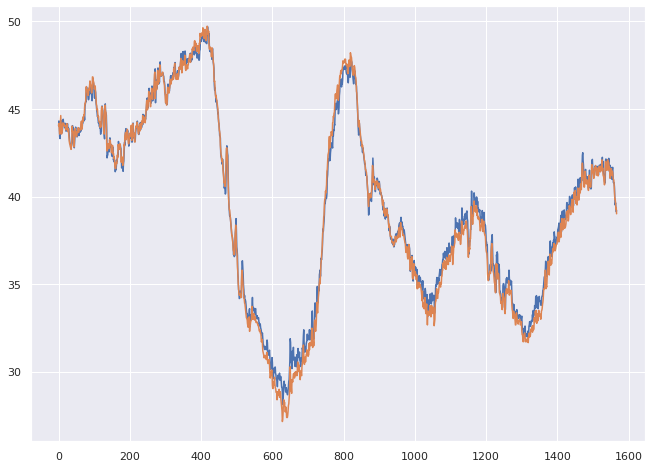

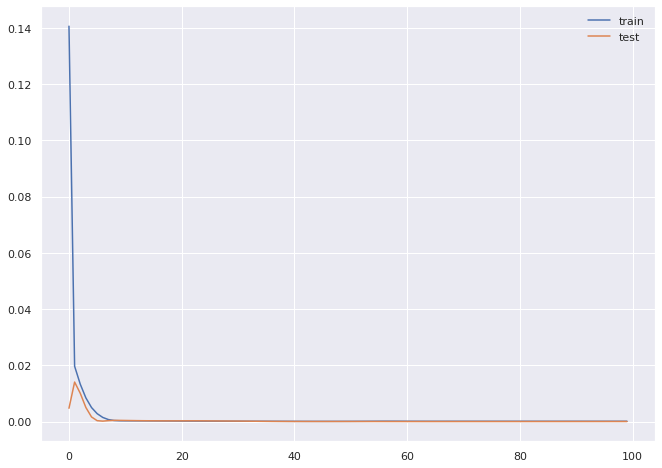

3655 1567
(3655, 1, 8) (3655,) (1567, 1, 8) (1567,)
[ 0.00108034  0.00079705 -0.01079775  0.00428223 -0.01490573  0.00030347
 -0.04400248  0.02021482]
Mean: -0.0053785075
Standard Deviation: 0.017579941


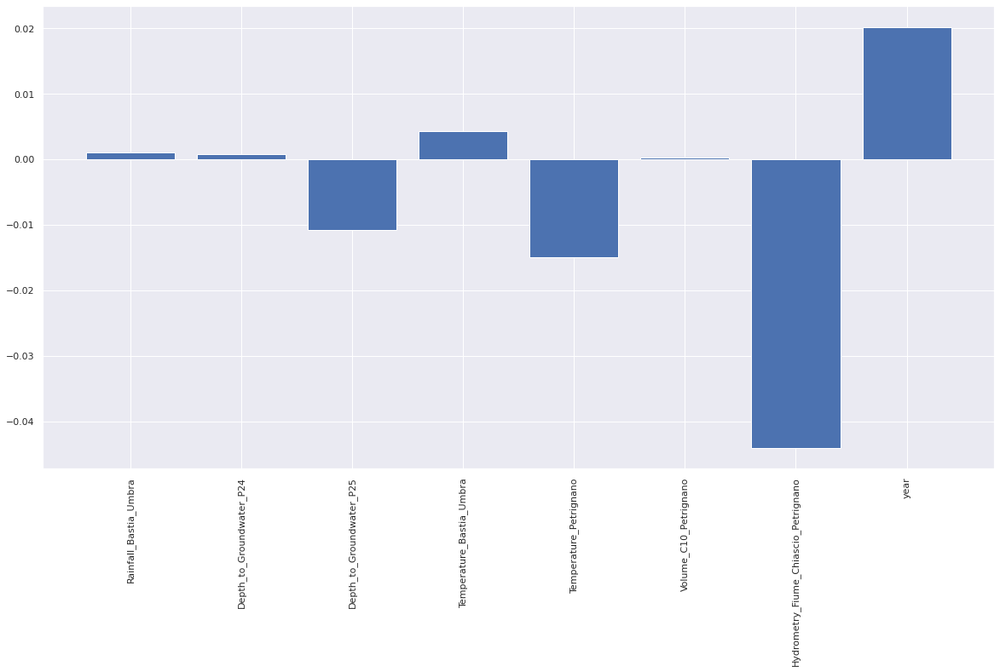

Selected Features - (array([6, 7]),)
foo shape - (3655, 1, 1, 2)
Train reshape - (3655, 1, 2)
foo shape - (1567, 1, 1, 2)
Test reshape - (1567, 1, 2)
Epoch 1/100
115/115 - 2s - loss: 0.1851 - val_loss: 0.0107
Epoch 2/100
115/115 - 0s - loss: 0.0559 - val_loss: 0.0728
Epoch 3/100
115/115 - 1s - loss: 0.0546 - val_loss: 0.0840
Epoch 4/100
115/115 - 0s - loss: 0.0542 - val_loss: 0.0892
Epoch 5/100
115/115 - 0s - loss: 0.0539 - val_loss: 0.0940
Epoch 6/100
115/115 - 0s - loss: 0.0537 - val_loss: 0.0983
Epoch 7/100
115/115 - 0s - loss: 0.0535 - val_loss: 0.1022
Epoch 8/100
115/115 - 0s - loss: 0.0533 - val_loss: 0.1059
Epoch 9/100
115/115 - 0s - loss: 0.0532 - val_loss: 0.1091
Epoch 10/100
115/115 - 0s - loss: 0.0531 - val_loss: 0.1120
Epoch 11/100
115/115 - 0s - loss: 0.0531 - val_loss: 0.1148
Epoch 12/100
115/115 - 0s - loss: 0.0530 - val_loss: 0.1172
Epoch 13/100
115/115 - 0s - loss: 0.0530 - val_loss: 0.1194
Epoch 14/100
115/115 - 0s - loss: 0.0529 - val_loss: 0.1213
Epoch 15/100
115/11

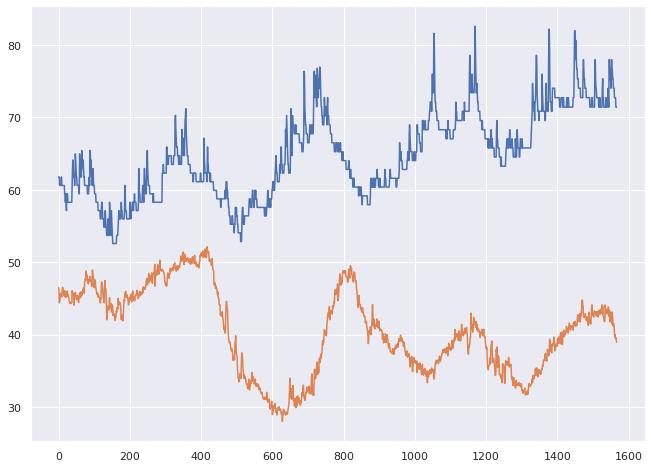

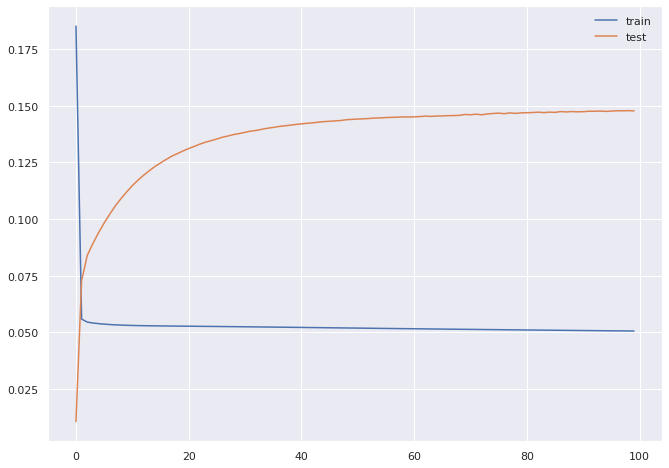

Dataset for imputation -            Date  Rainfall_S_Piero  Rainfall_Mangona  ...  Flow_Rate  year  month
0    2002-06-03               NaN               NaN  ...       0.31  2002    Jun
1    2002-06-04               NaN               NaN  ...       0.31  2002    Jun
2    2002-06-05               NaN               NaN  ...       0.31  2002    Jun
3    2002-06-06               NaN               NaN  ...       0.31  2002    Jun
4    2002-06-07               NaN               NaN  ...       0.31  2002    Jun
...         ...               ...               ...  ...        ...   ...    ...
6598 2020-06-26               NaN               NaN  ...       0.60  2020    Jun
6599 2020-06-27               NaN               NaN  ...       0.60  2020    Jun
6600 2020-06-28               NaN               NaN  ...       0.60  2020    Jun
6601 2020-06-29               NaN               NaN  ...       0.60  2020    Jun
6602 2020-06-30               NaN               NaN  ...       0.60  2020    Jun

[6

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


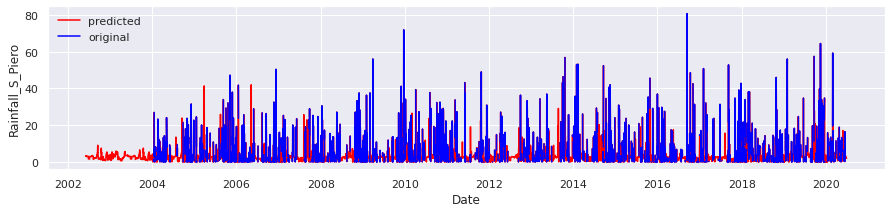

(2204, 8)
(2204,)


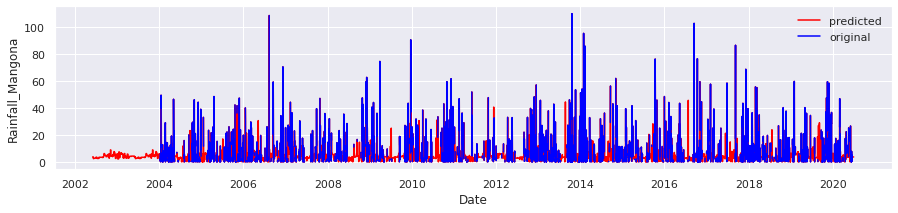

(2271, 8)
(2271,)


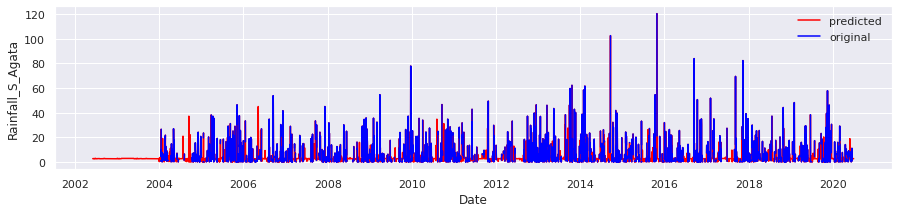

(1902, 8)
(1902,)


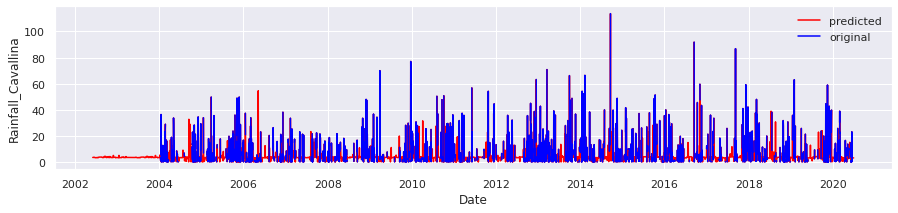

(2247, 8)
(2247,)


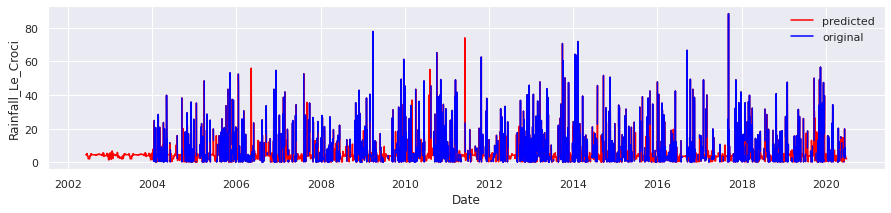

(6024, 8)
(6024,)


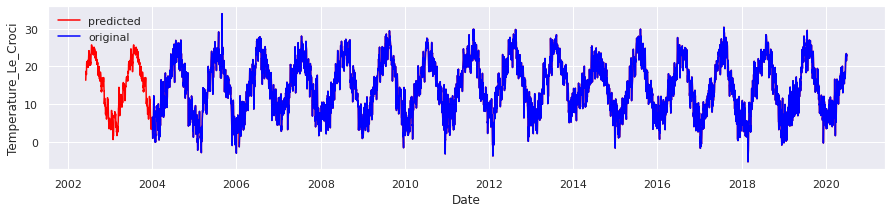

(6603, 8)
(6603,)


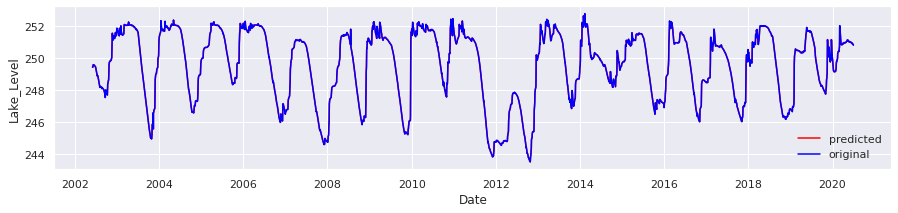

(6582, 8)
(6582,)


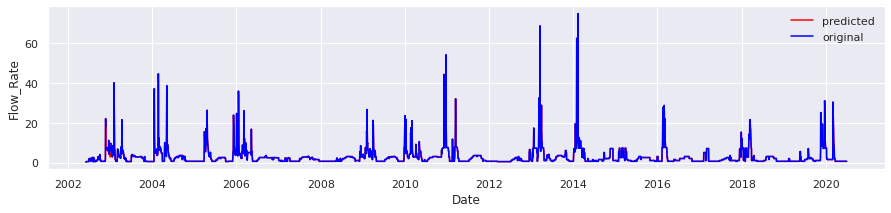

target Attributes - ['Lake_Level', 'Flow_Rate']
Index(['Rainfall_S_Piero', 'Rainfall_Mangona', 'Rainfall_S_Agata',
       'Rainfall_Cavallina', 'Rainfall_Le_Croci', 'Temperature_Le_Croci',
       'Lake_Level', 'Flow_Rate', 'year'],
      dtype='object')
-0.0024875624 0.012437811
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var7(t)',
       'var8(t)'],
      dtype='object')
4621 1981
(4621, 1, 9) (4621,) (1981, 1, 9) (1981,)
[ 0.03180176 -0.02264217 -0.00395637 -0.0046715  -0.00665794  0.03789483
 -0.05987411  0.00468694 -0.03360336]
Mean: -0.0063357675
Standard Deviation: 0.02870661


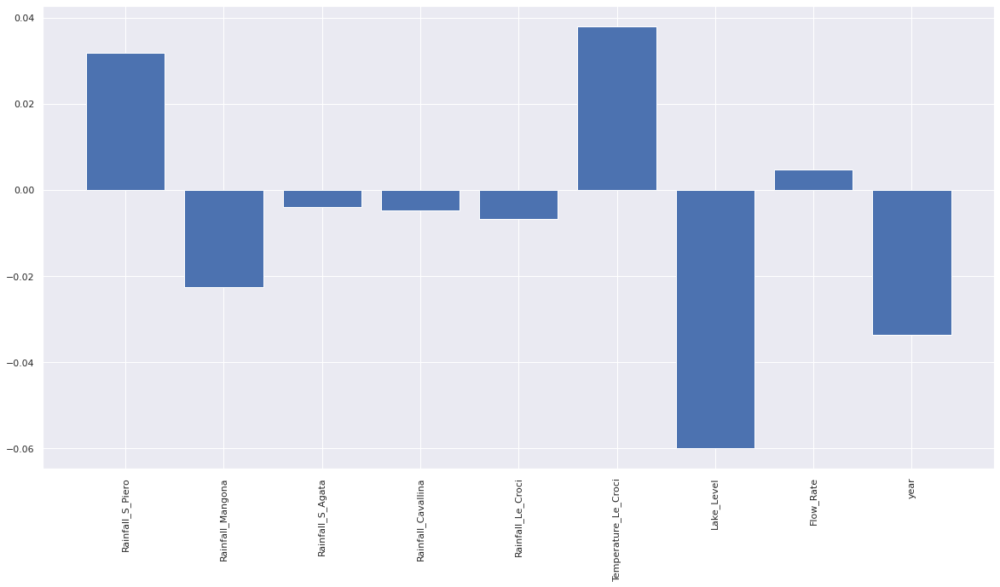

Selected Features - (array([0, 1, 5, 6, 8]),)
foo shape - (4621, 1, 1, 5)
Train reshape - (4621, 1, 5)
foo shape - (1981, 1, 1, 5)
Test reshape - (1981, 1, 5)
Epoch 1/100
145/145 - 2s - loss: 0.0033 - val_loss: 0.0026
Epoch 2/100
145/145 - 1s - loss: 0.0028 - val_loss: 0.0024
Epoch 3/100
145/145 - 0s - loss: 0.0027 - val_loss: 0.0023
Epoch 4/100
145/145 - 0s - loss: 0.0026 - val_loss: 0.0024
Epoch 5/100
145/145 - 0s - loss: 0.0025 - val_loss: 0.0024
Epoch 6/100
145/145 - 0s - loss: 0.0025 - val_loss: 0.0023
Epoch 7/100
145/145 - 0s - loss: 0.0024 - val_loss: 0.0024
Epoch 8/100
145/145 - 0s - loss: 0.0024 - val_loss: 0.0024
Epoch 9/100
145/145 - 0s - loss: 0.0023 - val_loss: 0.0024
Epoch 10/100
145/145 - 0s - loss: 0.0023 - val_loss: 0.0025
Epoch 11/100
145/145 - 0s - loss: 0.0023 - val_loss: 0.0025
Epoch 12/100
145/145 - 0s - loss: 0.0022 - val_loss: 0.0026
Epoch 13/100
145/145 - 0s - loss: 0.0022 - val_loss: 0.0026
Epoch 14/100
145/145 - 0s - loss: 0.0022 - val_loss: 0.0026
Epoch 15/1

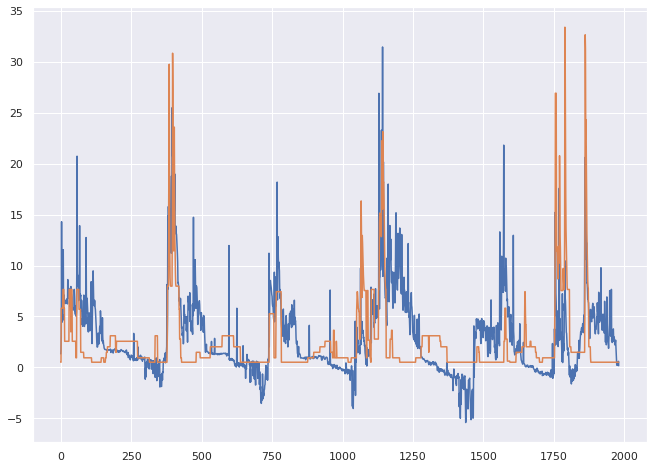

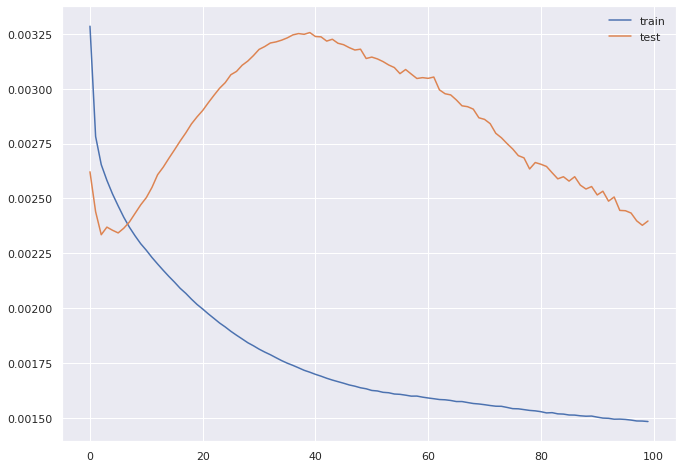

4621 1981
(4621, 1, 9) (4621,) (1981, 1, 9) (1981,)
[ 0.00550067  0.01764578 -0.00014487  0.00916066  0.02275534  0.02084995
 -0.00072548 -0.00434287 -0.06308159]
Mean: 0.00084639835
Standard Deviation: 0.024427492


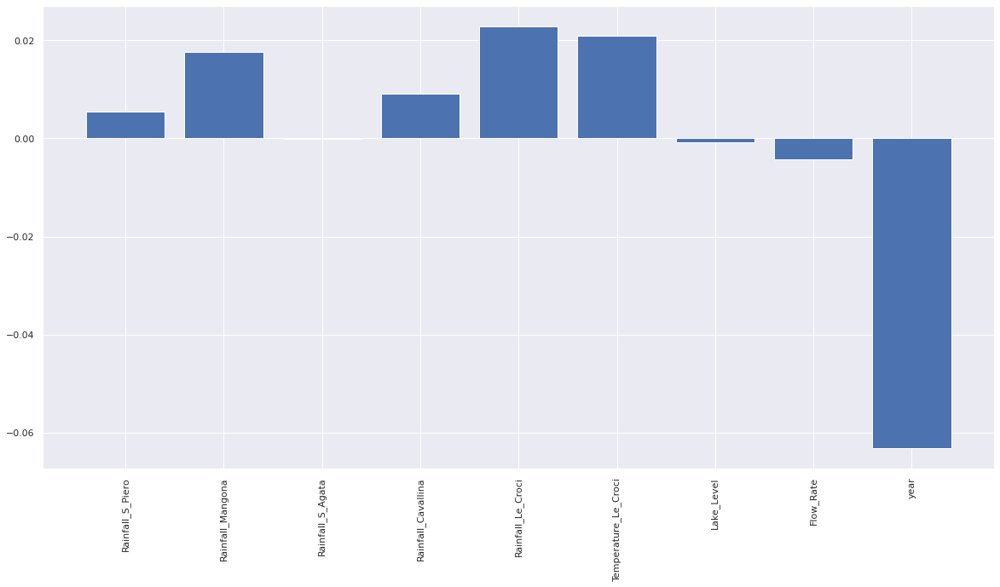

Selected Features - (array([4, 5, 8]),)
foo shape - (4621, 1, 1, 3)
Train reshape - (4621, 1, 3)
foo shape - (1981, 1, 1, 3)
Test reshape - (1981, 1, 3)
Epoch 1/100
145/145 - 2s - loss: 0.2445 - val_loss: 0.0354
Epoch 2/100
145/145 - 0s - loss: 0.0877 - val_loss: 0.0352
Epoch 3/100
145/145 - 0s - loss: 0.0843 - val_loss: 0.0352
Epoch 4/100
145/145 - 0s - loss: 0.0815 - val_loss: 0.0354
Epoch 5/100
145/145 - 0s - loss: 0.0793 - val_loss: 0.0358
Epoch 6/100
145/145 - 0s - loss: 0.0776 - val_loss: 0.0363
Epoch 7/100
145/145 - 0s - loss: 0.0761 - val_loss: 0.0368
Epoch 8/100
145/145 - 1s - loss: 0.0748 - val_loss: 0.0374
Epoch 9/100
145/145 - 0s - loss: 0.0738 - val_loss: 0.0380
Epoch 10/100
145/145 - 0s - loss: 0.0729 - val_loss: 0.0386
Epoch 11/100
145/145 - 0s - loss: 0.0722 - val_loss: 0.0392
Epoch 12/100
145/145 - 0s - loss: 0.0715 - val_loss: 0.0398
Epoch 13/100
145/145 - 0s - loss: 0.0710 - val_loss: 0.0404
Epoch 14/100
145/145 - 0s - loss: 0.0705 - val_loss: 0.0409
Epoch 15/100
145

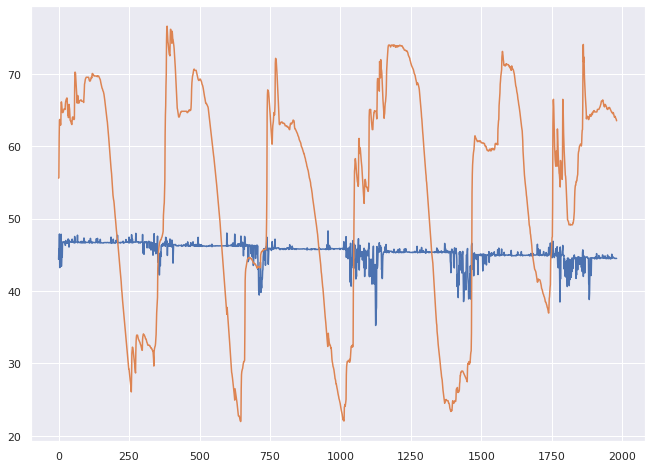

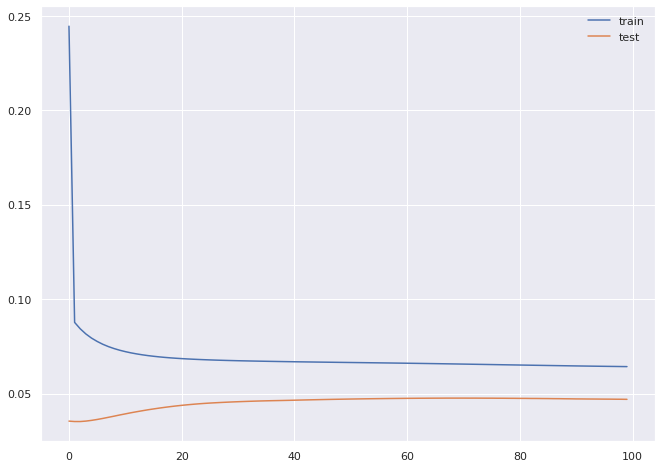

Dataset for imputation -            Date  Rainfall_Le_Croci  ...  year  month
0    1998-01-01                NaN  ...  1998    Jan
1    1998-01-02                NaN  ...  1998    Jan
2    1998-01-03                NaN  ...  1998    Jan
3    1998-01-04                NaN  ...  1998    Jan
4    1998-01-05                NaN  ...  1998    Jan
...         ...                ...  ...   ...    ...
8212 2020-06-26                NaN  ...  2020    Jun
8213 2020-06-27                NaN  ...  2020    Jun
8214 2020-06-28                NaN  ...  2020    Jun
8215 2020-06-29                NaN  ...  2020    Jun
8216 2020-06-30                NaN  ...  2020    Jun

[8217 rows x 19 columns]
(2247, 8)
(2247,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


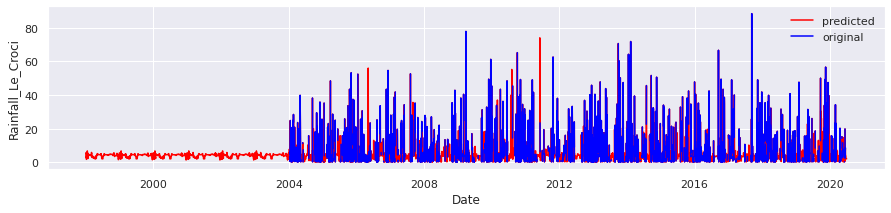

(1902, 8)
(1902,)


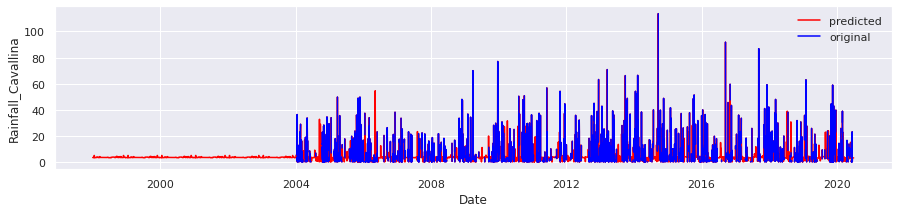

(2271, 8)
(2271,)


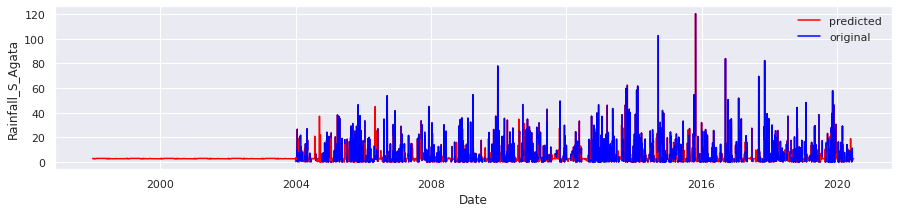

(2204, 8)
(2204,)


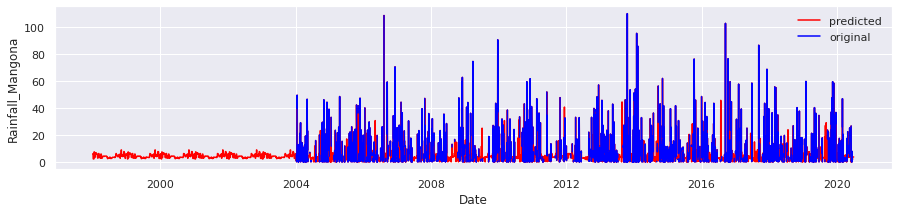

(2347, 8)
(2347,)


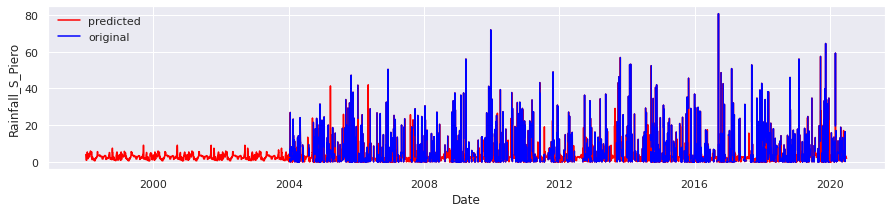

(1617, 8)
(1617,)


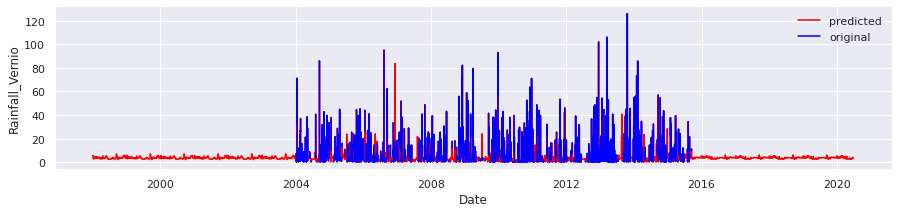

(478, 8)
(478,)


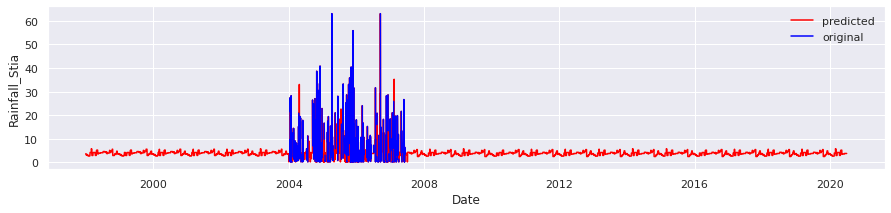

(549, 8)
(549,)


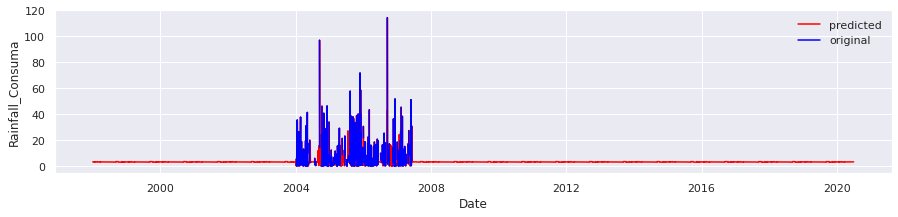

(1699, 8)
(1699,)


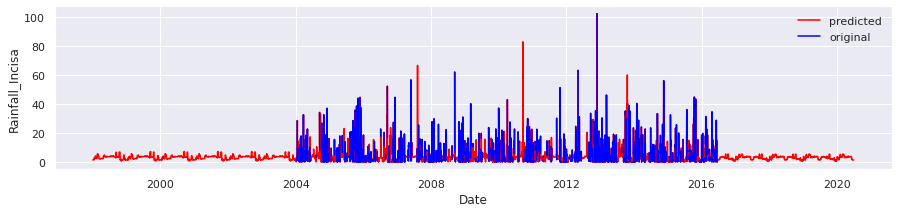

(565, 8)
(565,)


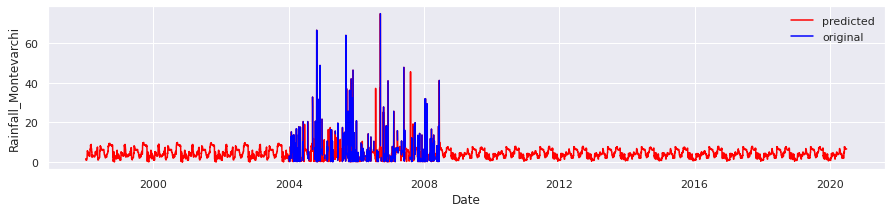

(520, 8)
(520,)


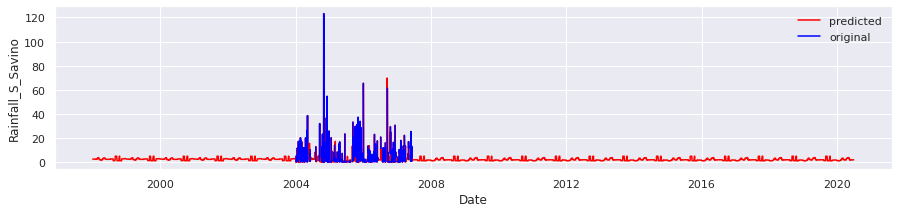

(441, 8)
(441,)


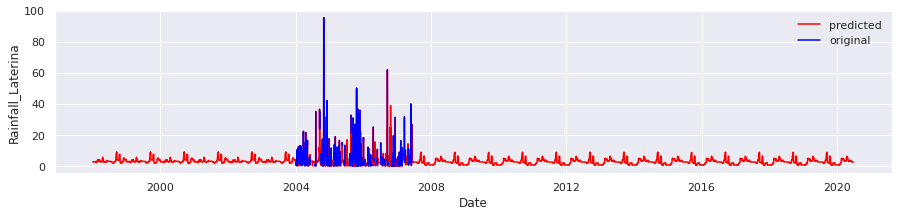

(876, 8)
(876,)


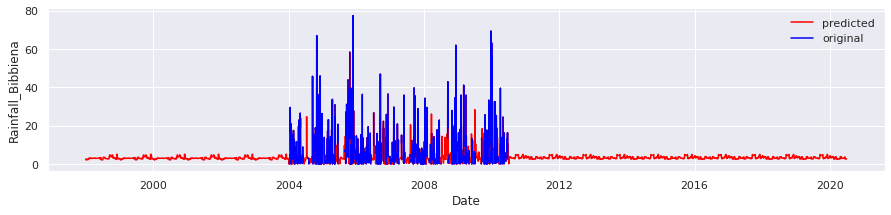

(540, 8)
(540,)


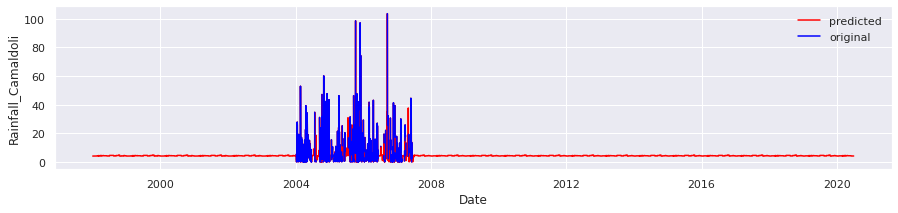

(6192, 8)
(6192,)


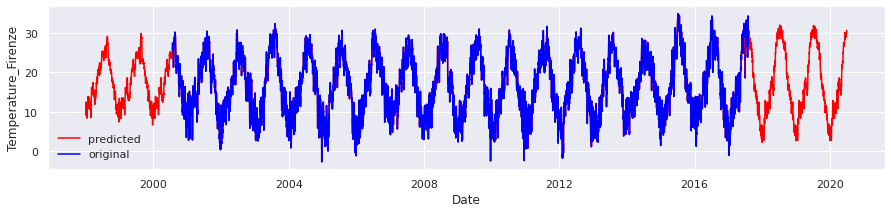

(7982, 8)
(7982,)


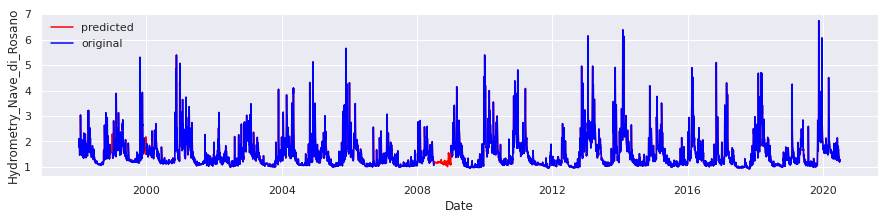

target Attributes - ['Hydrometry_Nave_di_Rosano']
Index(['Rainfall_Le_Croci', 'Rainfall_Cavallina', 'Rainfall_S_Agata',
       'Rainfall_Mangona', 'Rainfall_S_Piero', 'Rainfall_Vernio',
       'Rainfall_Stia', 'Rainfall_Consuma', 'Rainfall_Incisa',
       'Rainfall_Montevarchi', 'Rainfall_S_Savino', 'Rainfall_Laterina',
       'Rainfall_Bibbiena', 'Rainfall_Camaldoli', 'Temperature_Firenze',
       'Hydrometry_Nave_di_Rosano', 'year'],
      dtype='object')
-0.0022675737 0.011337868
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', 'var17(t-1)', 'var16(t)'],
      dtype='object')
5751 2465
(5751, 1, 17) (5751,) (2465, 1, 17) (2465,)
[-0.02474505  0.02511723 -0.00933255 -0.00340599  0.02625455  0.00757269
 -0.0068349  -0.02108682 -0.00331644 -0.01860852  0.00281824  0.03403885
 -0.02231375 -0.0323

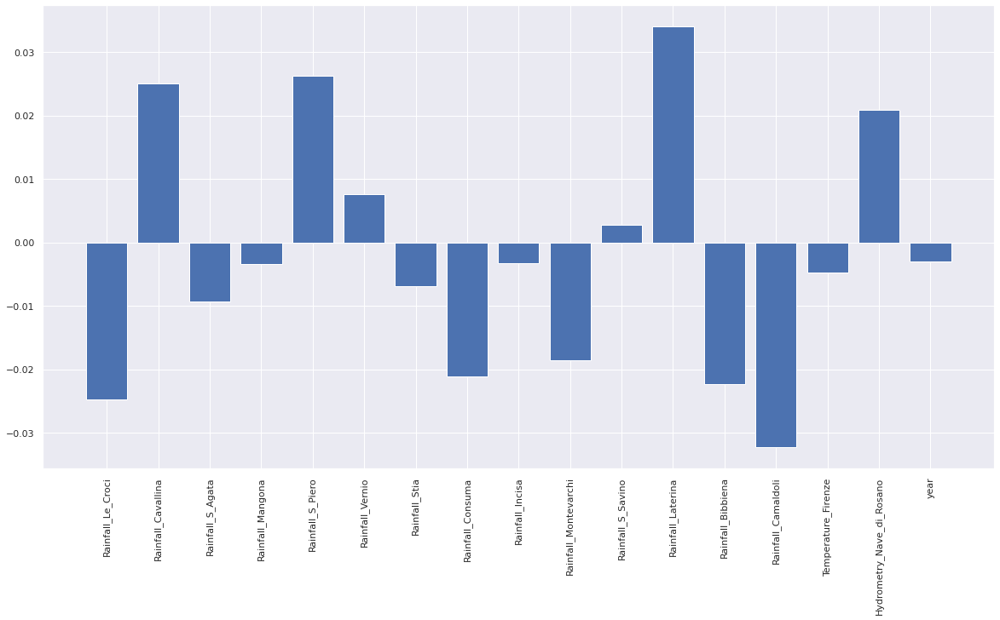

Selected Features - (array([ 0,  1,  4,  7, 11, 12, 13, 15]),)
foo shape - (5751, 1, 1, 8)
Train reshape - (5751, 1, 8)
foo shape - (2465, 1, 1, 8)
Test reshape - (2465, 1, 8)
Epoch 1/100
180/180 - 2s - loss: 0.0087 - val_loss: 0.0066
Epoch 2/100
180/180 - 0s - loss: 0.0045 - val_loss: 0.0037
Epoch 3/100
180/180 - 0s - loss: 0.0025 - val_loss: 0.0022
Epoch 4/100
180/180 - 0s - loss: 0.0019 - val_loss: 0.0021
Epoch 5/100
180/180 - 0s - loss: 0.0018 - val_loss: 0.0021
Epoch 6/100
180/180 - 0s - loss: 0.0017 - val_loss: 0.0021
Epoch 7/100
180/180 - 0s - loss: 0.0017 - val_loss: 0.0021
Epoch 8/100
180/180 - 0s - loss: 0.0017 - val_loss: 0.0021
Epoch 9/100
180/180 - 0s - loss: 0.0017 - val_loss: 0.0021
Epoch 10/100
180/180 - 0s - loss: 0.0017 - val_loss: 0.0021
Epoch 11/100
180/180 - 0s - loss: 0.0017 - val_loss: 0.0021
Epoch 12/100
180/180 - 0s - loss: 0.0017 - val_loss: 0.0021
Epoch 13/100
180/180 - 1s - loss: 0.0017 - val_loss: 0.0021
Epoch 14/100
180/180 - 0s - loss: 0.0017 - val_loss: 

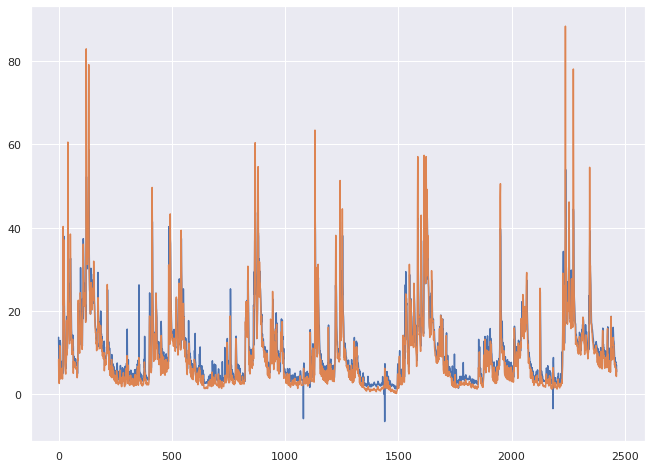

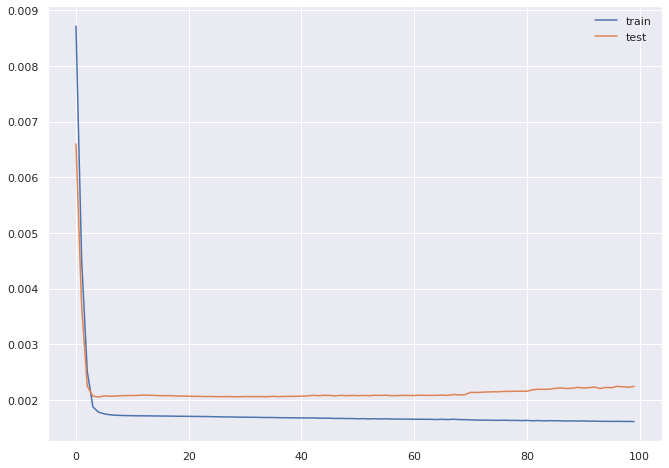

Dataset for imputation -            Date  Rainfall_Castel_del_Piano  ...  year  month
5479 2015-01-01                        NaN  ...  2015    Jan
5480 2015-01-02                        NaN  ...  2015    Jan
5481 2015-01-03                        NaN  ...  2015    Jan
5482 2015-01-04                        NaN  ...  2015    Jan
5483 2015-01-05                        NaN  ...  2015    Jan
...         ...                        ...  ...   ...    ...
7482 2020-06-26                        NaN  ...  2020    Jun
7483 2020-06-27                        NaN  ...  2020    Jun
7484 2020-06-28                        NaN  ...  2020    Jun
7485 2020-06-29                        NaN  ...  2020    Jun
7486 2020-06-30                        NaN  ...  2020    Jun

[2008 rows x 18 columns]
(613, 8)
(613,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


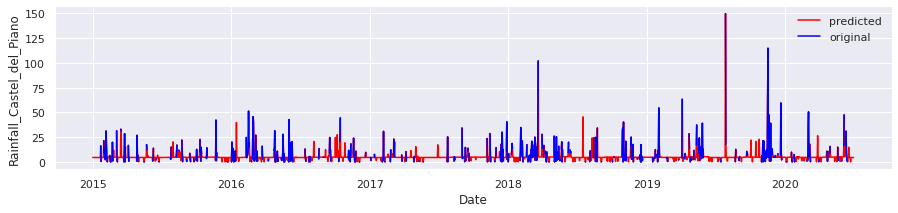

(610, 8)
(610,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


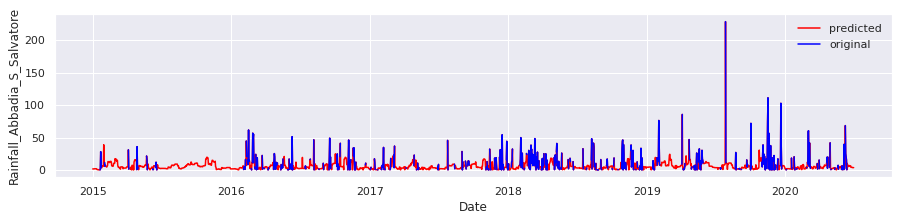

(643, 8)
(643,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


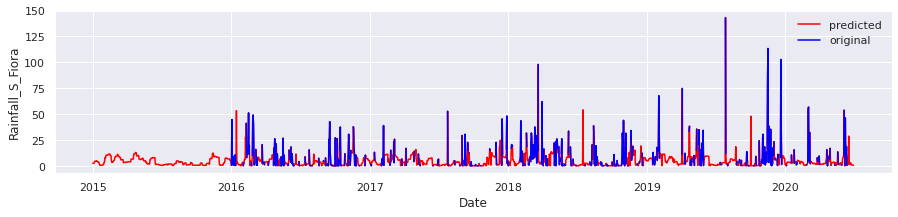

(889, 8)
(889,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


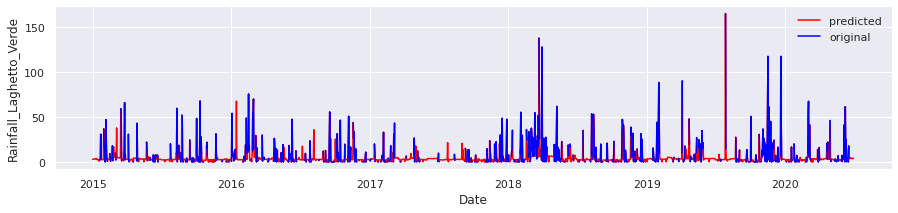

(863, 8)
(863,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


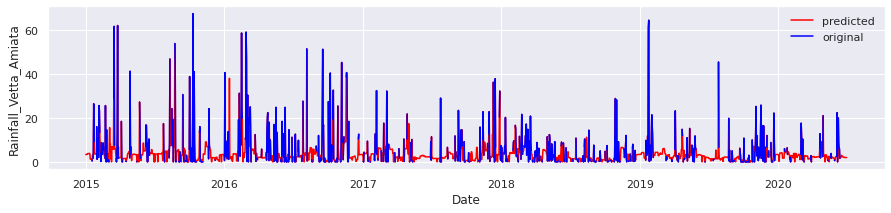

(1412, 8)
(1412,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


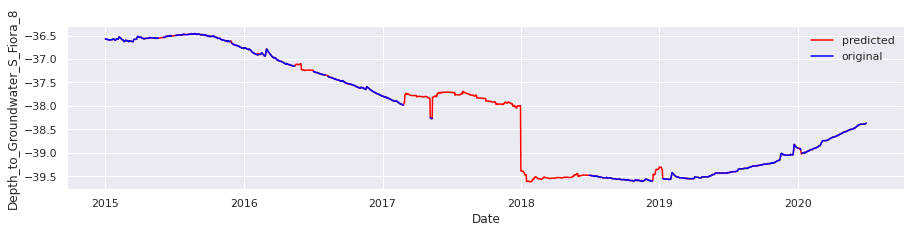

(1495, 8)
(1495,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


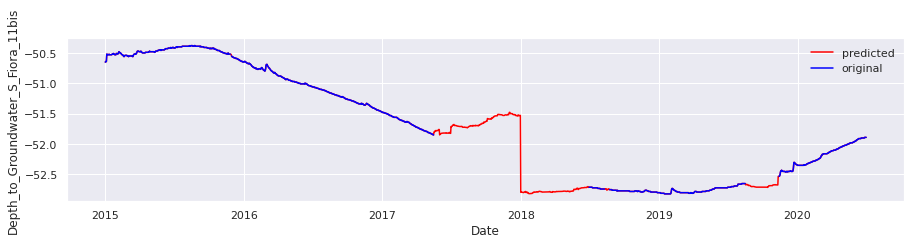

(1996, 8)
(1996,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


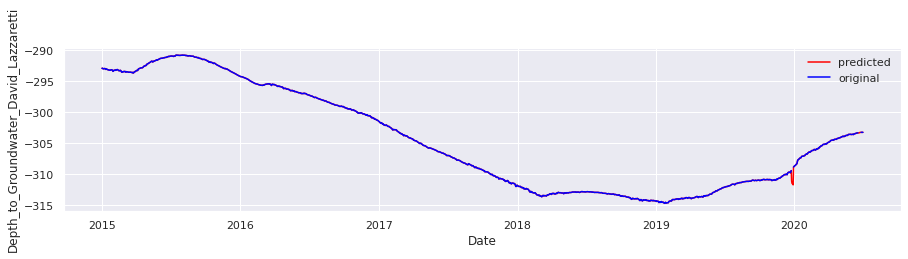

(1759, 8)
(1759,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


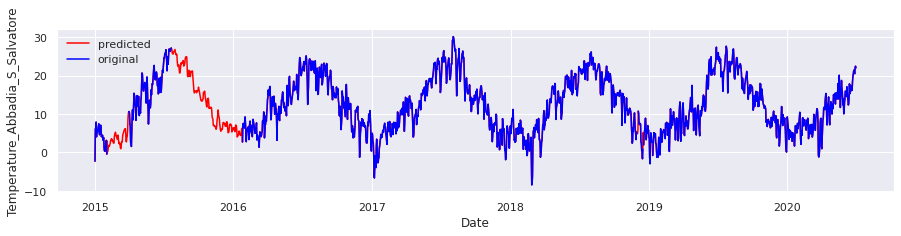

(2007, 8)
(2007,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


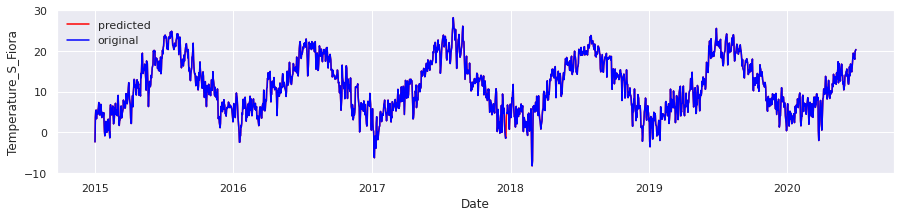

(2003, 8)
(2003,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


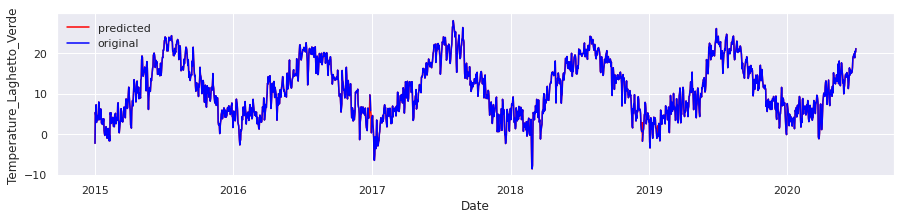

(1642, 8)
(1642,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


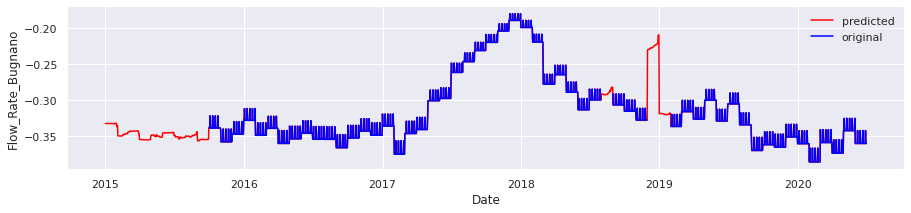

(1642, 8)
(1642,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


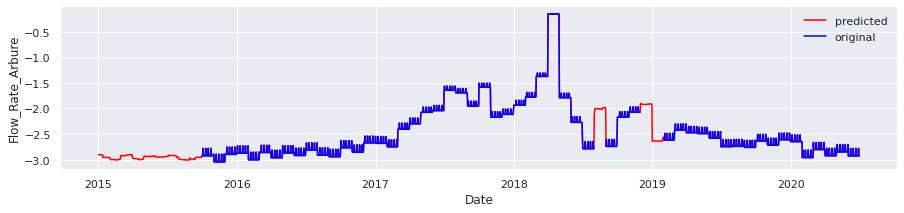

(1887, 8)
(1887,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


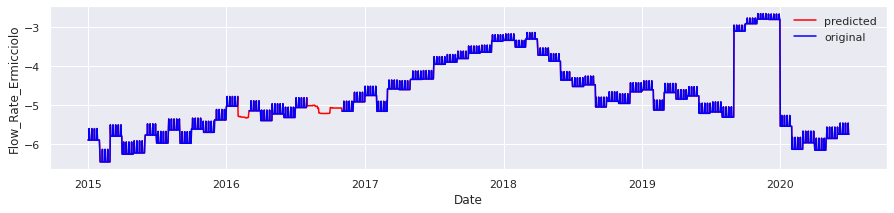

(2008, 8)
(2008,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


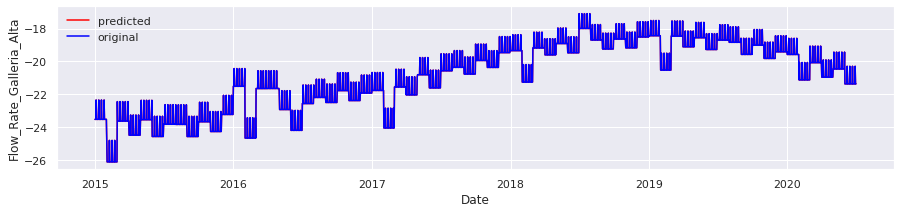


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Flow_Rate_Bugnano', 'Flow_Rate_Arbure', 'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta']
Index(['Rainfall_Castel_del_Piano', 'Rainfall_Abbadia_S_Salvatore',
       'Rainfall_S_Fiora', 'Rainfall_Laghetto_Verde', 'Rainfall_Vetta_Amiata',
       'Depth_to_Groundwater_S_Fiora_8', 'Depth_to_Groundwater_S_Fiora_11bis',
       'Depth_to_Groundwater_David_Lazzaretti',
       'Temperature_Abbadia_S_Salvatore', 'Temperature_S_Fiora',
       'Temperature_Laghetto_Verde', 'Flow_Rate_Bugnano', 'Flow_Rate_Arbure',
       'Flow_Rate_Ermicciolo', 'Flow_Rate_Galleria_Alta', 'year'],
      dtype='object')
-0.0013386881 0.00669344
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var5(t-1)',
       'var6(t-1)', 'var7(t-1)', 'var8(t-1)', 'var9(t-1)', 'var10(t-1)',
       'var11(t-1)', 'var12(t-1)', 'var13(t-1)', 'var14(t-1)', 'var15(t-1)',
       'var16(t-1)', 'var12(t)', 'var13(t)', 'var14(t)', 'var15(t)'],
      dtype='object')
1404 603
(1404, 1, 16) (1404,) (603, 1, 16

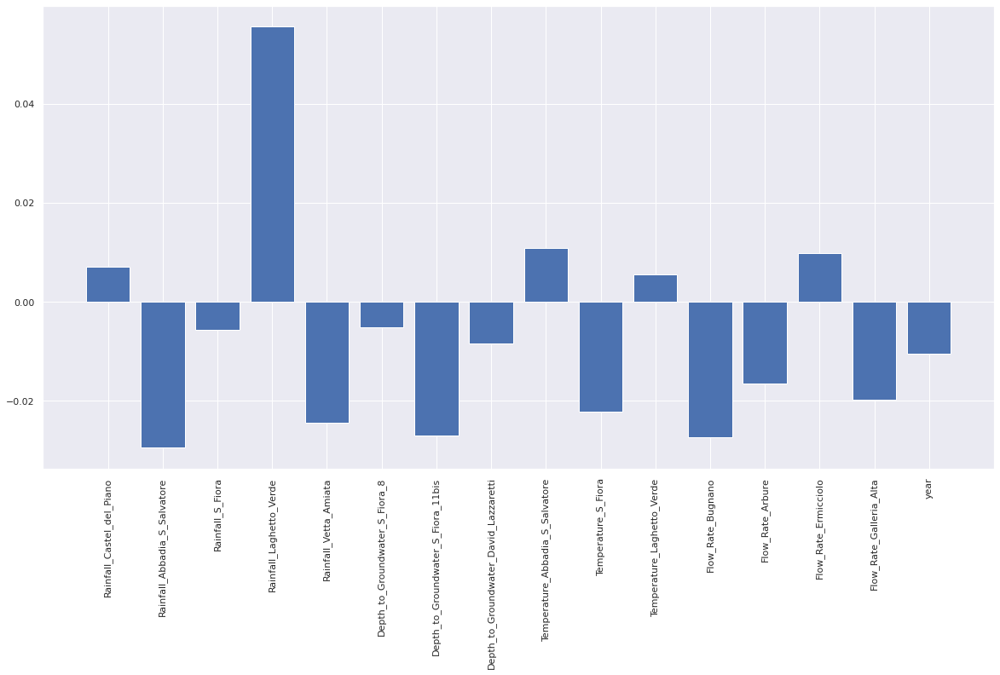

Selected Features - (array([ 1,  3,  4,  6,  9, 11]),)
foo shape - (1404, 1, 1, 6)
Train reshape - (1404, 1, 6)
foo shape - (603, 1, 1, 6)
Test reshape - (603, 1, 6)
Epoch 1/100
44/44 - 2s - loss: 0.2045 - val_loss: 0.3475
Epoch 2/100
44/44 - 0s - loss: 0.0817 - val_loss: 0.1941
Epoch 3/100
44/44 - 0s - loss: 0.0448 - val_loss: 0.1221
Epoch 4/100
44/44 - 0s - loss: 0.0422 - val_loss: 0.1001
Epoch 5/100
44/44 - 0s - loss: 0.0342 - val_loss: 0.0856
Epoch 6/100
44/44 - 0s - loss: 0.0266 - val_loss: 0.0721
Epoch 7/100
44/44 - 0s - loss: 0.0215 - val_loss: 0.0629
Epoch 8/100
44/44 - 0s - loss: 0.0186 - val_loss: 0.0576
Epoch 9/100
44/44 - 0s - loss: 0.0170 - val_loss: 0.0530
Epoch 10/100
44/44 - 0s - loss: 0.0162 - val_loss: 0.0495
Epoch 11/100
44/44 - 0s - loss: 0.0156 - val_loss: 0.0465
Epoch 12/100
44/44 - 0s - loss: 0.0152 - val_loss: 0.0437
Epoch 13/100
44/44 - 0s - loss: 0.0148 - val_loss: 0.0413
Epoch 14/100
44/44 - 0s - loss: 0.0144 - val_loss: 0.0391
Epoch 15/100
44/44 - 0s - loss:

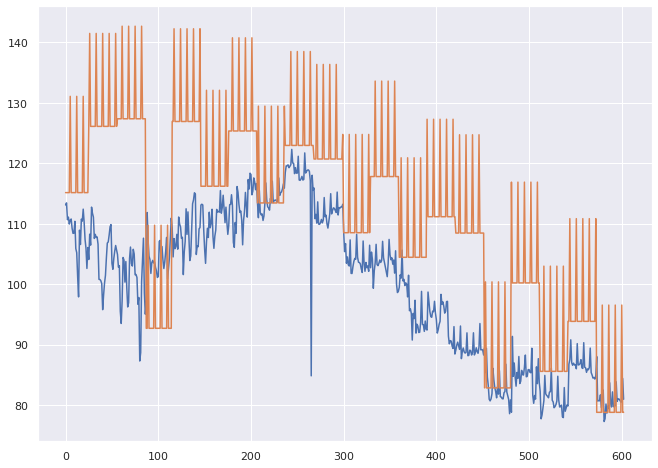

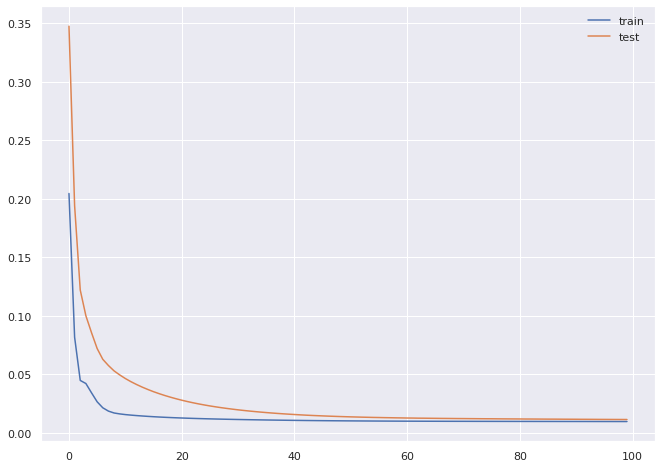

1404 603
(1404, 1, 16) (1404,) (603, 1, 16) (603,)
[-0.02825293  0.03167247  0.00491846  0.00893129  0.00243276  0.0053574
  0.02951402  0.04304113 -0.02693361  0.03601855  0.01451606  0.00840563
  0.00604125  0.06477621  0.00251029 -0.02431648]
Mean: 0.011164531
Standard Deviation: 0.024753023


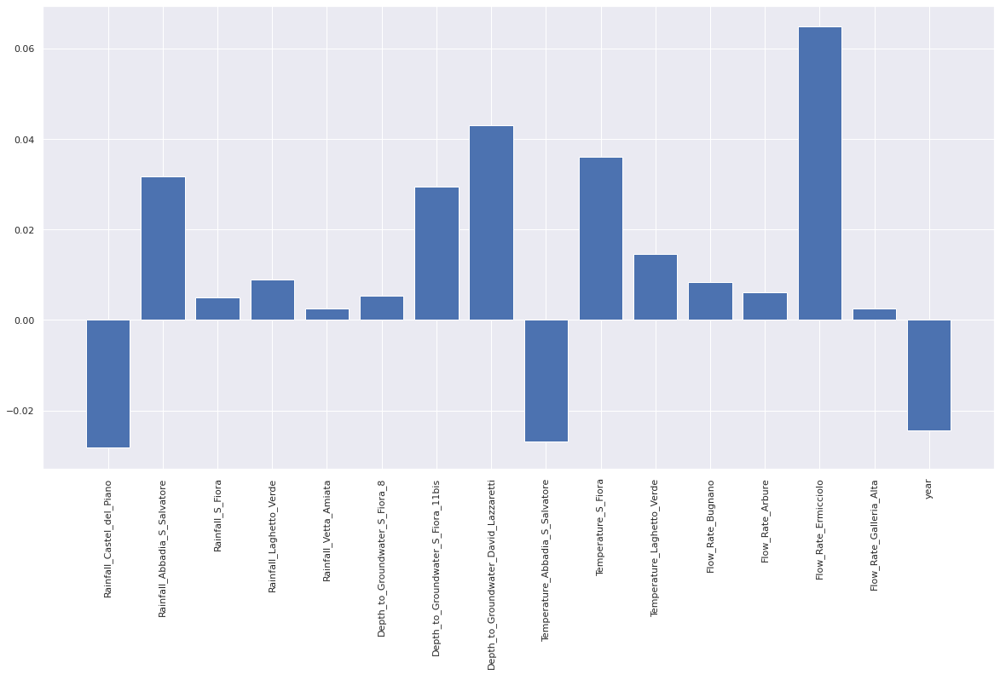

Selected Features - (array([ 0,  1,  6,  7,  8,  9, 13, 15]),)
foo shape - (1404, 1, 1, 8)
Train reshape - (1404, 1, 8)
foo shape - (603, 1, 1, 8)
Test reshape - (603, 1, 8)
Epoch 1/100
44/44 - 2s - loss: 0.1455 - val_loss: 0.1391
Epoch 2/100
44/44 - 0s - loss: 0.0694 - val_loss: 0.0763
Epoch 3/100
44/44 - 0s - loss: 0.0563 - val_loss: 0.0589
Epoch 4/100
44/44 - 0s - loss: 0.0405 - val_loss: 0.0552
Epoch 5/100
44/44 - 0s - loss: 0.0274 - val_loss: 0.0590
Epoch 6/100
44/44 - 0s - loss: 0.0175 - val_loss: 0.0682
Epoch 7/100
44/44 - 0s - loss: 0.0119 - val_loss: 0.0726
Epoch 8/100
44/44 - 0s - loss: 0.0091 - val_loss: 0.0739
Epoch 9/100
44/44 - 0s - loss: 0.0080 - val_loss: 0.0728
Epoch 10/100
44/44 - 0s - loss: 0.0074 - val_loss: 0.0708
Epoch 11/100
44/44 - 0s - loss: 0.0068 - val_loss: 0.0686
Epoch 12/100
44/44 - 0s - loss: 0.0063 - val_loss: 0.0663
Epoch 13/100
44/44 - 0s - loss: 0.0060 - val_loss: 0.0653
Epoch 14/100
44/44 - 0s - loss: 0.0055 - val_loss: 0.0625
Epoch 15/100
44/44 - 0s

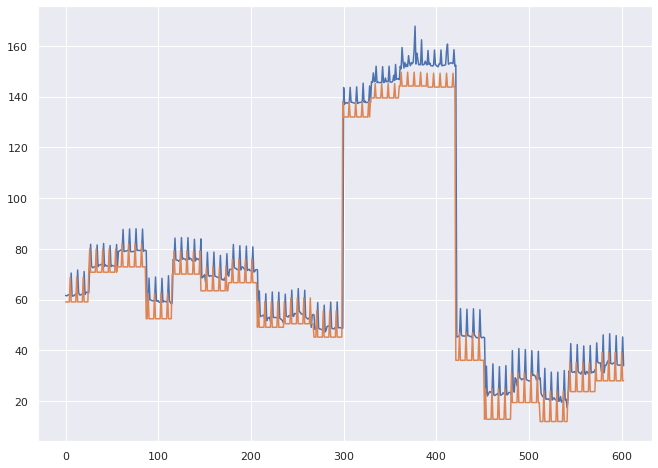

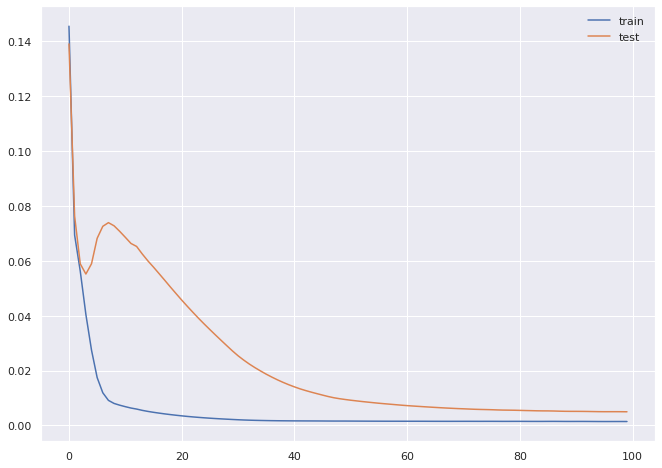

1404 603
(1404, 1, 16) (1404,) (603, 1, 16) (603,)
[-0.01992892 -0.00306198  0.03558884 -0.00135314  0.00124014 -0.00304945
  0.01013958 -0.01801516 -0.01815328 -0.00237264 -0.00457879  0.00170192
 -0.01261232  0.01313005  0.02206267 -0.0048521 ]
Mean: -0.00025716046
Standard Deviation: 0.014389398


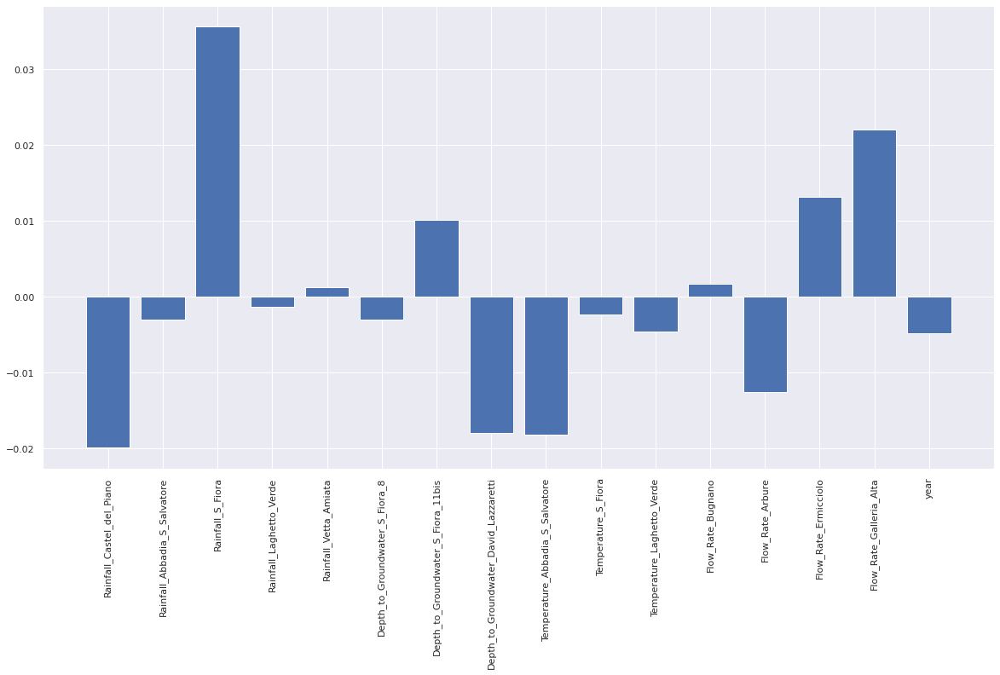

Selected Features - (array([ 2, 14]),)
foo shape - (1404, 1, 1, 2)
Train reshape - (1404, 1, 2)
foo shape - (603, 1, 1, 2)
Test reshape - (603, 1, 2)
Epoch 1/100
44/44 - 2s - loss: 0.0431 - val_loss: 0.0078
Epoch 2/100
44/44 - 0s - loss: 0.0345 - val_loss: 0.0142
Epoch 3/100
44/44 - 0s - loss: 0.0338 - val_loss: 0.0188
Epoch 4/100
44/44 - 0s - loss: 0.0338 - val_loss: 0.0215
Epoch 5/100
44/44 - 0s - loss: 0.0333 - val_loss: 0.0232
Epoch 6/100
44/44 - 0s - loss: 0.0328 - val_loss: 0.0245
Epoch 7/100
44/44 - 0s - loss: 0.0322 - val_loss: 0.0256
Epoch 8/100
44/44 - 0s - loss: 0.0316 - val_loss: 0.0267
Epoch 9/100
44/44 - 0s - loss: 0.0311 - val_loss: 0.0278
Epoch 10/100
44/44 - 0s - loss: 0.0306 - val_loss: 0.0289
Epoch 11/100
44/44 - 0s - loss: 0.0301 - val_loss: 0.0301
Epoch 12/100
44/44 - 0s - loss: 0.0296 - val_loss: 0.0313
Epoch 13/100
44/44 - 0s - loss: 0.0291 - val_loss: 0.0325
Epoch 14/100
44/44 - 0s - loss: 0.0286 - val_loss: 0.0337
Epoch 15/100
44/44 - 0s - loss: 0.0282 - val_lo

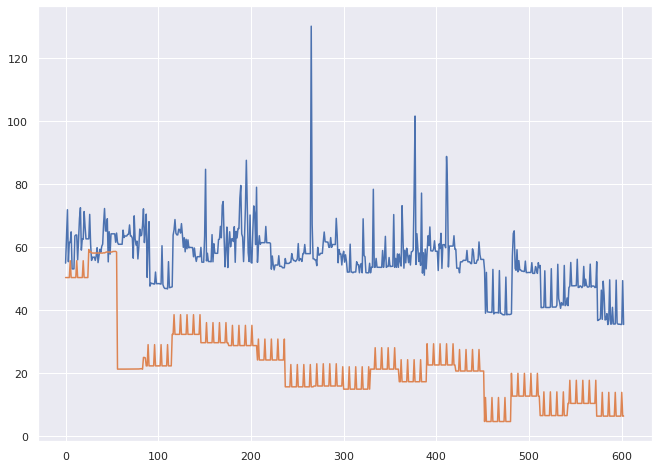

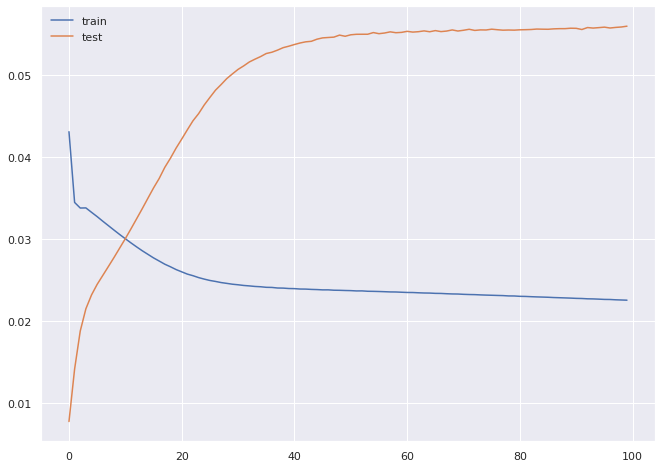

1404 603
(1404, 1, 16) (1404,) (603, 1, 16) (603,)
[ 0.00255969  0.00147047  0.03496365 -0.01909439  0.04947648 -0.07139643
  0.00976738 -0.00031385  0.0255281  -0.04443739  0.00440338  0.09225507
 -0.01824603 -0.01077843  0.04505943  0.07781806]
Mean: 0.011189699
Standard Deviation: 0.041022204


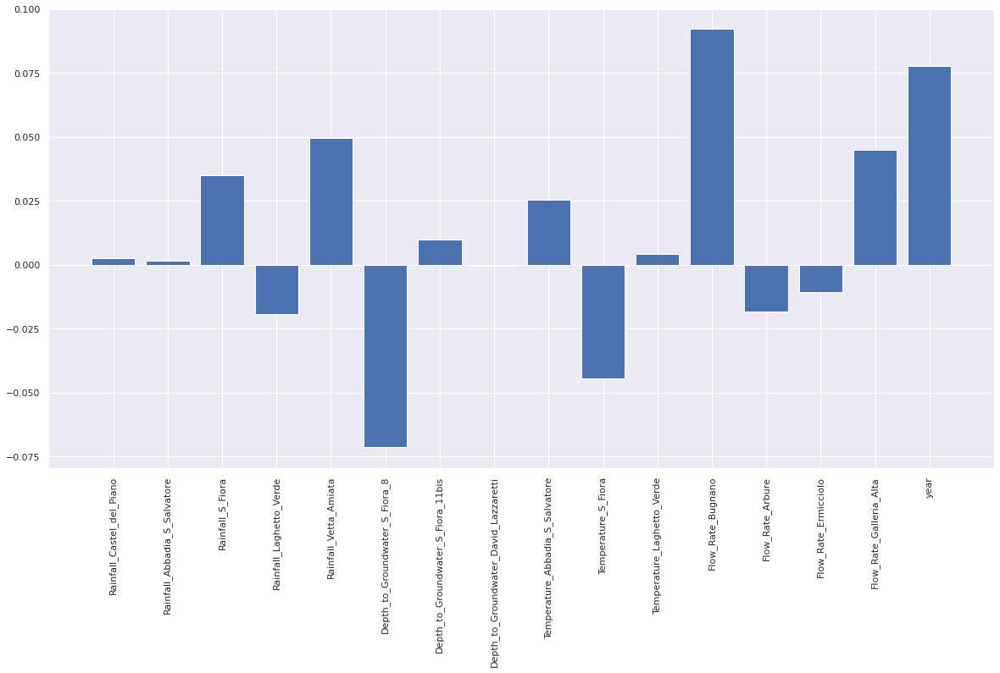

Selected Features - (array([ 2,  4,  5,  8,  9, 11, 14, 15]),)
foo shape - (1404, 1, 1, 8)
Train reshape - (1404, 1, 8)
foo shape - (603, 1, 1, 8)
Test reshape - (603, 1, 8)
Epoch 1/100
44/44 - 2s - loss: 0.1082 - val_loss: 0.0261
Epoch 2/100
44/44 - 0s - loss: 0.0474 - val_loss: 0.0473
Epoch 3/100
44/44 - 0s - loss: 0.0437 - val_loss: 0.0617
Epoch 4/100
44/44 - 0s - loss: 0.0387 - val_loss: 0.0703
Epoch 5/100
44/44 - 0s - loss: 0.0339 - val_loss: 0.0797
Epoch 6/100
44/44 - 0s - loss: 0.0296 - val_loss: 0.0851
Epoch 7/100
44/44 - 0s - loss: 0.0259 - val_loss: 0.0896
Epoch 8/100
44/44 - 0s - loss: 0.0229 - val_loss: 0.0926
Epoch 9/100
44/44 - 0s - loss: 0.0204 - val_loss: 0.0920
Epoch 10/100
44/44 - 0s - loss: 0.0181 - val_loss: 0.0891
Epoch 11/100
44/44 - 0s - loss: 0.0161 - val_loss: 0.0846
Epoch 12/100
44/44 - 0s - loss: 0.0143 - val_loss: 0.0788
Epoch 13/100
44/44 - 0s - loss: 0.0126 - val_loss: 0.0722
Epoch 14/100
44/44 - 0s - loss: 0.0109 - val_loss: 0.0651
Epoch 15/100
44/44 - 0s

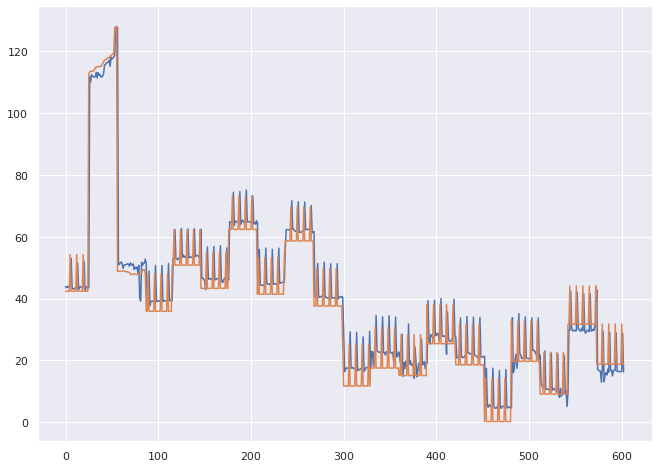

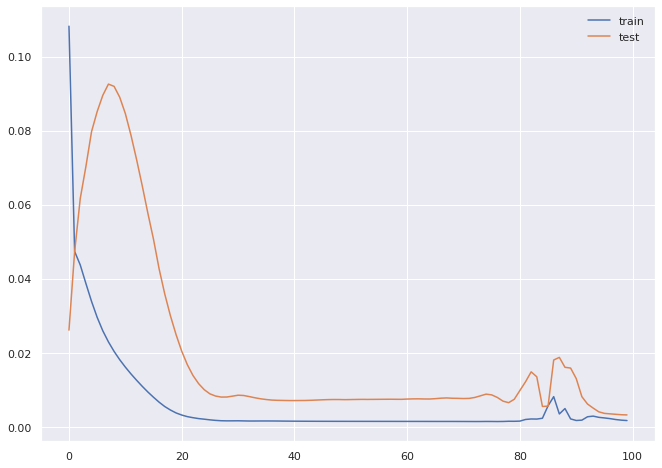

Dataset for imputation -            Date  Rainfall_Terni  Flow_Rate_Lupa  year month
0    2009-01-01           2.797             NaN  2009   Jan
1    2009-01-02           2.797             NaN  2009   Jan
2    2009-01-03           2.797             NaN  2009   Jan
3    2009-01-04           2.797             NaN  2009   Jan
4    2009-01-05           2.797             NaN  2009   Jan
...         ...             ...             ...   ...   ...
4194 2020-06-26             NaN          -73.93  2020   Jun
4195 2020-06-27             NaN          -73.60  2020   Jun
4196 2020-06-28             NaN          -73.14  2020   Jun
4197 2020-06-29             NaN          -72.88  2020   Jun
4198 2020-06-30             NaN          -72.55  2020   Jun

[4199 rows x 5 columns]
(4096, 8)
(4096,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)


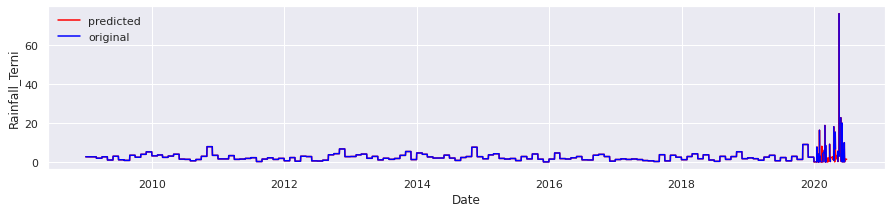

(3816, 8)
(3816,)


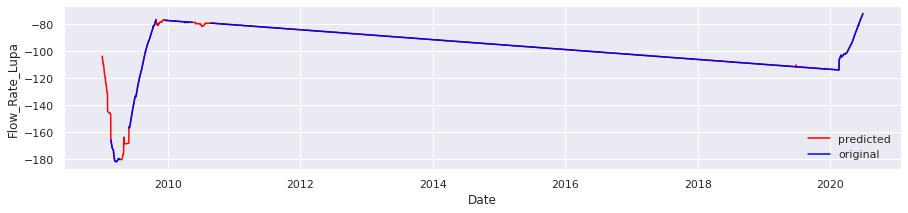

target Attributes - ['Flow_Rate_Lupa']
Index(['Rainfall_Terni', 'Flow_Rate_Lupa', 'year'], dtype='object')
-0.0024269284 0.013189828
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var2(t)'], dtype='object')
2938 1260
(2938, 1, 3) (2938,) (1260, 1, 3) (1260,)
[ 0.01121196 -0.01923502  0.05259382]
Mean: 0.014856921
Standard Deviation: 0.029437052


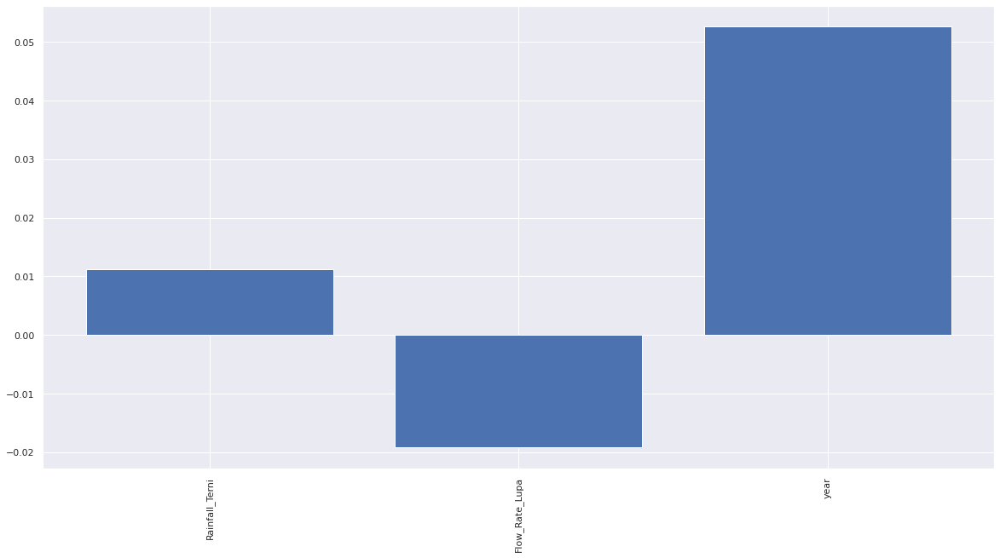

Selected Features - (array([2]),)
foo shape - (2938, 1, 1, 1)
Train reshape - (2938, 1, 1)
foo shape - (1260, 1, 1, 1)
Test reshape - (1260, 1, 1)
Epoch 1/100
92/92 - 2s - loss: 0.5059 - val_loss: 0.1103
Epoch 2/100
92/92 - 0s - loss: 0.2012 - val_loss: 0.0365
Epoch 3/100
92/92 - 0s - loss: 0.0705 - val_loss: 0.1197
Epoch 4/100
92/92 - 0s - loss: 0.0552 - val_loss: 0.1070
Epoch 5/100
92/92 - 0s - loss: 0.0503 - val_loss: 0.0911
Epoch 6/100
92/92 - 0s - loss: 0.0464 - val_loss: 0.0773
Epoch 7/100
92/92 - 0s - loss: 0.0432 - val_loss: 0.0655
Epoch 8/100
92/92 - 1s - loss: 0.0408 - val_loss: 0.0555
Epoch 9/100
92/92 - 0s - loss: 0.0389 - val_loss: 0.0472
Epoch 10/100
92/92 - 0s - loss: 0.0374 - val_loss: 0.0403
Epoch 11/100
92/92 - 0s - loss: 0.0363 - val_loss: 0.0346
Epoch 12/100
92/92 - 0s - loss: 0.0355 - val_loss: 0.0299
Epoch 13/100
92/92 - 0s - loss: 0.0349 - val_loss: 0.0260
Epoch 14/100
92/92 - 0s - loss: 0.0345 - val_loss: 0.0229
Epoch 15/100
92/92 - 0s - loss: 0.0343 - val_loss:

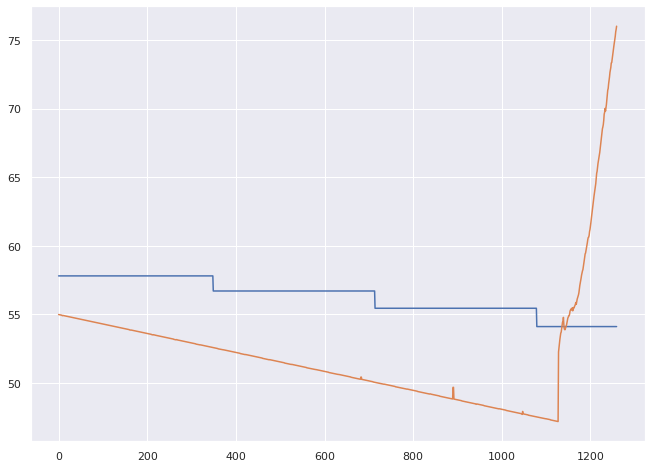

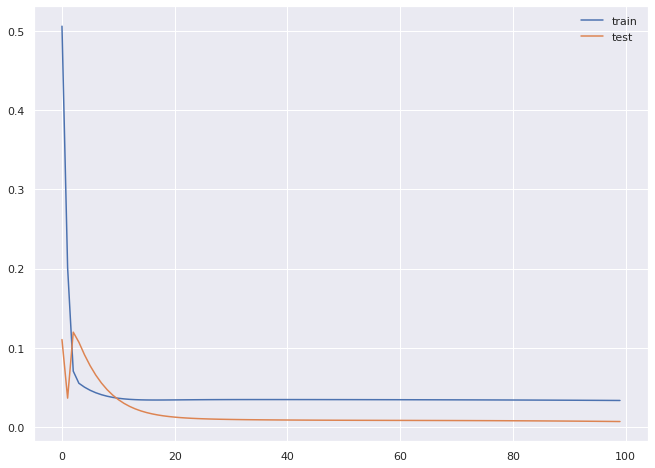

Dataset for imputation -            Date  Rainfall_Settefrati  ...  year  month
1096 2015-01-01                  5.2  ...  2015    Jan
1097 2015-01-02                  1.8  ...  2015    Jan
1098 2015-01-03                  NaN  ...  2015    Jan
1099 2015-01-04                  0.4  ...  2015    Jan
1100 2015-01-05                  NaN  ...  2015    Jan
...         ...                  ...  ...   ...    ...
3099 2020-06-26                  NaN  ...  2020    Jun
3100 2020-06-27                  NaN  ...  2020    Jun
3101 2020-06-28                  NaN  ...  2020    Jun
3102 2020-06-29                  NaN  ...  2020    Jun
3103 2020-06-30                  NaN  ...  2020    Jun

[2008 rows x 6 columns]
(627, 8)
(627,)


weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


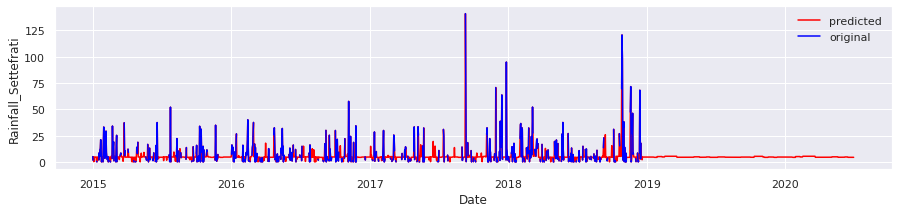

(1461, 8)
(1461,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


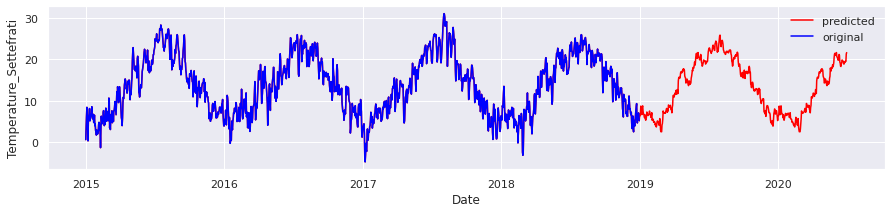

(1387, 8)
(1387,)



A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


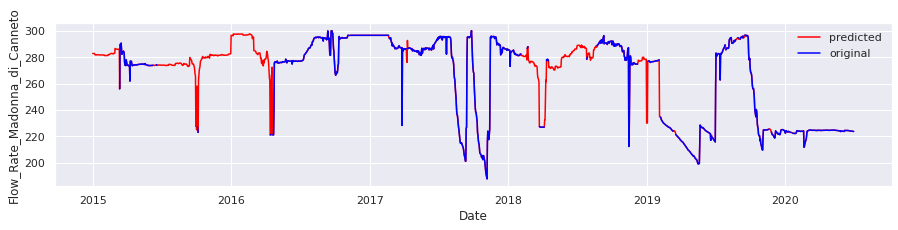


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


target Attributes - ['Flow_Rate_Madonna_di_Canneto']
Index(['Rainfall_Settefrati', 'Temperature_Settefrati',
       'Flow_Rate_Madonna_di_Canneto', 'year'],
      dtype='object')
-0.001422475 0.007112375
Index(['var1(t-1)', 'var2(t-1)', 'var3(t-1)', 'var4(t-1)', 'var3(t)'], dtype='object')
1404 603
(1404, 1, 4) (1404,) (603, 1, 4) (603,)
[-0.00420695 -0.01261418  0.01575888  0.03946825]
Mean: 0.009601502
Standard Deviation: 0.020088216


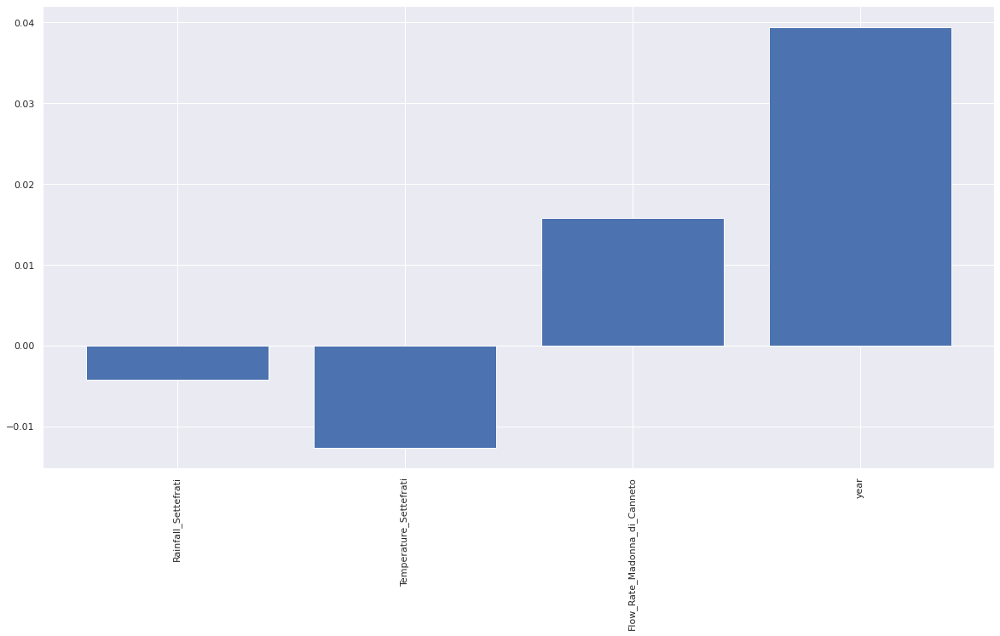

Selected Features - (array([3]),)
foo shape - (1404, 1, 1, 1)
Train reshape - (1404, 1, 1)
foo shape - (603, 1, 1, 1)
Test reshape - (603, 1, 1)
Epoch 1/100
44/44 - 2s - loss: 0.6235 - val_loss: 0.1784
Epoch 2/100
44/44 - 0s - loss: 0.4799 - val_loss: 0.1012
Epoch 3/100
44/44 - 0s - loss: 0.3273 - val_loss: 0.0777
Epoch 4/100
44/44 - 0s - loss: 0.1882 - val_loss: 0.1672
Epoch 5/100
44/44 - 0s - loss: 0.0988 - val_loss: 0.3457
Epoch 6/100
44/44 - 0s - loss: 0.0649 - val_loss: 0.4625
Epoch 7/100
44/44 - 0s - loss: 0.0548 - val_loss: 0.4828
Epoch 8/100
44/44 - 0s - loss: 0.0506 - val_loss: 0.4683
Epoch 9/100
44/44 - 0s - loss: 0.0479 - val_loss: 0.4476
Epoch 10/100
44/44 - 0s - loss: 0.0458 - val_loss: 0.4270
Epoch 11/100
44/44 - 0s - loss: 0.0439 - val_loss: 0.4076
Epoch 12/100
44/44 - 0s - loss: 0.0422 - val_loss: 0.3896
Epoch 13/100
44/44 - 0s - loss: 0.0407 - val_loss: 0.3729
Epoch 14/100
44/44 - 0s - loss: 0.0394 - val_loss: 0.3573
Epoch 15/100
44/44 - 0s - loss: 0.0382 - val_loss: 0

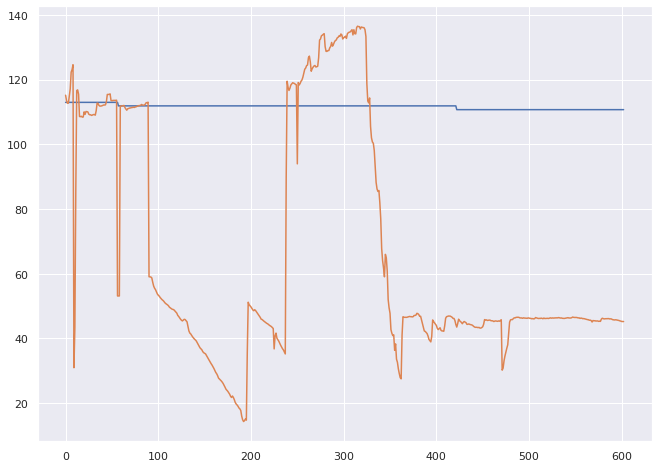

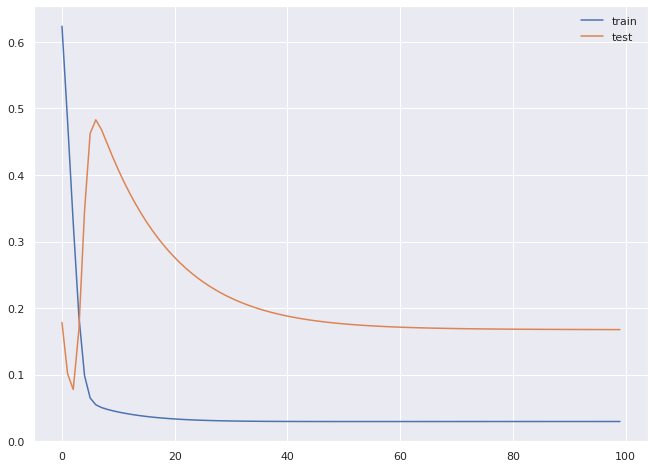

In [ ]:
for acea_df,acea_df_target in zip(all_data,all_data_target):
    print("Dataset for imputation - " + str(acea_df))
    acea_df = data_impute(acea_df)
    print("target Attributes - " + str(acea_df_target))
    forecast(acea_df,acea_df_target)


## XGBOOST

In [ ]:
# Aquifer_Doganella.columns

In [ ]:
# import xgboost as xgb
# from sklearn.model_selection import KFold, train_test_split, GridSearchCV

# # define model
# model = xgb.XGBRegressor()


In [ ]:
# from sklearn.metrics import mean_squared_error, mean_absolute_error

# print("Parameter optimization")
# xgb_model = xgb.XGBRegressor(n_jobs=1)
# clf = GridSearchCV(xgb_model,scoring = 'neg_mean_absolute_error',
#                    param_grid = {'max_depth': [2, 4, 6],
#                     'n_estimators': [50, 100, 200]}, verbose=1, n_jobs=1)
# clf.fit(X.values, y.values)
# print(clf.best_score_)
# print(clf.best_params_)
# param = clf.best_params_

In [ ]:
# xgb_model = xgb.XGBRegressor(max_depth=4,n_estimators=50).fit(X_train.values, y_train.values)
# predictions = xgb_model.predict(X_test.values)
# actuals = y_test.values
# print('MSE: ')
# print(mean_squared_error(actuals, predictions))
# print('MAE: ')
# print(mean_absolute_error(actuals,predictions))
    
# xgb.plot_importance(xgb_model) 

In [ ]:
# plt.plot(actuals)
# plt.plot(predictions)

## ARIMA

In [ ]:
"""!pip install chart_studio
import chart_studio.plotly as ply
import cufflinks as cf

!pip install pmdarima
import pmdarima as pm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
from math import sqrt

from pandas import datetime
from sklearn.metrics import mean_squared_error"""

'!pip install chart_studio\nimport chart_studio.plotly as ply\nimport cufflinks as cf\n\n!pip install pmdarima\nimport pmdarima as pm\nfrom statsmodels.graphics.tsaplots import plot_acf, plot_pacf\nimport warnings\nfrom math import sqrt\n\nfrom pandas import datetime\nfrom sklearn.metrics import mean_squared_error'

In [ ]:
"""fig, axes = plt.subplots(3, 2, sharex=True)

axes[0, 0].plot(df.Depth_to_Groundwater_Pozzo_1); 
axes[0, 0].set_title('Original Series')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.squeeze(), ax=axes[0, 1])

# 1st Differencing
axes[1, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff()); 
axes[1, 0].set_title('1st Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().dropna(), ax=axes[1, 1])

# 2nd Differencing
axes[2, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff().diff()); 
axes[2, 0].set_title('2nd Order Differencing')
plot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().diff().dropna(), ax=axes[2, 1])

plt.show()"""

"fig, axes = plt.subplots(3, 2, sharex=True)\n\naxes[0, 0].plot(df.Depth_to_Groundwater_Pozzo_1); \naxes[0, 0].set_title('Original Series')\nplot_acf(df.Depth_to_Groundwater_Pozzo_1.squeeze(), ax=axes[0, 1])\n\n# 1st Differencing\naxes[1, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff()); \naxes[1, 0].set_title('1st Order Differencing')\nplot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().dropna(), ax=axes[1, 1])\n\n# 2nd Differencing\naxes[2, 0].plot(df.Depth_to_Groundwater_Pozzo_1.diff().diff()); \naxes[2, 0].set_title('2nd Order Differencing')\nplot_acf(df.Depth_to_Groundwater_Pozzo_1.diff().diff().dropna(), ax=axes[2, 1])\n\nplt.show()"

In [ ]:
"""def evaluate_arima_model(X, arima_order):
	# prepare training dataset
	train_size = int(len(X) * 0.66)
	train, test = X[0:train_size], X[train_size:]
	history = [x for x in train]
	# make predictions
	predictions = list()
	for t in range(len(test)):
		model = ARIMA(history, order=arima_order)
		model_fit = model.fit()
		yhat = model_fit.forecast()[0]
		predictions.append(yhat)
		history.append(test[t])
	# calculate out of sample error
	rmse = sqrt(mean_squared_error(test, predictions))
	return rmse
 
# evaluate combinations of p, d and q values for an ARIMA model
def evaluate_models(dataset, p_values, d_values, q_values):
	dataset = dataset.astype('float32')
	best_score, best_cfg = float("inf"), None
	for p in p_values:
		for d in d_values:
			for q in q_values:
				order = (p,d,q)
				try:
					rmse = evaluate_arima_model(dataset, order)
					if rmse < best_score:
						best_score, best_cfg = rmse, order
					print('ARIMA%s RMSE=%.3f' % (order,rmse))
				except:
					continue
	print('Best ARIMA%s RMSE=%.3f' % (best_cfg, best_score))
 
p_values = [0, 1, 2, 4, 6, 8, 10]
d_values = range(0, 3)
q_values = range(0, 3)
warnings.filterwarnings("ignore")
evaluate_models(df.values, p_values, d_values, q_values)"""

'def evaluate_arima_model(X, arima_order):\n\t# prepare training dataset\n\ttrain_size = int(len(X) * 0.66)\n\ttrain, test = X[0:train_size], X[train_size:]\n\thistory = [x for x in train]\n\t# make predictions\n\tpredictions = list()\n\tfor t in range(len(test)):\n\t\tmodel = ARIMA(history, order=arima_order)\n\t\tmodel_fit = model.fit()\n\t\tyhat = model_fit.forecast()[0]\n\t\tpredictions.append(yhat)\n\t\thistory.append(test[t])\n\t# calculate out of sample error\n\trmse = sqrt(mean_squared_error(test, predictions))\n\treturn rmse\n \n# evaluate combinations of p, d and q values for an ARIMA model\ndef evaluate_models(dataset, p_values, d_values, q_values):\n\tdataset = dataset.astype(\'float32\')\n\tbest_score, best_cfg = float("inf"), None\n\tfor p in p_values:\n\t\tfor d in d_values:\n\t\t\tfor q in q_values:\n\t\t\t\torder = (p,d,q)\n\t\t\t\ttry:\n\t\t\t\t\trmse = evaluate_arima_model(dataset, order)\n\t\t\t\t\tif rmse < best_score:\n\t\t\t\t\t\tbest_score, best_cfg = rmse, orde

In [ ]:
"""model = pm.auto_arima(df.Depth_to_Groundwater_Pozzo_1, start_p=1, start_q=1,
                          test='adf',  # use adftest to find optimal 'd'
                          max_p=5, max_q=5,  # maximum p and q
                          m=4,  # frequency of series
                          d=None,  # let model determine 'd'
                          seasonal=True,  # No Seasonality
                          start_P=0,
                          D=0,
                          trace=True,
                          error_action='ignore',
                          suppress_warnings=True)"""

"model = pm.auto_arima(df.Depth_to_Groundwater_Pozzo_1, start_p=1, start_q=1,\n                          test='adf',  # use adftest to find optimal 'd'\n                          max_p=5, max_q=5,  # maximum p and q\n                          m=4,  # frequency of series\n                          d=None,  # let model determine 'd'\n                          seasonal=True,  # No Seasonality\n                          start_P=0,\n                          D=0,\n                          trace=True,\n                          error_action='ignore',\n                          suppress_warnings=True)"

In [ ]:
"""stepwise_model.summary()
stepwise_model.fit(train).fit(train)
pred = pd.DataFrame(stepwise_model.fit(train).predict(n_periods = len(test)),index=test.index)
pred.columns = ['pred']
pred
plt.plot(train,label="train")
plt.plot(test,label="test")
plt.plot(pred,label="pred")"""

'stepwise_model.summary()\nstepwise_model.fit(train).fit(train)\npred = pd.DataFrame(stepwise_model.fit(train).predict(n_periods = len(test)),index=test.index)\npred.columns = [\'pred\']\npred\nplt.plot(train,label="train")\nplt.plot(test,label="test")\nplt.plot(pred,label="pred")'